In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings(action="ignore")

#### importing the data

In [2]:
df = pd.read_csv("application_data.csv")
prev_app_df = pd.read_csv("previous_application.csv")

#### data understandng

In [3]:
df.shape 

(307511, 122)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [5]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


## 2. checking if diferent columns can make any affect on our target variable thru general sense 
#### the completely unrelated columns can be dropped for efficient analysis

In [7]:
# Completely Irrelevant: ‘NAME_TYPE_SUITE’ , ‘REGION_RATING_CLIENT’ , ‘REGION_RATING_CLIENT_W_CITY’ , ‘WEEKDAY_APPR_PROCESS_START’ , ‘HOUR_APPR_PROCESS_START’ , ‘EXT_SOURCE_1’ , ‘EXT_SOURCE_2’ , ‘EXT_SOURCE_3’ ,‘DAYS_LAST_PHONE_CHANGE’
# All these columns either irrelevant to our objective or shows vague data, which will not give any actionable insights wrt our objective, even if they somehow correlate with other columns. 
# Similarly, data related to whether client has provided contact numbers or emails does not seem to have any value. Same goes for columns which describe whether the client has provided specific documents or not, whether the contact address is matching with word address or not etc . The lender can easily decide as per their standard procedure for loan approval for such cases.
# Can be Useful = ‘OWN_CAR_AGE’ , ‘REGION_POPULATION_RELATIVE’ , and all the 51 columns describing attributes of where clients lives. Out of these, we will consider average apartment size, average age of building, elevators/entrances , floors , emergency state, house type etc to check if they provide any value to our analysis. 
# Definitely useful = Apart from the above, others seem to have some effect in our analysis. So we will include all.


In [8]:
df_new = df.drop(df.columns[95:116] , axis = 1)

In [9]:
df_new = df_new.drop(df.columns[54:86] , axis = 1)

In [10]:
df_new.shape

(307511, 69)

In [11]:
df_new = df_new.drop(df.columns[30:40] , axis = 1)

In [12]:
df_new = df_new.drop(df.columns[22:28] , axis = 1)

In [13]:
df_new = df_new.drop(['NAME_TYPE_SUITE' , 'EXT_SOURCE_1' , 'EXT_SOURCE_2' , 'EXT_SOURCE_3' ,'BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG', 'COMMONAREA_AVG'], axis = 1)
df.shape , df_new.shape

((307511, 122), (307511, 46))

#### checking for null values

In [14]:
#we can find there is a lot of null values in some of the columns. Lets have a look at top 15.

In [15]:
null = df_new.isna().sum()/len(df)
null.sort_values(ascending = False).head(15)

FONDKAPREMONT_MODE            0.683862
FLOORSMIN_AVG                 0.678486
YEARS_BUILD_AVG               0.664978
OWN_CAR_AGE                   0.659908
LANDAREA_AVG                  0.593767
ELEVATORS_AVG                 0.532960
WALLSMATERIAL_MODE            0.508408
APARTMENTS_AVG                0.507497
ENTRANCES_AVG                 0.503488
HOUSETYPE_MODE                0.501761
FLOORSMAX_AVG                 0.497608
TOTALAREA_MODE                0.482685
EMERGENCYSTATE_MODE           0.473983
OCCUPATION_TYPE               0.313455
AMT_REQ_CREDIT_BUREAU_HOUR    0.135016
dtype: float64

In [16]:
#We can see , 13 out of top 15 have more than 47% of null values present. Filling out so many null values without any basis can skew our analysis. Also if we look in detail, these are those columns which we thought can be useful , but they have lesser capacity to influence our analysis(Missing Completely at Random). So we will drop these records as well. 

In [17]:
null_dropped = null[null > 0.47]
null_dropped.index 

Index(['OWN_CAR_AGE', 'APARTMENTS_AVG', 'YEARS_BUILD_AVG', 'ELEVATORS_AVG',
       'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'TOTALAREA_MODE',
       'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')

In [18]:
df_new.drop(null_dropped.index , axis = 1, inplace = True)

In [19]:
df_new.shape

(307511, 33)

In [20]:

# After these deletion we are left with 33 columns. 
# Again checking null value counts, we have 14 columns having null values. The most null values present in ‘OCCUPATION_TYPE’ . Lets examine this column. 
# Imputation of missing values for this column seems problematic, as this can greatly affect our analysis. So we will create ‘Others’ for the null values. 

In [21]:
null_new = df_new.isna().sum()/len(df)

In [22]:
null_new.sort_values(ascending = False).head(15)

OCCUPATION_TYPE               0.313455
AMT_REQ_CREDIT_BUREAU_YEAR    0.135016
AMT_REQ_CREDIT_BUREAU_QRT     0.135016
AMT_REQ_CREDIT_BUREAU_MON     0.135016
AMT_REQ_CREDIT_BUREAU_WEEK    0.135016
AMT_REQ_CREDIT_BUREAU_DAY     0.135016
AMT_REQ_CREDIT_BUREAU_HOUR    0.135016
DEF_30_CNT_SOCIAL_CIRCLE      0.003320
OBS_30_CNT_SOCIAL_CIRCLE      0.003320
OBS_60_CNT_SOCIAL_CIRCLE      0.003320
DEF_60_CNT_SOCIAL_CIRCLE      0.003320
AMT_GOODS_PRICE               0.000904
AMT_ANNUITY                   0.000039
CNT_FAM_MEMBERS               0.000007
DAYS_REGISTRATION             0.000000
dtype: float64

In [23]:
df_new.OCCUPATION_TYPE.value_counts()/len(df_new)

Laborers                 0.179460
Sales staff              0.104393
Core staff               0.089655
Managers                 0.069497
Drivers                  0.060495
High skill tech staff    0.037007
Accountants              0.031911
Medicine staff           0.027762
Security staff           0.021856
Cooking staff            0.019336
Cleaning staff           0.015131
Private service staff    0.008624
Low-skill Laborers       0.006806
Waiters/barmen staff     0.004384
Secretaries              0.004244
Realty agents            0.002442
HR staff                 0.001831
IT staff                 0.001711
Name: OCCUPATION_TYPE, dtype: float64

In [24]:
df_new.OCCUPATION_TYPE.unique()

array(['Laborers', 'Core staff', 'Accountants', 'Managers', nan,
       'Drivers', 'Sales staff', 'Cleaning staff', 'Cooking staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

In [25]:
df_new.OCCUPATION_TYPE[df_new.OCCUPATION_TYPE.isna()] = 'Others'

In [26]:
null_new = null_new[null_new > 0]

In [27]:
null_new.index

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [28]:
df_new[null_new.index].nunique()

AMT_ANNUITY                   13672
AMT_GOODS_PRICE                1002
OCCUPATION_TYPE                  19
CNT_FAM_MEMBERS                  17
OBS_30_CNT_SOCIAL_CIRCLE         33
DEF_30_CNT_SOCIAL_CIRCLE         10
OBS_60_CNT_SOCIAL_CIRCLE         33
DEF_60_CNT_SOCIAL_CIRCLE          9
AMT_REQ_CREDIT_BUREAU_HOUR        5
AMT_REQ_CREDIT_BUREAU_DAY         9
AMT_REQ_CREDIT_BUREAU_WEEK        9
AMT_REQ_CREDIT_BUREAU_MON        24
AMT_REQ_CREDIT_BUREAU_QRT        11
AMT_REQ_CREDIT_BUREAU_YEAR       25
dtype: int64

In [29]:
### segmnetation for the rest of the columns having null values
null_cont = []
null_cat = []

In [30]:
df_new_null = df_new[list(null_new.index)]
df_new_null.head()

,AMT_ANNUITY,AMT_GOODS_PRICE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,24700.5,351000.0,Laborers,1.0,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0
1,35698.5,1129500.0,Core staff,2.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,6750.0,135000.0,Laborers,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,29686.5,297000.0,Laborers,2.0,2.0,0.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,21865.5,513000.0,Core staff,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [31]:
for i in df_new_null.columns:
    if len(df_new[i].value_counts()) > 500:
        null_cont.append(i)
    else:
        null_cat.append(i)

In [32]:
null_cont

['AMT_ANNUITY', 'AMT_GOODS_PRICE']

In [33]:
null_cat

['OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

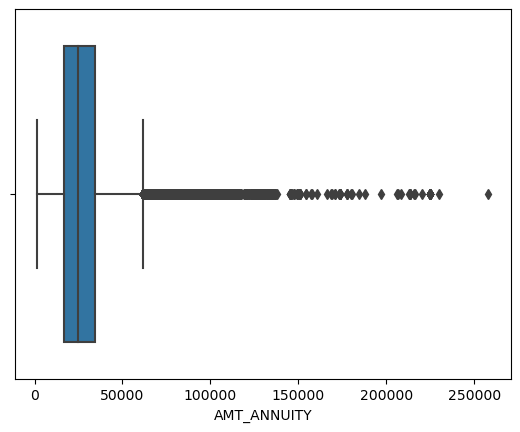

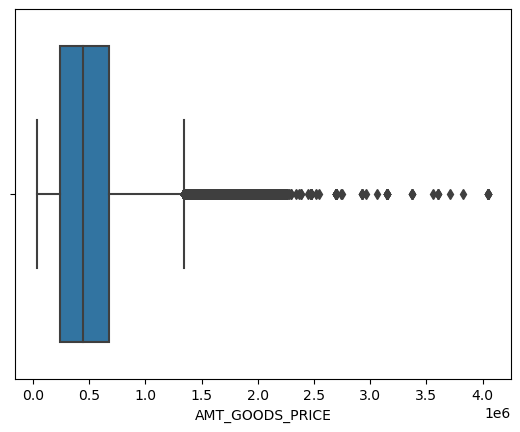

In [34]:
for i in null_cont:
    sns.boxplot(df_new_null[i])
    plt.show()

In [35]:
df_new.AMT_GOODS_PRICE.describe()

count    3.072330e+05
mean     5.383962e+05
std      3.694465e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64

In [36]:
df_new.AMT_ANNUITY.describe()

count    307499.000000
mean      27108.573909
std       14493.737315
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [37]:
# After segmentation, we see for both 'AMT_ANNUITY', 'AMT_GOODS_PRICE' , a lot of outliers present in data, so we will impute with median value for respective columns. 
#For categorical columns having null values, we will impute with mode for respective columns.  


In [38]:
df_new.AMT_ANNUITY[df_new.AMT_ANNUITY.isna()] = df_new.AMT_ANNUITY.median()

In [39]:
df_new.AMT_GOODS_PRICE[df_new.AMT_GOODS_PRICE.isna()] = df_new.AMT_GOODS_PRICE.median()

In [40]:
# for cat. columns having null values, we can replace with mode 
# replacing with mode for cat variables:
for i in null_cat:
    df_new[i][df_new[i].isna()] = df_new[i].mode()[0]

In [41]:
#### chcecking for null values 
df_new.isna().sum()

SK_ID_CURR                    0
TARGET                        0
NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_CAR                  0
FLAG_OWN_REALTY               0
CNT_CHILDREN                  0
AMT_INCOME_TOTAL              0
AMT_CREDIT                    0
AMT_ANNUITY                   0
AMT_GOODS_PRICE               0
NAME_INCOME_TYPE              0
NAME_EDUCATION_TYPE           0
NAME_FAMILY_STATUS            0
NAME_HOUSING_TYPE             0
REGION_POPULATION_RELATIVE    0
DAYS_BIRTH                    0
DAYS_EMPLOYED                 0
DAYS_REGISTRATION             0
DAYS_ID_PUBLISH               0
OCCUPATION_TYPE               0
CNT_FAM_MEMBERS               0
ORGANIZATION_TYPE             0
OBS_30_CNT_SOCIAL_CIRCLE      0
DEF_30_CNT_SOCIAL_CIRCLE      0
OBS_60_CNT_SOCIAL_CIRCLE      0
DEF_60_CNT_SOCIAL_CIRCLE      0
AMT_REQ_CREDIT_BUREAU_HOUR    0
AMT_REQ_CREDIT_BUREAU_DAY     0
AMT_REQ_CREDIT_BUREAU_WEEK    0
AMT_REQ_CREDIT_BUREAU_MON     0
AMT_REQ_

In [42]:
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [43]:
df_new.shape

(307511, 33)

#### investigating each column in the new dataset

In [44]:
for i in df_new.columns:
    print(df_new[i].unique() , df_new[i].nunique())

[100002 100003 100004 ... 456253 456254 456255] 307511
[1 0] 2
['Cash loans' 'Revolving loans'] 2
['M' 'F' 'XNA'] 3
['N' 'Y'] 2
['Y' 'N'] 2
[ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14] 15
[202500.  270000.   67500.  ...  96768.  546250.5 113062.5] 2548
[ 406597.5 1293502.5  135000.  ...  181989.   743863.5 1391130. ] 5603
[24700.5 35698.5  6750.  ... 71986.5 58770.  77809.5] 13672
[ 351000.  1129500.   135000.  ...  453465.   143977.5  743863.5] 1002
['Working' 'State servant' 'Commercial associate' 'Pensioner' 'Unemployed'
 'Student' 'Businessman' 'Maternity leave'] 8
['Secondary / secondary special' 'Higher education' 'Incomplete higher'
 'Lower secondary' 'Academic degree'] 5
['Single / not married' 'Married' 'Civil marriage' 'Widow' 'Separated'
 'Unknown'] 6
['House / apartment' 'Rented apartment' 'With parents'
 'Municipal apartment' 'Office apartment' 'Co-op apartment'] 6
[0.018801 0.003541 0.010032 0.008019 0.028663 0.035792 0.003122 0.018634
 0.019689 0.0228   0.015221 0.0313

In [45]:
for i in df_new.columns:
    if 'XNA' in df_new[i].unique():
        print(i)
    

CODE_GENDER
ORGANIZATION_TYPE


In [46]:
#### there are two columns where 'XNA' values are present, which we missed during null value inspection.
df_new.CODE_GENDER.value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [47]:
#### very less amonuts of 'XNA' values, so we will drop these records.
df_new = df_new.drop(df_new.loc[df_new.CODE_GENDER =='XNA'].index)

In [48]:
df_new.loc[df_new.CODE_GENDER =='XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [49]:
df_new.ORGANIZATION_TYPE.value_counts(normalize = True)

Business Entity Type 3    0.221107
XNA                       0.180074
Self-employed             0.124914
Other                     0.054252
Medicine                  0.036396
Business Entity Type 2    0.034318
Government                0.033833
School                    0.028920
Trade: type 7             0.025466
Kindergarten              0.022370
Construction              0.021856
Business Entity Type 1    0.019456
Transport: type 4         0.017554
Trade: type 3             0.011356
Industry: type 9          0.010953
Industry: type 3          0.010657
Security                  0.010559
Housing                   0.009619
Industry: type 11         0.008793
Military                  0.008566
Bank                      0.008153
Agriculture               0.007980
Police                    0.007613
Transport: type 2         0.007167
Postal                    0.007014
Security Ministries       0.006419
Trade: type 2             0.006179
Restaurant                0.005889
Services            

In [50]:
#### significant amounts of 'XNA' values for ORGANIZATION_TYPE, we cant impute these, so lets drop these as well.
df_new = df_new.drop(df_new.loc[df_new.ORGANIZATION_TYPE =='XNA'].index)

In [51]:
df_new.CODE_GENDER.unique()

array(['M', 'F'], dtype=object)

In [52]:
df_new.loc[df_new.CODE_GENDER =='XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [53]:
df_new.loc[df_new.ORGANIZATION_TYPE =='XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR


In [54]:
df_new.shape

(252133, 33)

In [55]:
for i in df_new.columns:
    print(i , df_new[i].unique())

SK_ID_CURR [100002 100003 100004 ... 456253 456254 456255]
TARGET [1 0]
NAME_CONTRACT_TYPE ['Cash loans' 'Revolving loans']
CODE_GENDER ['M' 'F']
FLAG_OWN_CAR ['N' 'Y']
FLAG_OWN_REALTY ['Y' 'N']
CNT_CHILDREN [ 0  1  2  3  4  7  5  6  8  9 11 12 10 19 14]
AMT_INCOME_TOTAL [202500.  270000.   67500.  ... 546250.5 113062.5 440100. ]
AMT_CREDIT [ 406597.5 1293502.5  135000.  ...  589180.5  543249.   743863.5]
AMT_ANNUITY [24700.5 35698.5  6750.  ... 22207.5 71986.5 58770. ]
AMT_GOODS_PRICE [ 351000.  1129500.   135000.   297000.   513000.   454500.  1395000.
 1530000.   405000.   652500.    67500.   697500.   679500.   247500.
  387000.   270000.   157500.   427500.   927000.   450000.   225000.
  702000.   675000.   180000.   477000.   360000.  1125000.   553500.
  540000.   855000.   238500.   598500.  1350000.   666000.   517500.
 1588500.  1080000.    90000.   315000.   900000.  1035000.   463500.
  459000.   256500.   585000.   643500.   283500.   472500.   337500.
  720000.  1089000.

DAYS_REGISTRATION [ -3648.  -1186.  -4260. ... -12316. -14083. -12372.]
DAYS_ID_PUBLISH [-2120  -291 -2531 ... -5965 -5854 -6211]
OCCUPATION_TYPE ['Laborers' 'Core staff' 'Accountants' 'Managers' 'Drivers' 'Sales staff'
 'Cleaning staff' 'Cooking staff' 'Others' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
CNT_FAM_MEMBERS [ 1.  2.  3.  4.  5.  6.  9.  7.  8. 10. 13. 14. 12. 20. 15. 16. 11.]
ORGANIZATION_TYPE ['Business Entity Type 3' 'School' 'Government' 'Religion' 'Other'
 'Electricity' 'Medicine' 'Business Entity Type 2' 'Self-employed'
 'Transport: type 2' 'Construction' 'Housing' 'Kindergarten'
 'Trade: type 7' 'Industry: type 11' 'Military' 'Services'
 'Security Ministries' 'Transport: type 4' 'Industry: type 1' 'Emergency'
 'Security' 'Trade: type 2' 'University' 'Transport: type 3' 'Police'
 'Business Entity Type 1' 'Postal' 'Industry: type 4'

In [56]:
#### as can be seen, some of the columns have negative values in them. 'DAYS_BIRTH' , 'DAYS_EMPLOYED' , 'DAYS_REGISTRATION' , 'DAYS_ID_PUBLISH'

#### negative values in none of them are making sense, so converting negative values in positive.
df_new['DAYS_BIRTH'] = df_new['DAYS_BIRTH'].abs()
df_new['DAYS_EMPLOYED'] = df_new['DAYS_EMPLOYED'].abs()
df_new['DAYS_REGISTRATION'] = df_new['DAYS_REGISTRATION'].abs()
df_new['DAYS_ID_PUBLISH'] = df_new['DAYS_ID_PUBLISH'].abs()

In [57]:
for i in ['DAYS_BIRTH', 'DAYS_EMPLOYED' , 'DAYS_REGISTRATION' , 'DAYS_ID_PUBLISH']:
    print(i , df_new[i].unique())

DAYS_BIRTH [ 9461 16765 19046 ... 23693 24968 24319]
DAYS_EMPLOYED [  637  1188   225 ... 12971 11084  8694]
DAYS_REGISTRATION [ 3648.  1186.  4260. ... 12316. 14083. 12372.]
DAYS_ID_PUBLISH [2120  291 2531 ... 5965 5854 6211]


In [58]:
# we see an unusual entry 'Maternity leave' in 'NAME_INCOME_TYPE' which needs to be removed. 

In [59]:
df_new.NAME_INCOME_TYPE.value_counts(normalize = True)

Working                 0.629711
Commercial associate    0.284041
State servant           0.086078
Student                 0.000071
Pensioner               0.000040
Businessman             0.000040
Maternity leave         0.000020
Name: NAME_INCOME_TYPE, dtype: float64

In [60]:
df_new = df_new.drop(df_new.loc[df_new.NAME_INCOME_TYPE =='Maternity leave'].index)

## SEGMENTING THE COLUMNS 

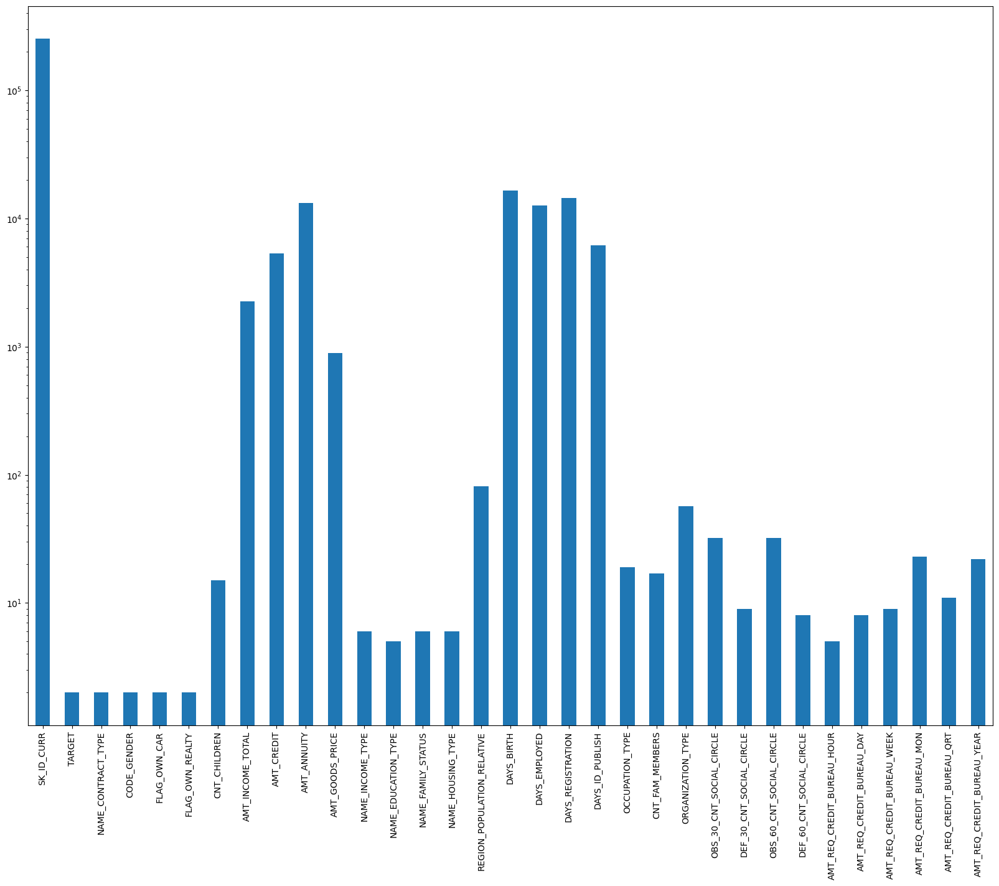

In [61]:
plt.figure(figsize = (20, 15))
df_new.nunique().plot.bar()
plt.yscale('log')

In [62]:
for i in df_new.columns:
    print(i , df_new[i].nunique())

SK_ID_CURR 252128
TARGET 2
NAME_CONTRACT_TYPE 2
CODE_GENDER 2
FLAG_OWN_CAR 2
FLAG_OWN_REALTY 2
CNT_CHILDREN 15
AMT_INCOME_TOTAL 2266
AMT_CREDIT 5331
AMT_ANNUITY 13189
AMT_GOODS_PRICE 894
NAME_INCOME_TYPE 6
NAME_EDUCATION_TYPE 5
NAME_FAMILY_STATUS 6
NAME_HOUSING_TYPE 6
REGION_POPULATION_RELATIVE 81
DAYS_BIRTH 16513
DAYS_EMPLOYED 12573
DAYS_REGISTRATION 14419
DAYS_ID_PUBLISH 6140
OCCUPATION_TYPE 19
CNT_FAM_MEMBERS 17
ORGANIZATION_TYPE 57
OBS_30_CNT_SOCIAL_CIRCLE 32
DEF_30_CNT_SOCIAL_CIRCLE 9
OBS_60_CNT_SOCIAL_CIRCLE 32
DEF_60_CNT_SOCIAL_CIRCLE 8
AMT_REQ_CREDIT_BUREAU_HOUR 5
AMT_REQ_CREDIT_BUREAU_DAY 8
AMT_REQ_CREDIT_BUREAU_WEEK 9
AMT_REQ_CREDIT_BUREAU_MON 23
AMT_REQ_CREDIT_BUREAU_QRT 11
AMT_REQ_CREDIT_BUREAU_YEAR 22


In [63]:
### segmnetatio of the columns
cont_cols = []
cat_cols = []
other_cols = ['SK_ID_CURR']

In [64]:
for i in df_new.columns[1:]:
    if len(df_new[i].value_counts()) > 100:
        cont_cols.append(i)
    else:
        cat_cols.append(i)

In [65]:
cont_cols

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH']

In [66]:
cat_cols

['TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'ORGANIZATION_TYPE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

## univariate analysis

In [67]:
# for continuous columns we will use distplot and boxplot to see the data distribution and spread.

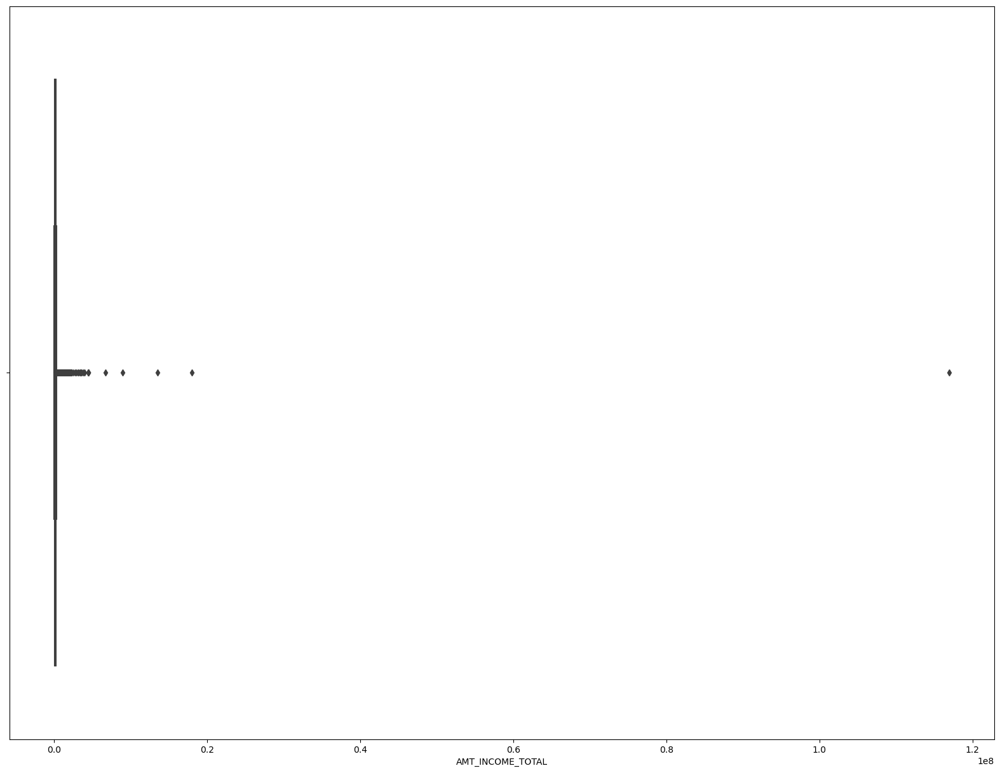

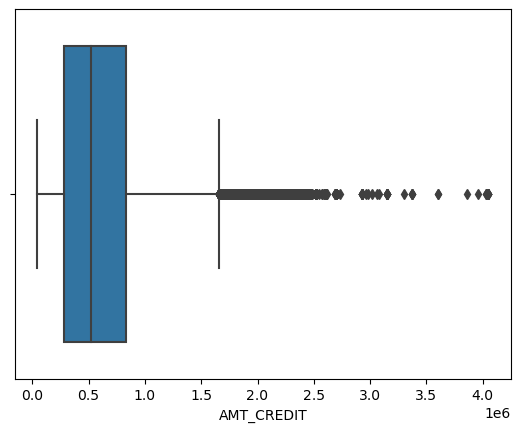

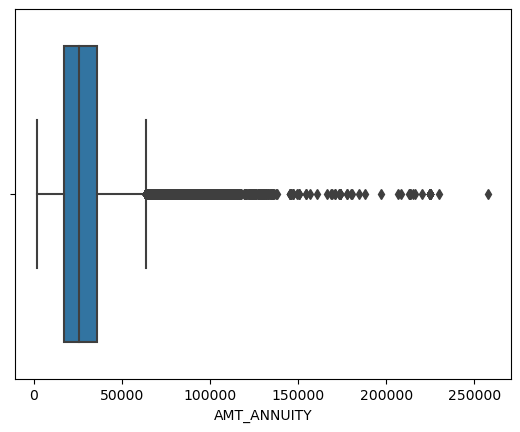

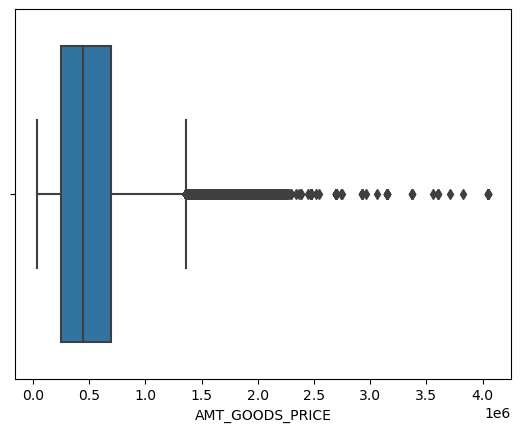

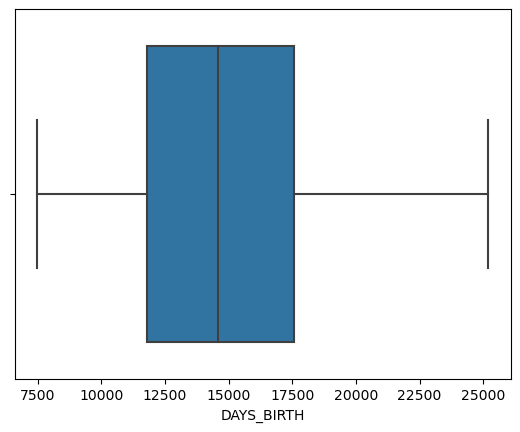

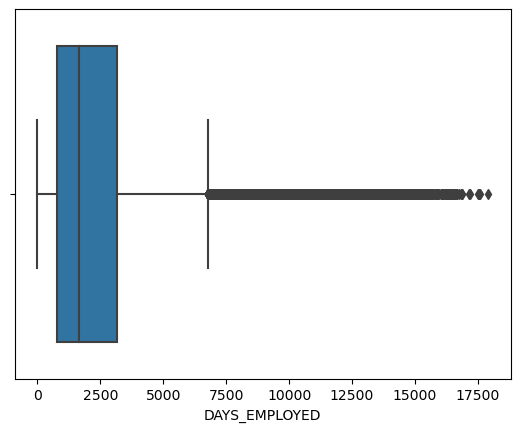

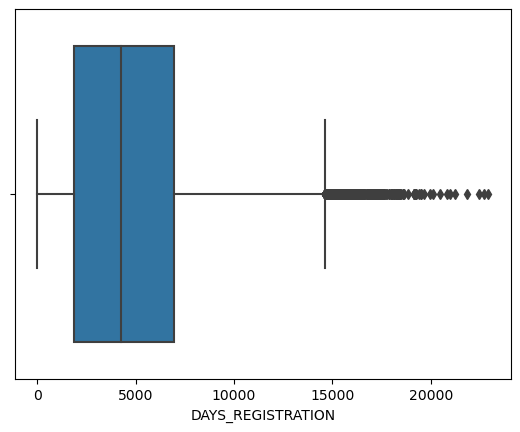

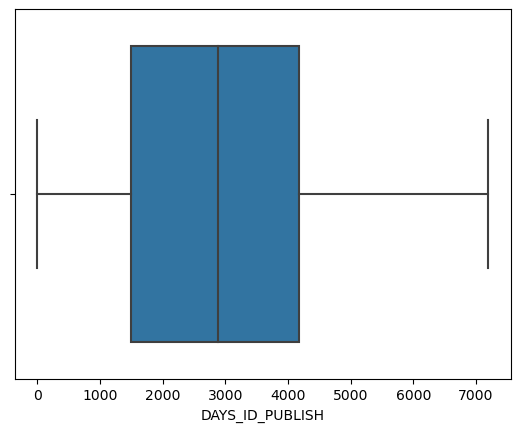

In [68]:
## for continuous columns 
plt.figure(figsize = (20, 15))
for i in cont_cols:
    sns.boxplot(df_new[i])
    plt.show()

In [69]:
df_new[cont_cols].describe()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
count,2.521280e+05,2.521280e+05,252128.000000,2.521280e+05,252128.00000,252128.000000,252128.000000,252128.000000
mean,1.759146e+05,6.113991e+05,27812.129204,5.493028e+05,14769.15128,2384.137244,4635.437238,2800.634463
std,2.588556e+05,4.065292e+05,14647.217334,3.730919e+05,3662.55286,2338.345852,3252.150109,1515.363106
min,2.565000e+04,4.500000e+04,1980.000000,4.050000e+04,7489.00000,0.000000,0.000000,0.000000
25%,1.125000e+05,2.779695e+05,17073.000000,2.475000e+05,11775.00000,767.000000,1845.000000,1487.000000
50%,1.575000e+05,5.212800e+05,25834.500000,4.500000e+05,14573.00000,1648.000000,4265.000000,2886.000000
75%,2.115000e+05,8.292780e+05,35617.500000,6.930000e+05,17563.00000,3175.000000,6952.000000,4177.000000
max,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,25200.00000,17912.000000,22928.000000,7197.000000


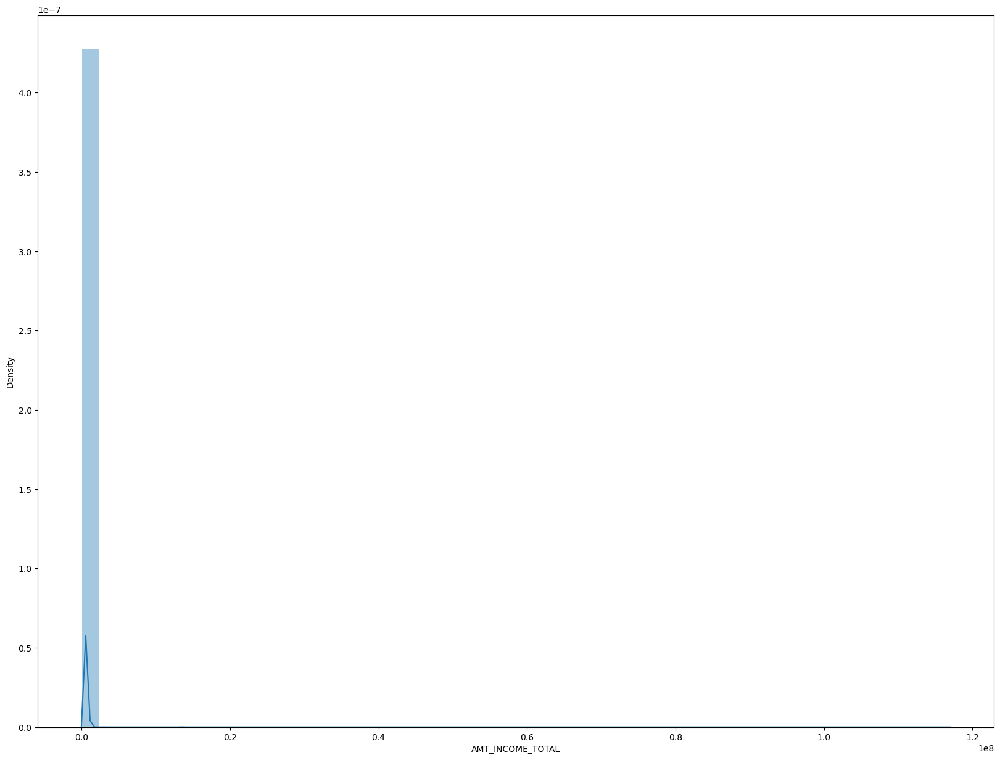

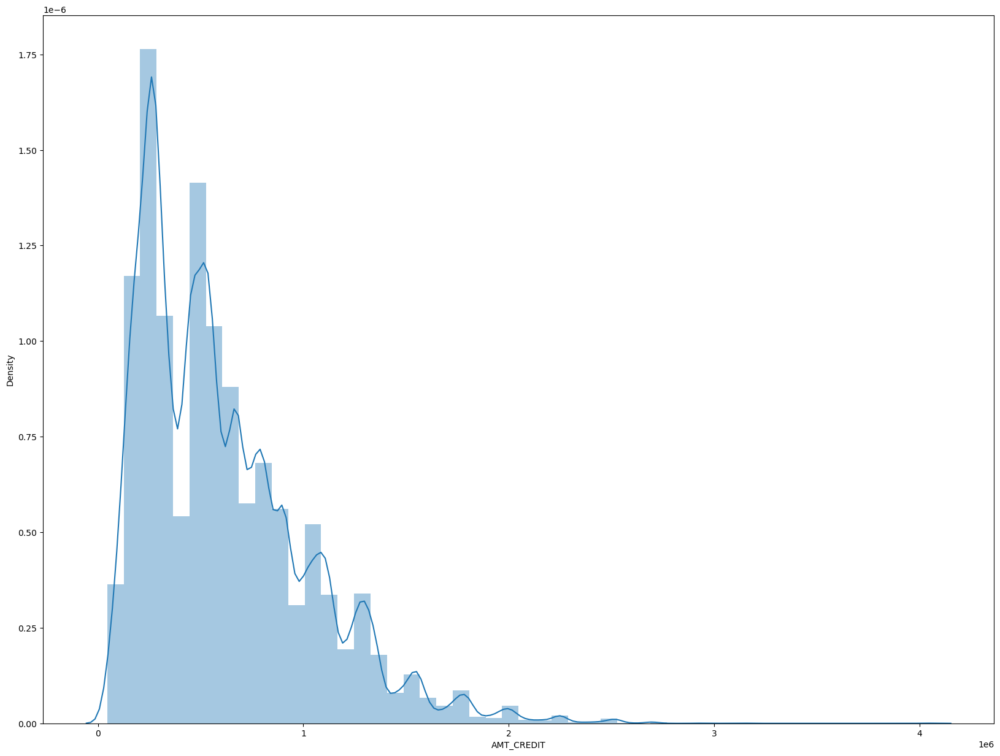

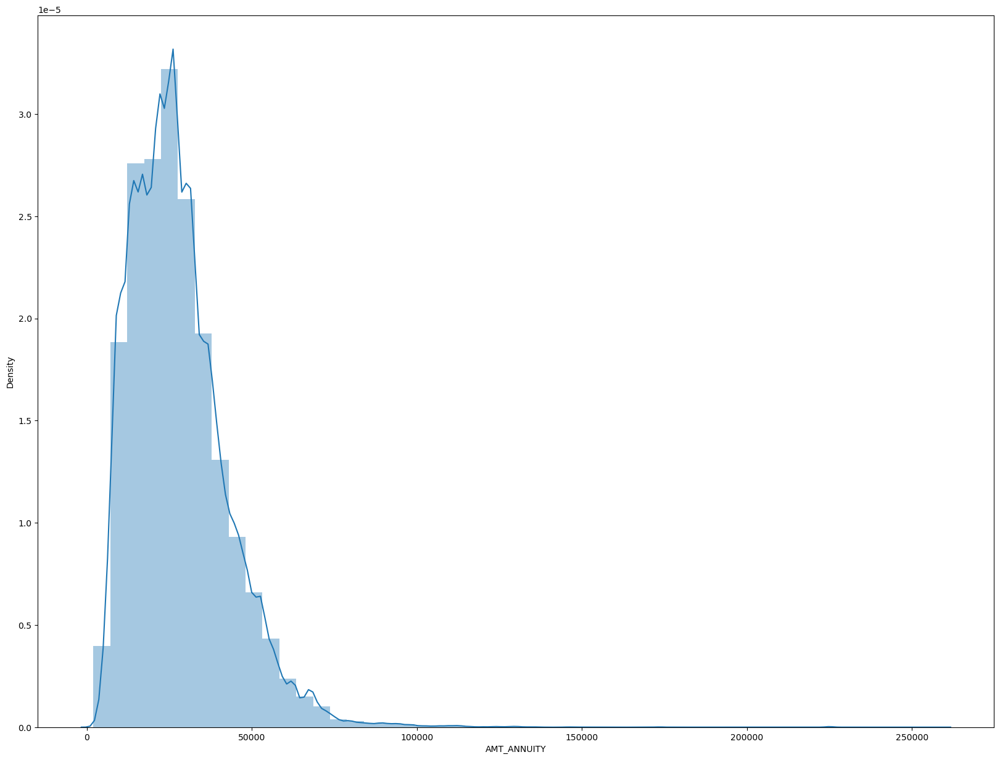

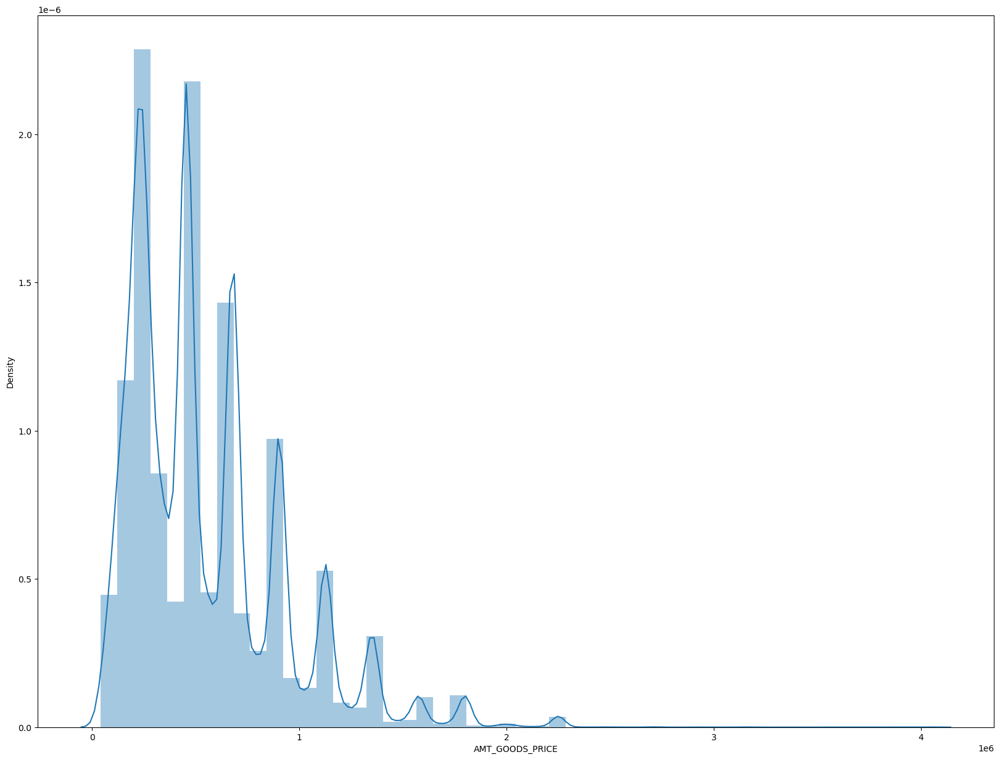

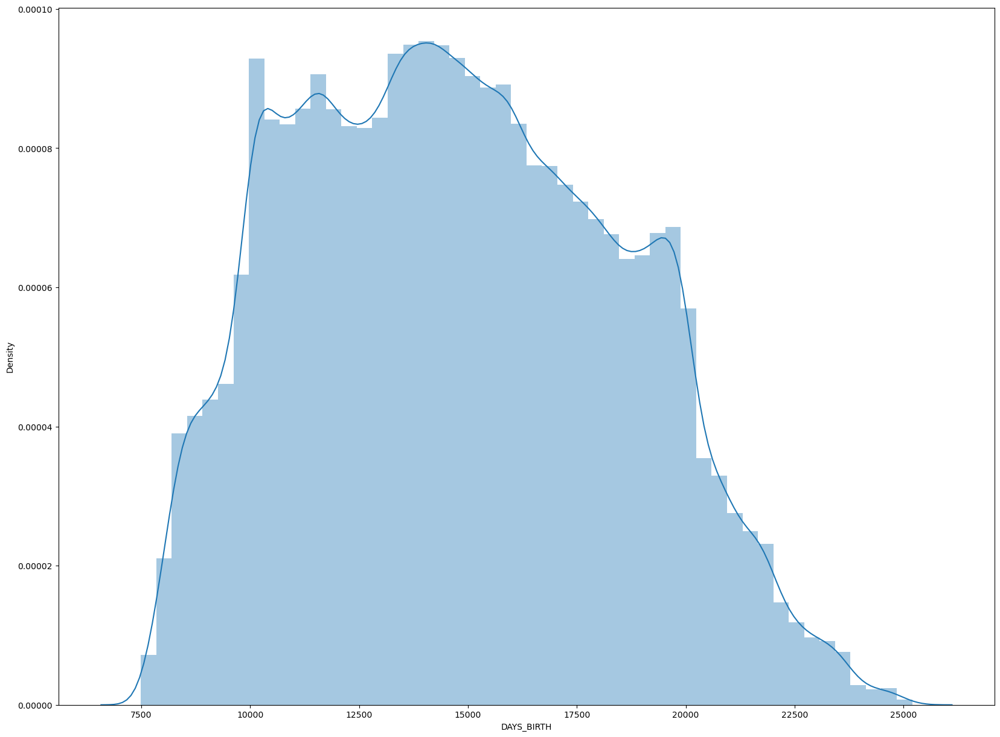

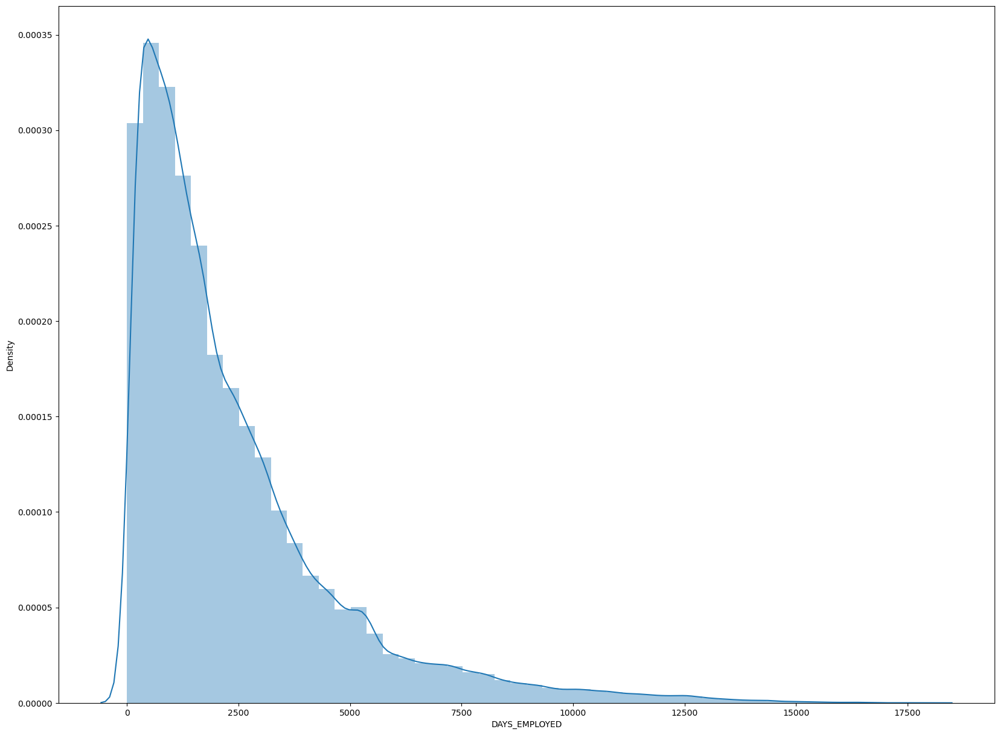

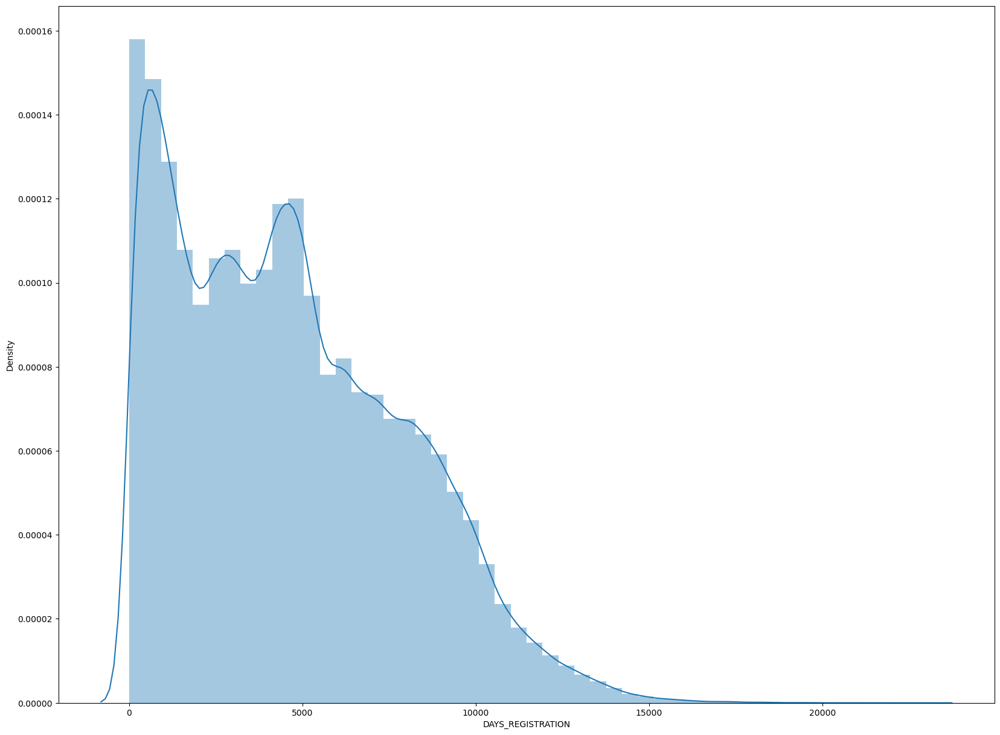

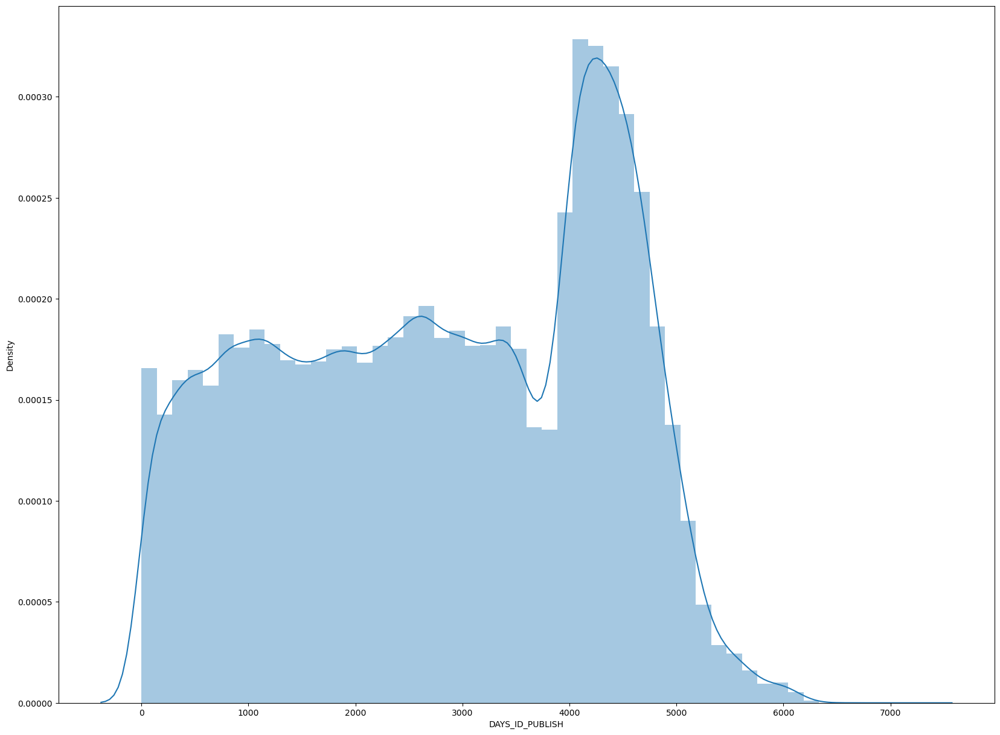

In [70]:
for i in cont_cols:
    plt.figure(figsize = (20, 15))
    sns.distplot(df_new[i])
    plt.show()

In [71]:
# as can be seen, 'AMT_INCOME_TOTAL' , 'AMT_CREDIT' , 'AMT_ANNUITY' , 'DAYS_EMPLOYED' are having a lot of outliers as expected.
# these plots are positively scewed.
# We will ignore the outliers for now as these are pretty normal.
# We will create bins for 'AMT_INCOME_TOTAL' , 'AMT_CREDIT' , 'DAYS_EMPLOYED' and 'DAYS_BIRTH' to find insights.


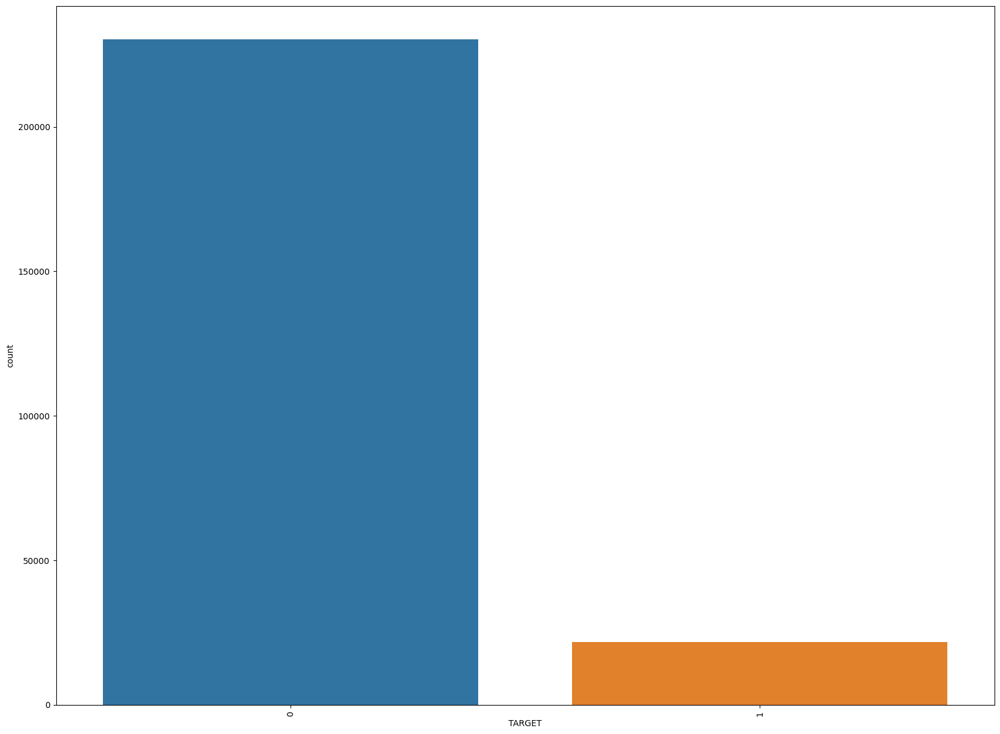

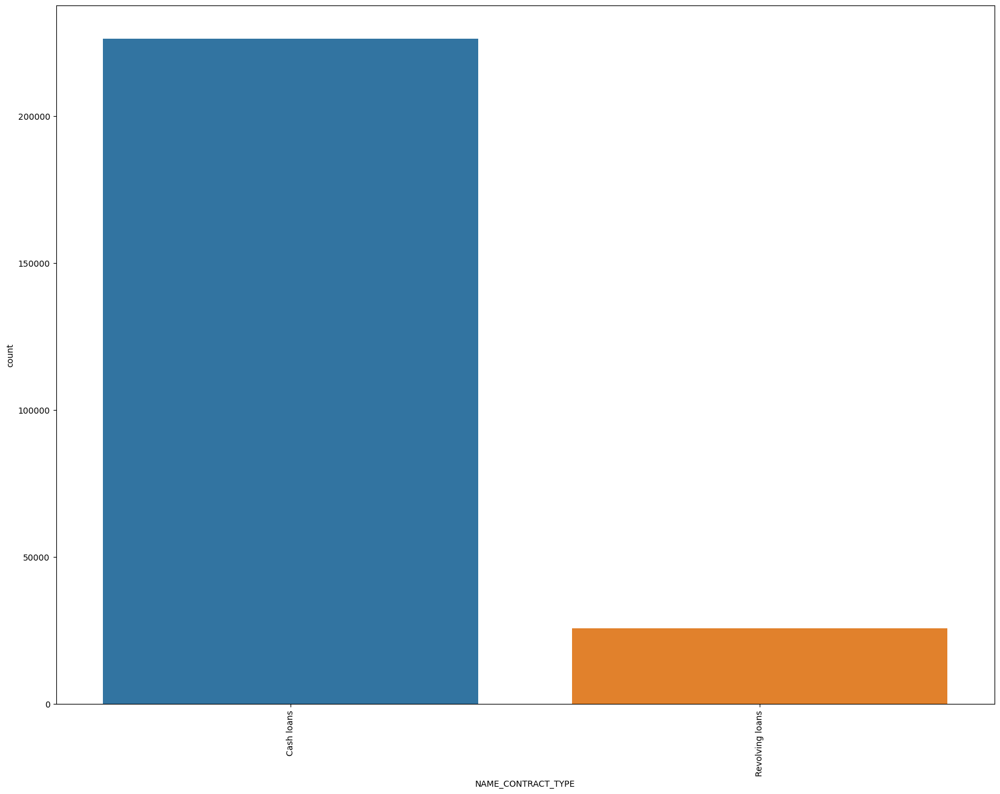

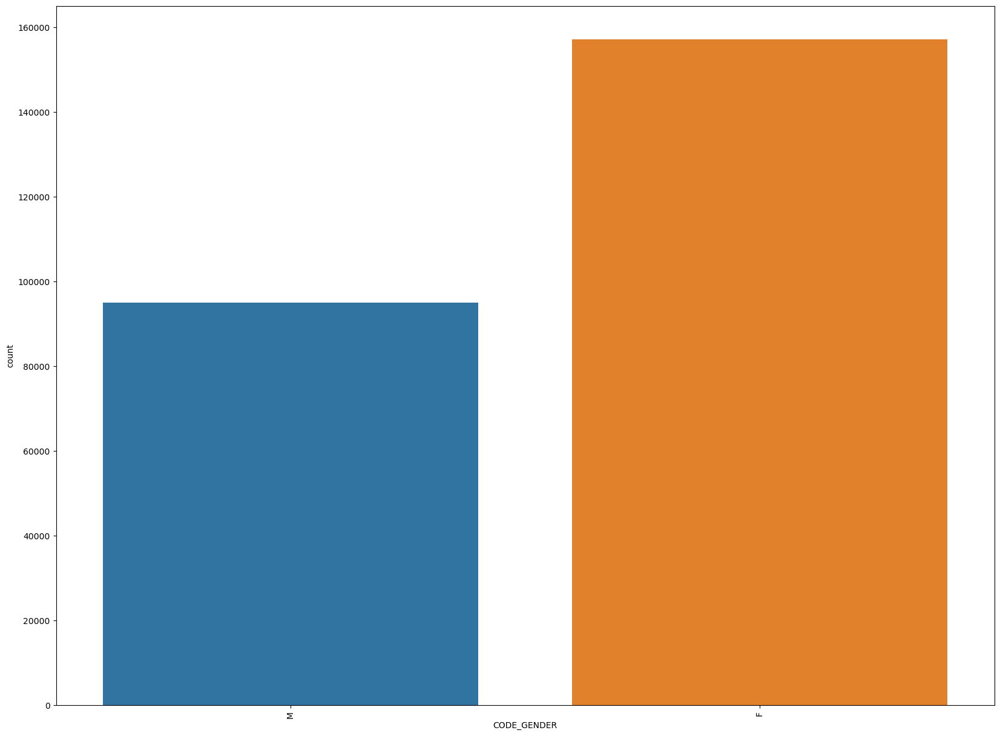

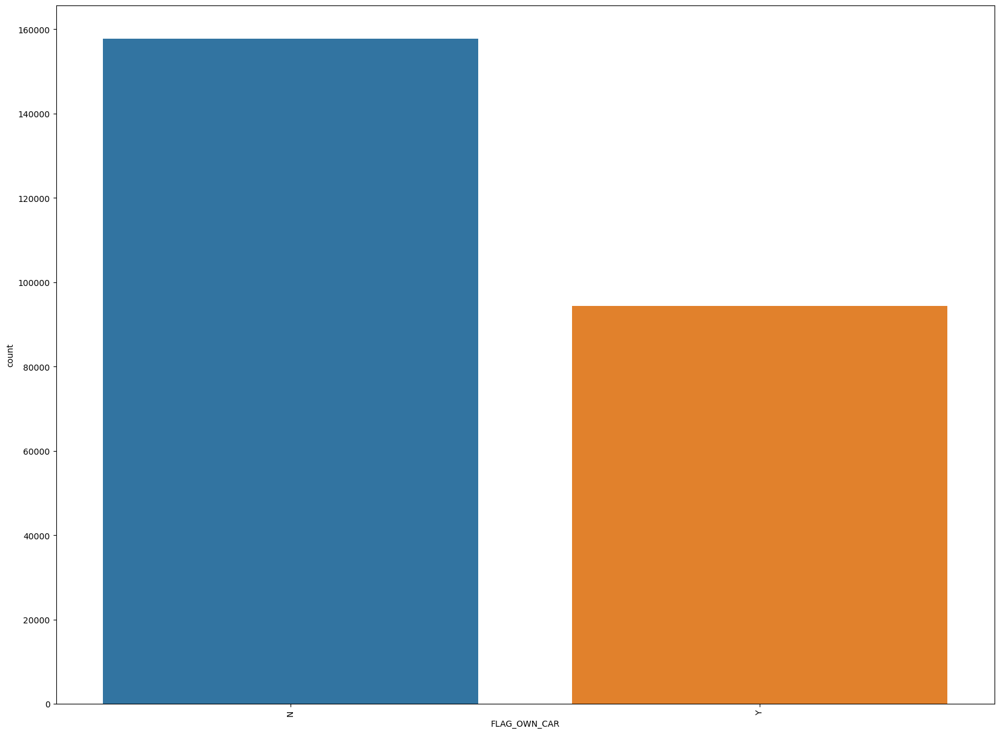

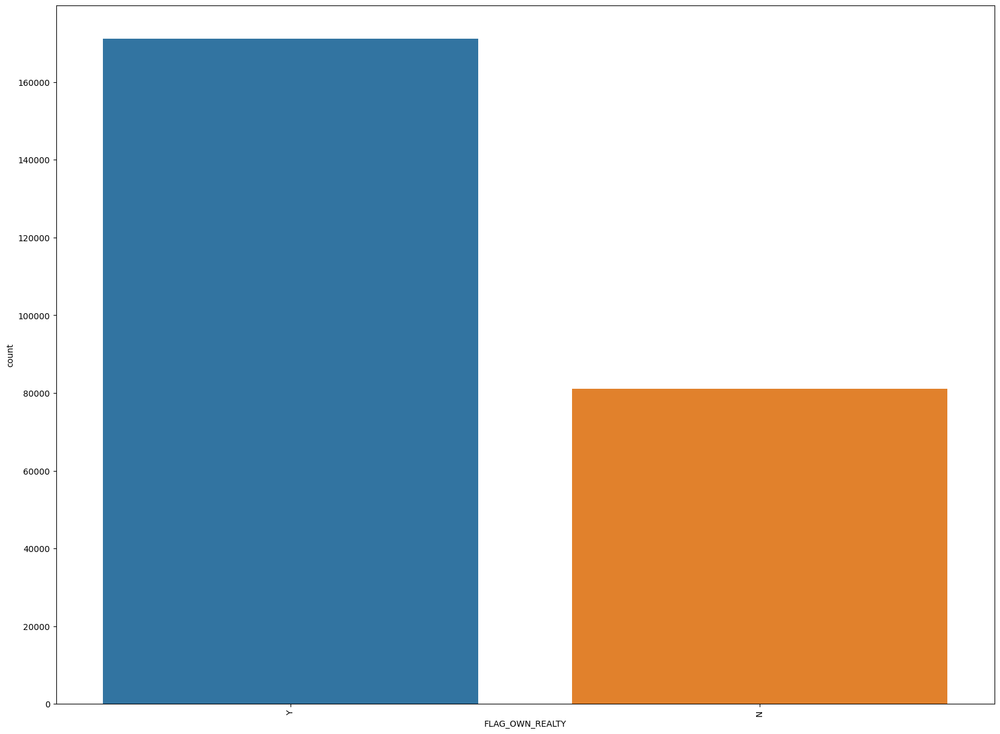

...

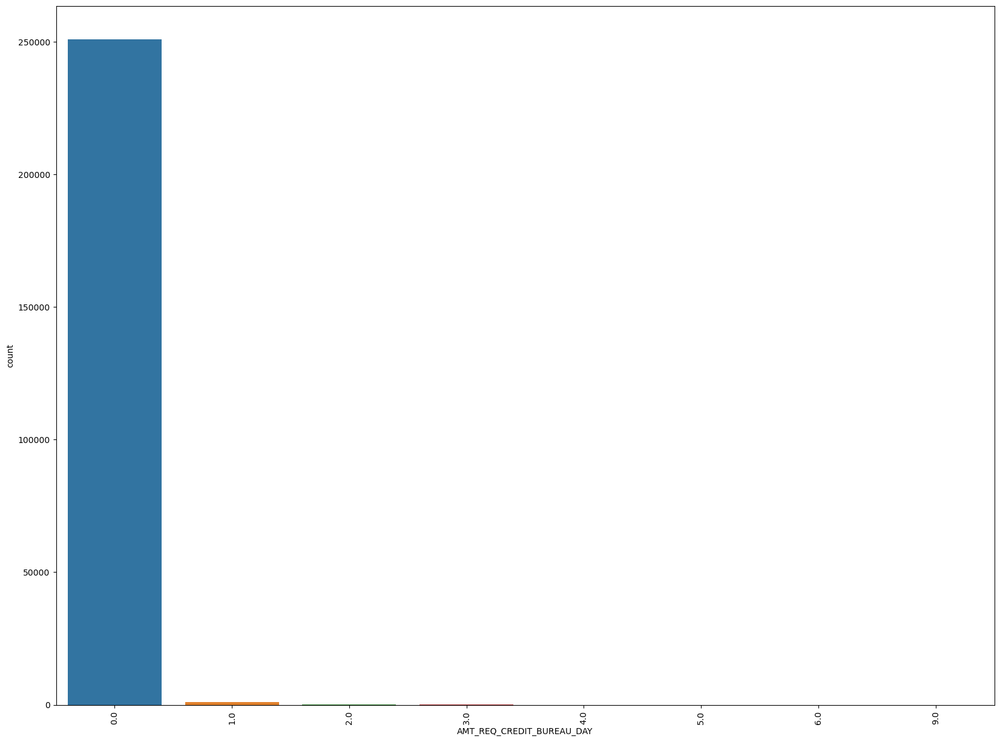

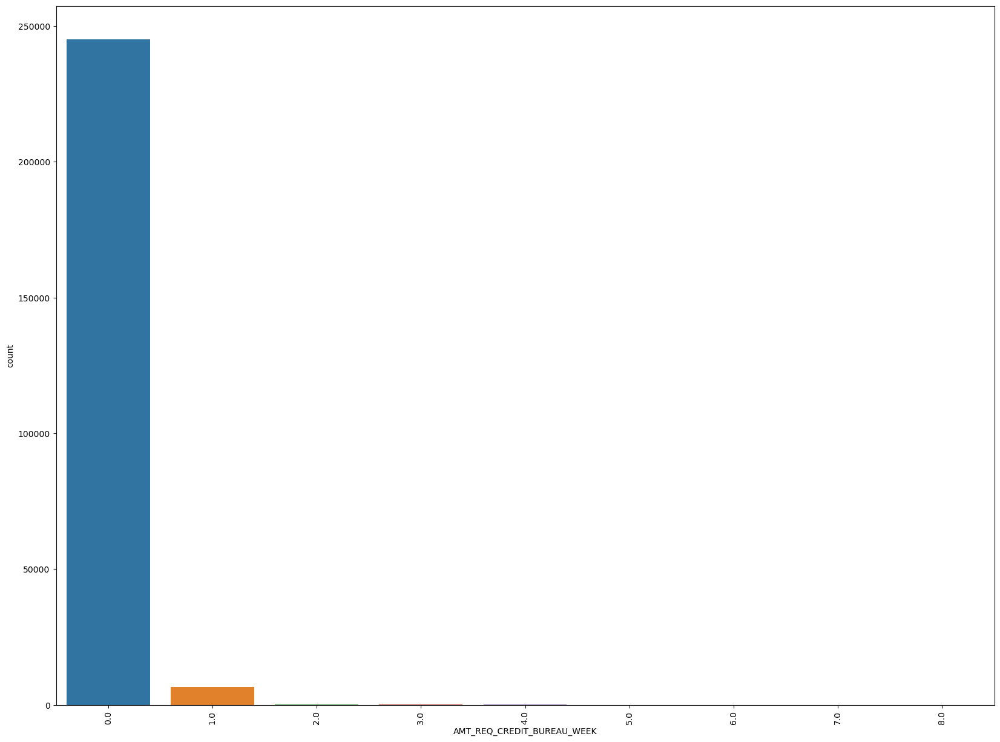

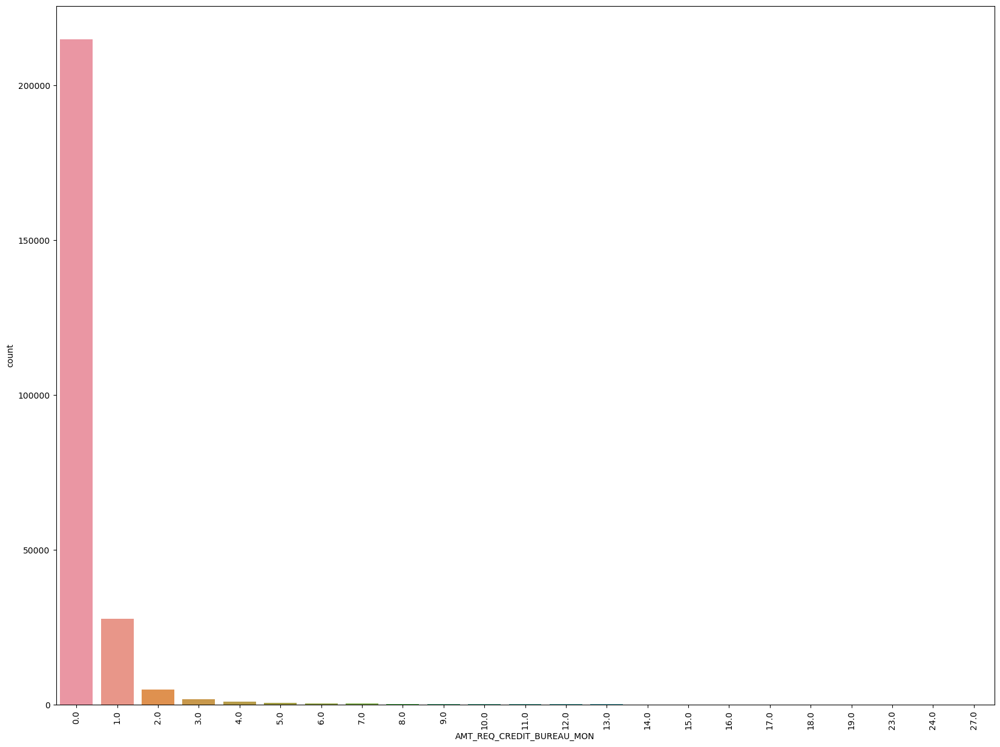

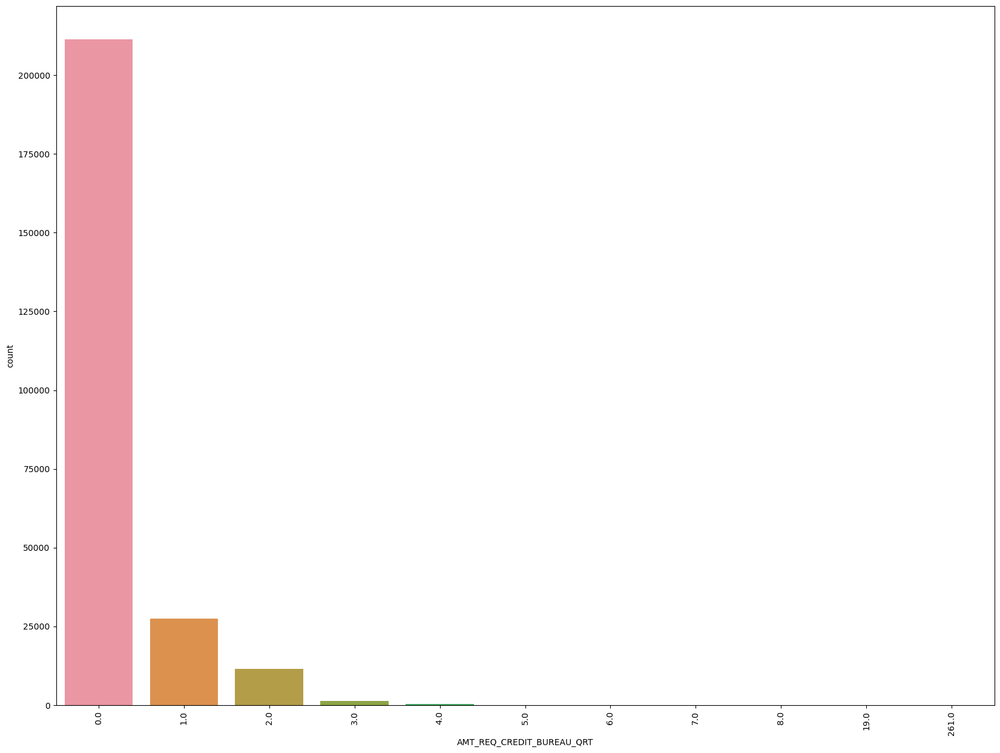

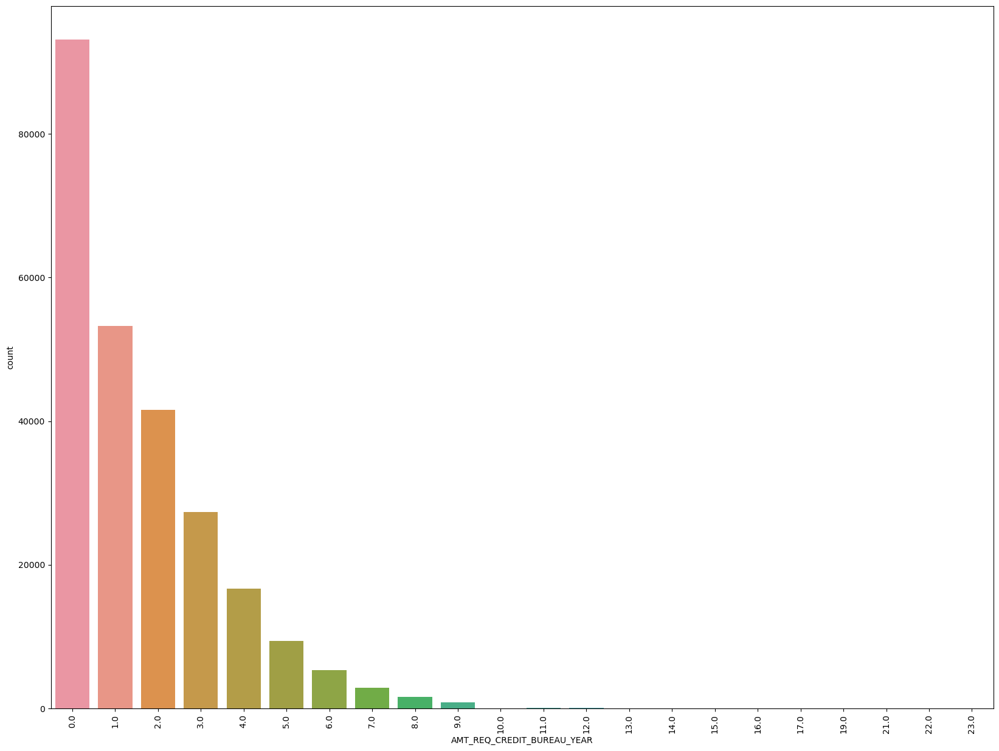

In [72]:
for i in cat_cols:
    plt.figure(figsize = (20, 15))
    sns.countplot(df_new[i])
    plt.xticks(rotation = 90)
    plt.show()

## creating bins 

#### for 'AMT_INCOME_TOTAL'

In [73]:

df_new.AMT_INCOME_TOTAL.quantile(0.95) ,df_new.AMT_INCOME_TOTAL.quantile(0.97) , df_new.AMT_INCOME_TOTAL.quantile(0.99)

(355207.94999999856, 391500.0, 517500.0)

In [74]:
df_new.AMT_INCOME_TOTAL.quantile(0.1)

90000.0

In [75]:
bins = [0,100000,200000,300000,400000,500000,100000000000000]
labels = ['<100000', '100000-200000','200000-300000','300000-400000','400000-500000', '500000 and above']
df_new['AMT_INCOME_RANGE'] = pd.cut(df_new['AMT_INCOME_TOTAL'], bins , labels)

#### for 'AMT_CREDIT'

In [76]:
df_new.AMT_CREDIT.quantile(0.5) ,df_new.AMT_CREDIT.quantile(0.97) , df_new.AMT_CREDIT.quantile(0.99)

(521280.0, 1546020.0, 1886850.0)

In [77]:
bins = [0,100000,200000,300000,400000,500000,600000,700000,800000,900000,10000000000]
labels = ['<100000', '100000-200000','200000-300000','300000-400000','400000-500000', '500000-600000',
        '600000-700000','700000-800000','850000-900000','900000 and above']

df_new['AMT_CREDIT_RANGE']=pd.cut(df_new['AMT_CREDIT'],bins,labels)

#### for 'DAYS_EMPLOYED'

In [78]:
df_new.DAYS_EMPLOYED.quantile(0.3) ,df_new.DAYS_EMPLOYED.quantile(0.97) , df_new.DAYS_EMPLOYED.quantile(0.99)

(919.0, 8615.0, 11338.460000000021)

In [79]:
bins = [0,500,1000,1500,2000,2500,3000,3500,4000,4500,5000,20000]
labels = ['<500', '500-1000','1000-1500','1500-2000','2000-2500', '2500-3000',
        '3000-3500','3500-4000','4000-4500','4500-5000','5000 and above']

df_new['DAYS_EMPLOYED_RANGE']=pd.cut(df_new['DAYS_EMPLOYED'],bins,labels)

In [80]:
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,DAYS_EMPLOYED_RANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,2.0,0.0,0.0,0.0,0.0,0.0,1.0,"(200000, 300000]","(400000, 500000]","(500, 1000]"
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(200000, 300000]","(900000, 10000000000]","(1000, 1500]"
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(0, 100000]","(100000, 200000]","(0, 500]"
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(100000, 200000]","(300000, 400000]","(3000, 3500]"
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"(100000, 200000]","(500000, 600000]","(3000, 3500]"


#### AMT_ANNUITY

In [81]:
bins = [0,10000,15000,20000,25000,30000,35000,40000,45000,50000,500000000]
labels = ['<10000', '10000-15000','15000-20000','20000-25000','25000-30000', '30000-35000',
        '35000-40000','40000-45000','45000-50000','50000 and above']

df_new['AMT_ANNUITY_RANGE']=pd.cut(df_new['AMT_ANNUITY'],bins,labels)

In [82]:
binned_cols = ['AMT_INCOME_RANGE' , 'AMT_CREDIT_RANGE' , 'DAYS_EMPLOYED_RANGE', 'AMT_ANNUITY_RANGE' , 'DAYS_BIRTH_RANGE']

#### DAYS_BIRTH

In [83]:
bins = [0,7000,9000,11000,13000,15000,17000,19000,21000,23000,25000,250000000]
labels = ['<7000', '7000-9000','9000-11000','11000-13000','13000-15000', '15000-17000',
        '17000-19000','19000-21000','21000-23000','23000-25000','25000 and above']

df_new['DAYS_BIRTH_RANGE']=pd.cut(df_new['DAYS_BIRTH'],bins,labels)

In [84]:
# calculating imbalance 
# Imbalanced data refers to those types of datasets where the target class has an uneven distribution of observations, 
# one class label has a very high number of observations and the other has a very low number of observations.


In [85]:
# Dividing the dataset into two dataset of  target=1(client with payment difficulties) and target=0(all other)

In [86]:
target0_df=df_new.loc[df_new["TARGET"]==0]
target1_df=df_new.loc[df_new["TARGET"]==1]

In [87]:
df_new.TARGET.value_counts(normalize = True)

0    0.913405
1    0.086595
Name: TARGET, dtype: float64

In [88]:
df_new.TARGET.value_counts()

0    230295
1     21833
Name: TARGET, dtype: int64

In [89]:
imbalace_ratio = round(len(target1_df) / len(target0_df),2) *100
imbalace_ratio

9.0

In [90]:
#lets take a sample to undertstand imbalance better

In [91]:
df_new_sample = df_new.sample(n = 100000)

In [92]:
imbalace_ratio_sample = round(len(df_new_sample[df_new_sample.TARGET == 1]) / len(df_new_sample[df_new_sample.TARGET == 0]),2) *100
imbalace_ratio_sample

9.0

In [93]:
# imbalane is still very high after taking out a sample

In [94]:
# we will use target 0 and target 1 datasets individually to gain a better understanding, also to normalize the data we will consider % values to arrive at conclusions.

## Univariate analysis Continuious variables with target column 

In [95]:
cont_cols

['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH']

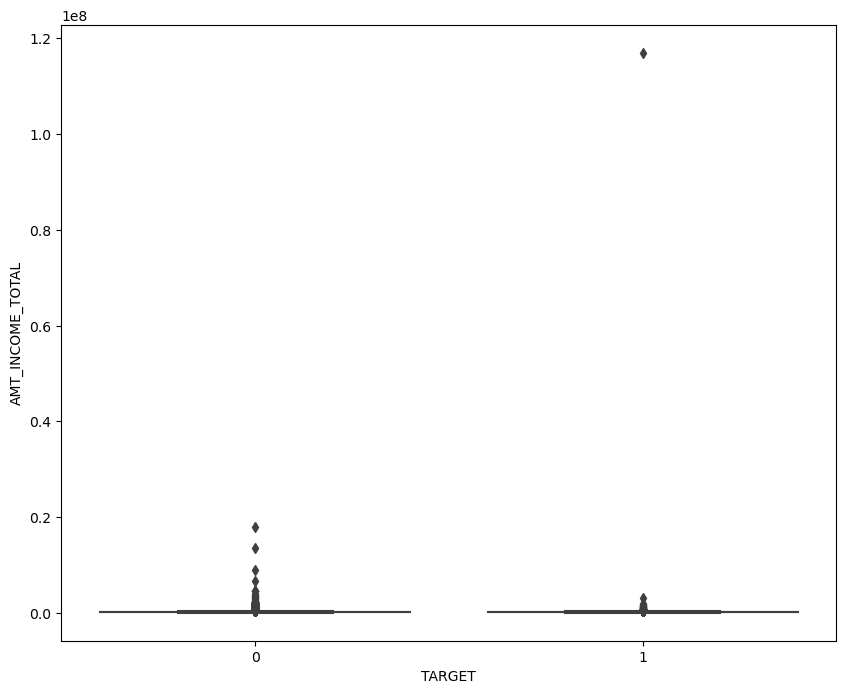

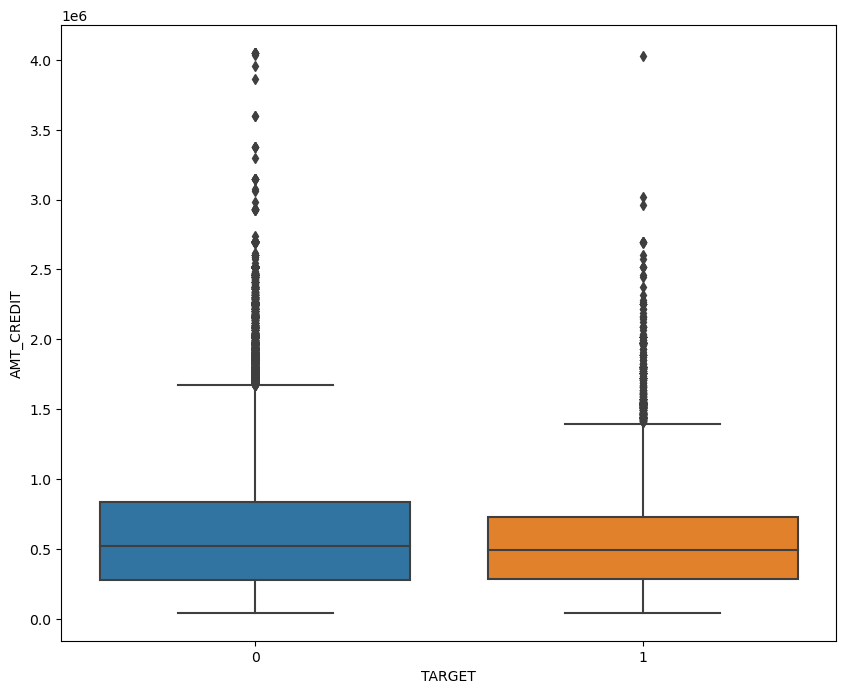

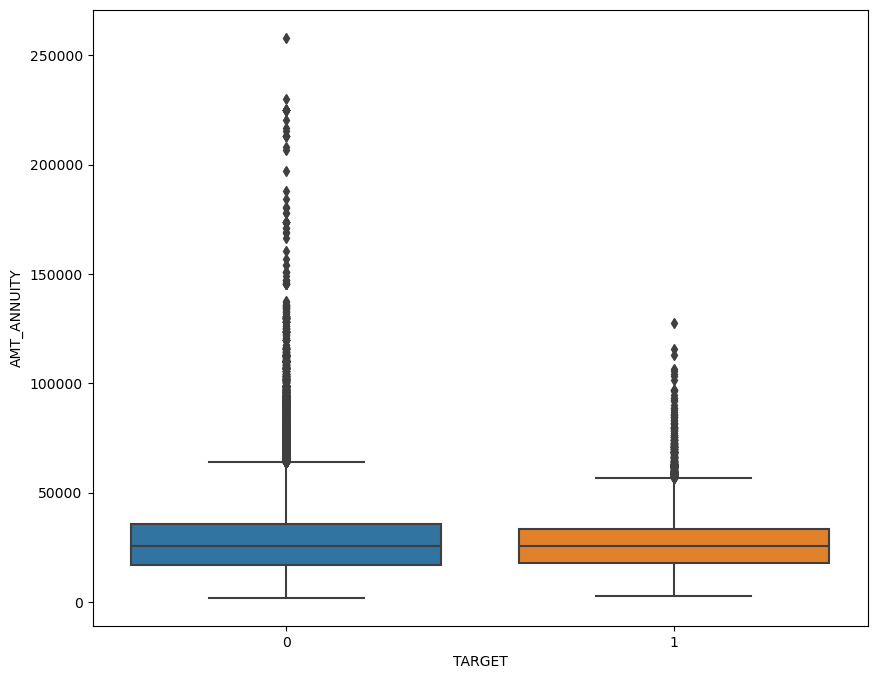

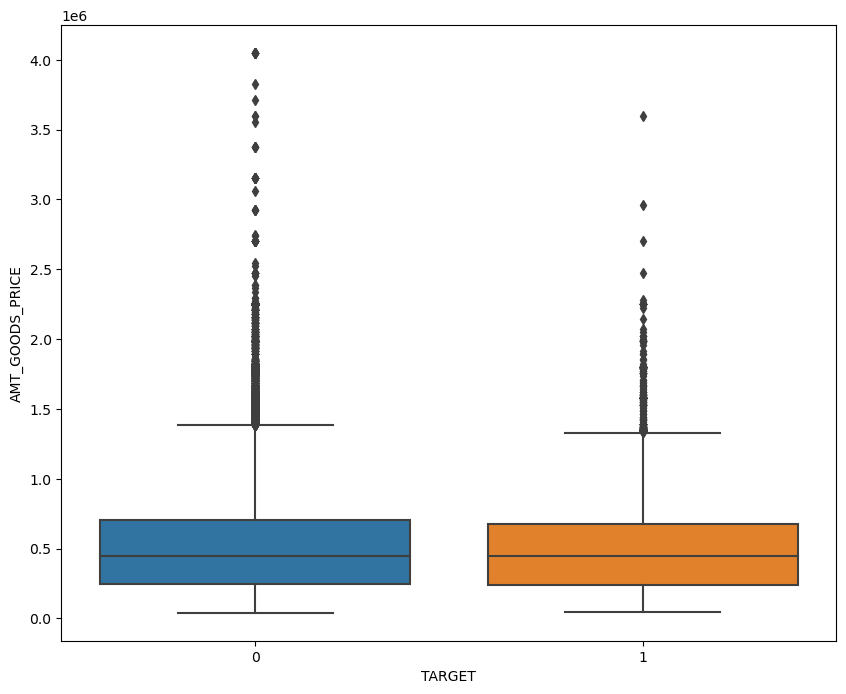

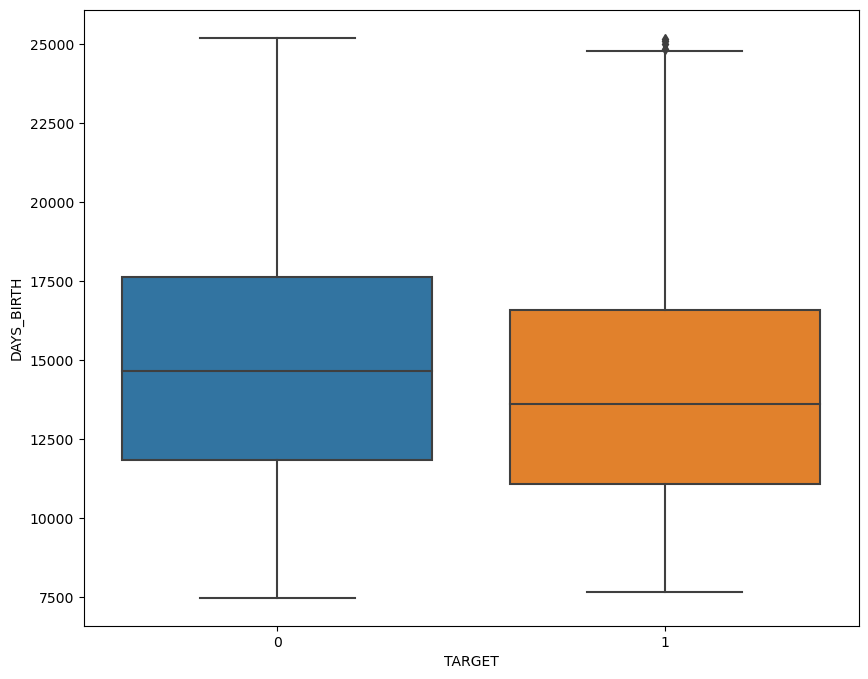

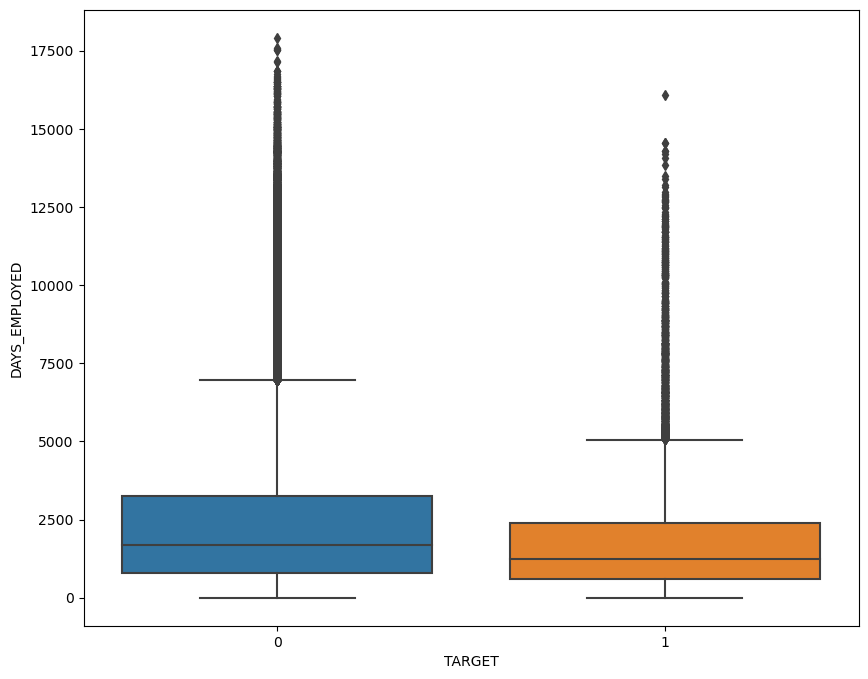

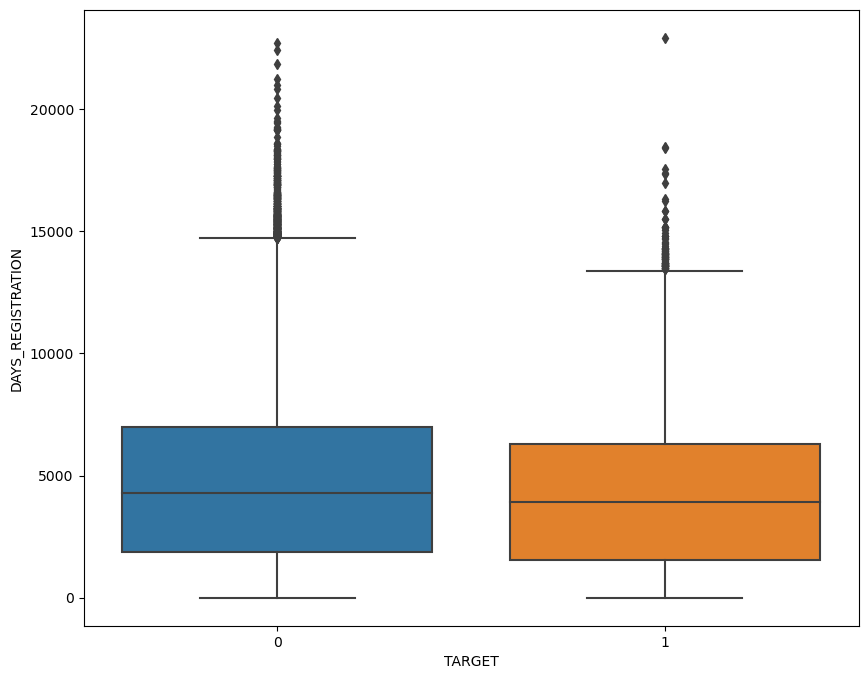

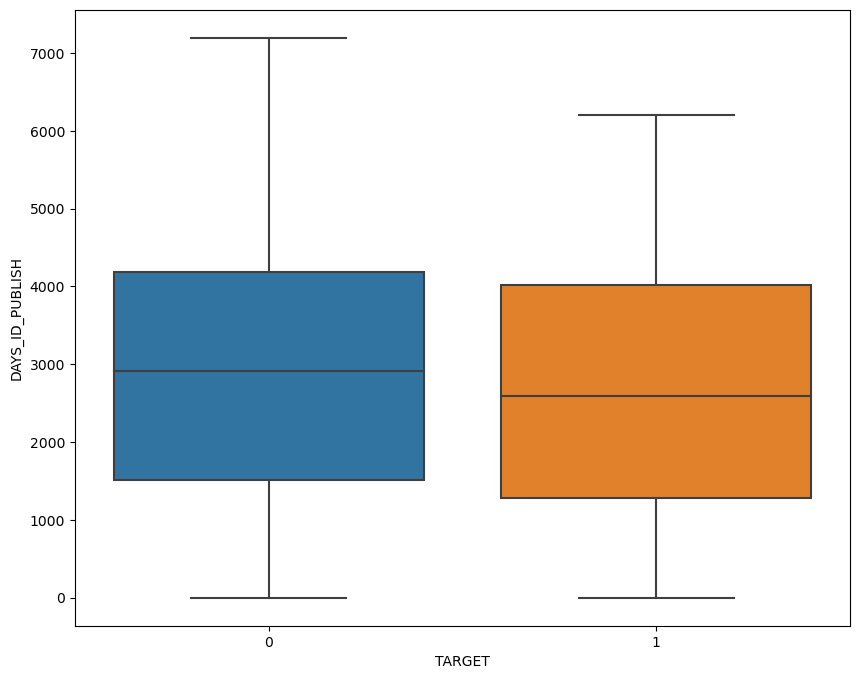

In [96]:
for i in cont_cols:
    plt.figure(figsize = (10, 8))
    sns.boxplot(x = df_new.TARGET , y = df_new[i])
    plt.show()

In [97]:
# observations : 
# 1. People with more days with employment in the current job are more likely to repay which is expected due to stability factor.
# 2. Also generally older people are more likely to repay.
# 3. There are a lot of outliers (except in 'DAYS_BIRTH' and 'DAYS_ID_PUBLISH') in the columns, which are expected in this kind of dataset.
# less obvious observations : 
# 1. People having higher annuity and higher credit amount are more likely to repay.
# 2. People who changed their identity document or registration recenly are less likely to repay. 

In [98]:
# checking the binned columns wrt TARGET var.

In [202]:
#It has been observed from the univariate analysis of the columns, certain categories has very high frequency than the rest in each column. For ex, Laborers in OCCUPATION_TYPE attribute, which means data will tend to lean towards this category. 

#So we will use, default percentage which has been calculated as below:

#default percentage = (no of entries of specific category in specific column having repayment difficulties) /( no of entries of specific category in specific column having repayment difficulties + no of entries of specific category in specific column having no repayment difficulties) 

#This is nothing but to normalize the data and to offset the skewness.



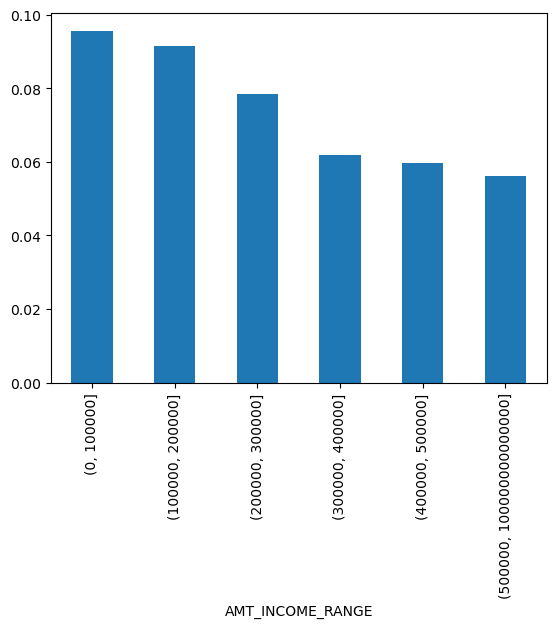

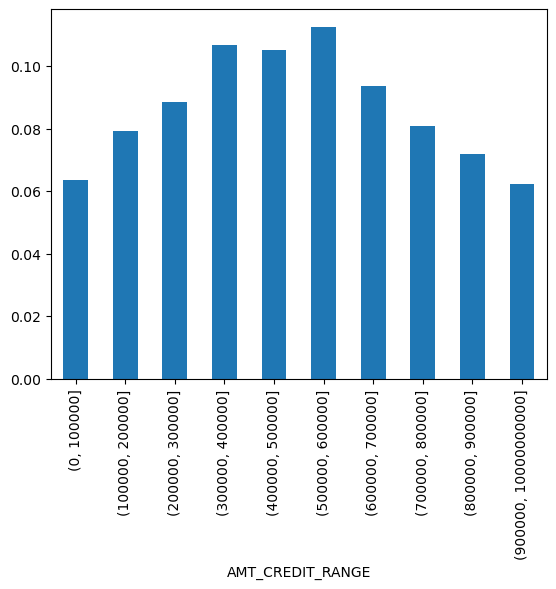

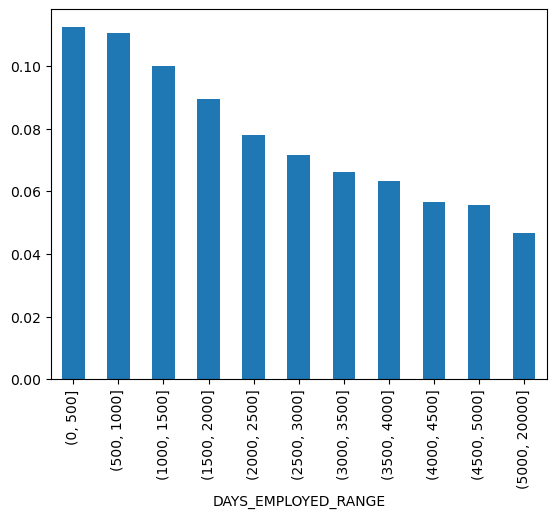

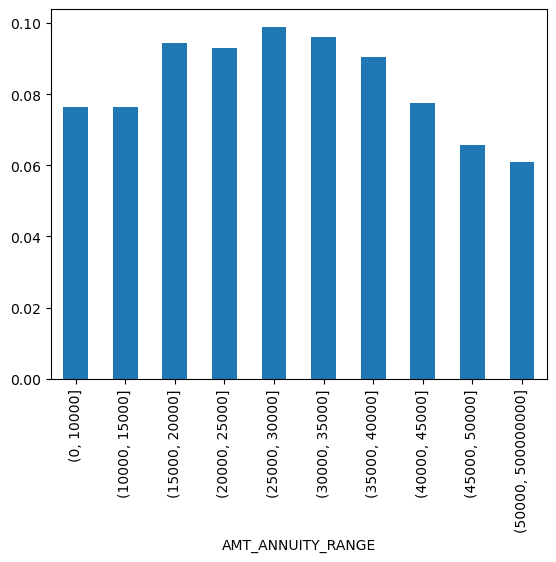

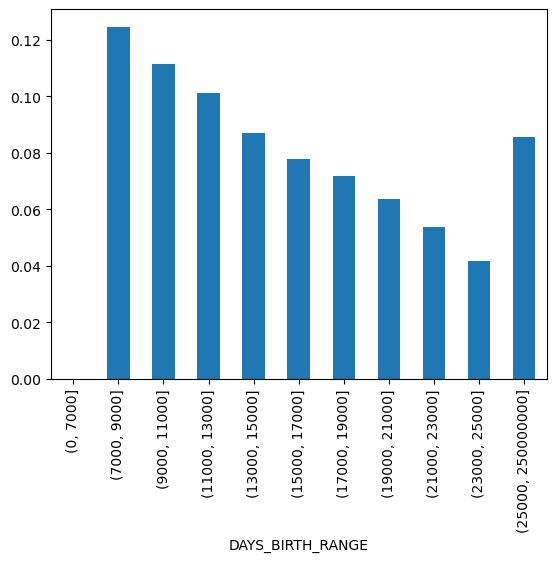

In [99]:
for i in binned_cols:
    i_repay = target0_df.groupby(i)['TARGET'].count()
    i_def = target1_df.groupby(i)['TARGET'].count()
    percentage_default = i_def / (i_repay + i_def)
    percentage_default.plot.bar()
    plt.show()

In [100]:
# from the above plots it can be seen, people with higher income tend to repay and less likely to default.
# Also , we see people with more days of current employment tend to repay due to more stability.
# annuity amount in the range of 25000-30000 has more default likelyness.

In [101]:
# checking the cat columns wrt TARGET var.

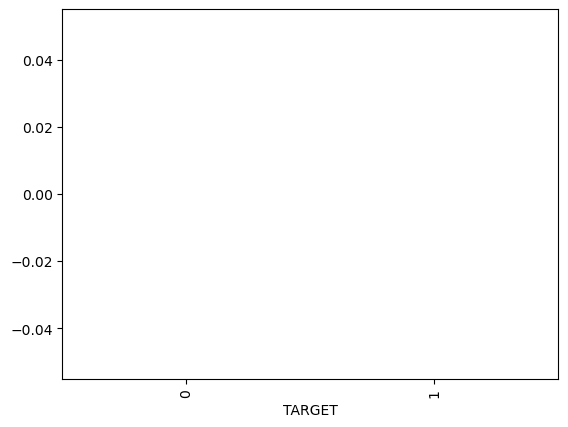

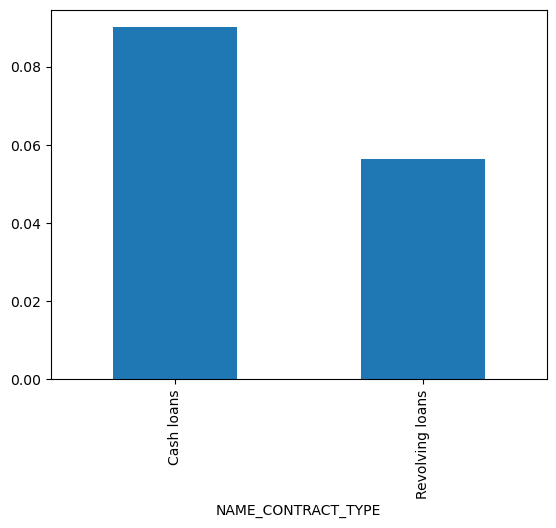

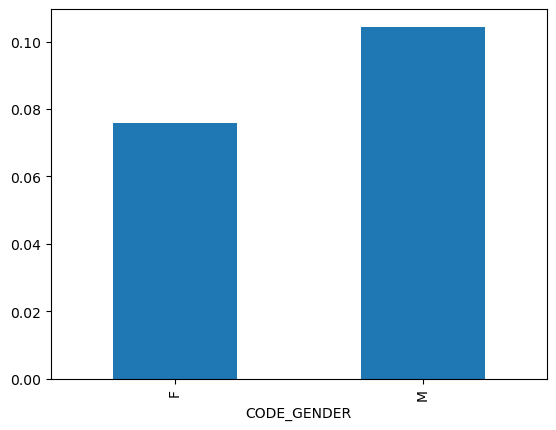

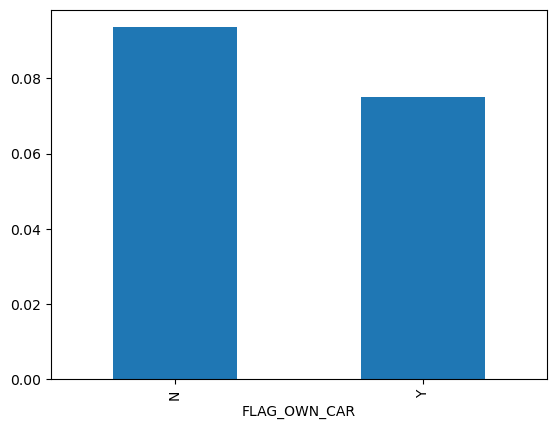

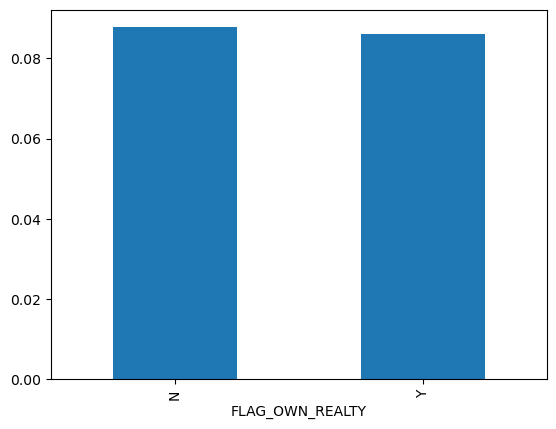

...

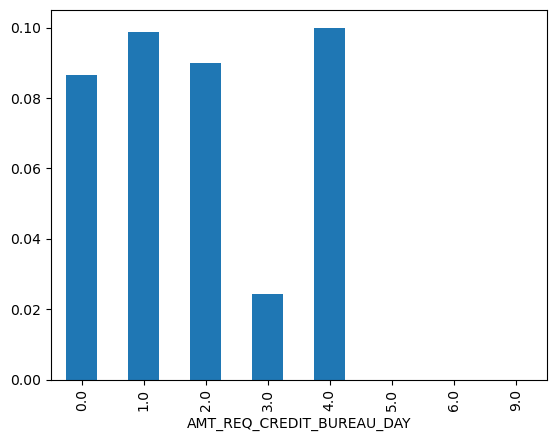

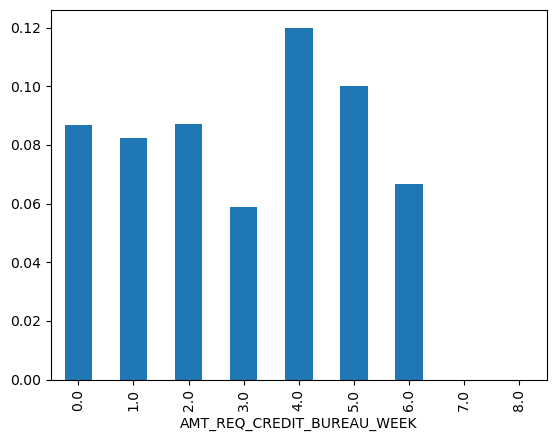

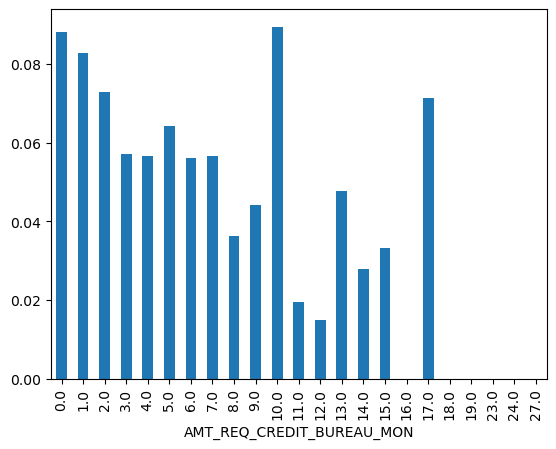

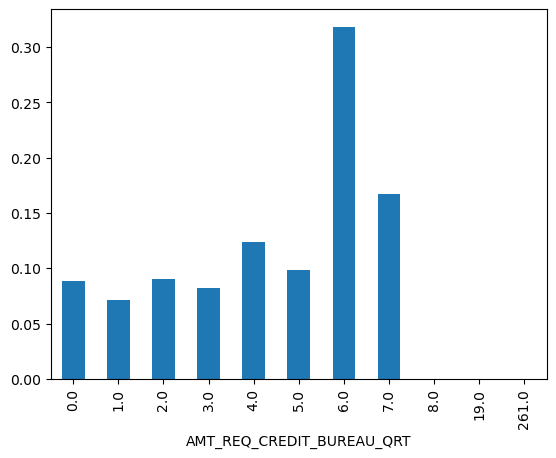

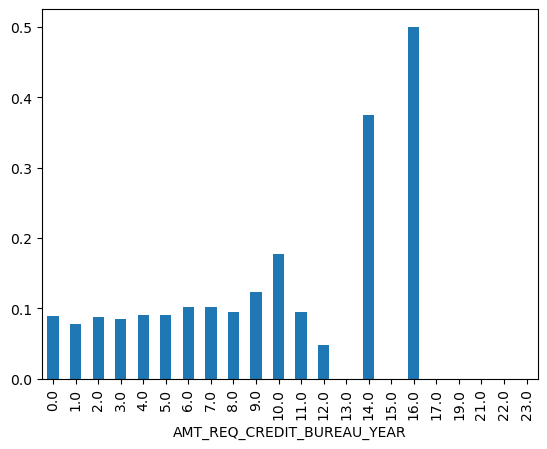

In [102]:
for i in cat_cols:
    i_repay = target0_df.groupby(i)['TARGET'].count()
    i_def = target1_df.groupby(i)['TARGET'].count()
    percentage_default = i_def / (i_repay + i_def)
    percentage_default.plot.bar()
    plt.show()

In [103]:
#observations : 
# 1.Cash loans are at a higher risk of default.
# 2.With more children the chance of default is generally higher.
# 3.People in 'Working' category less likely to repay.
# 4. People with lower levels of education and with low skills have high deafult rate.
# 5. Student, Pensioner and Businessman are less likely to default.
#6. People living in rented apartments have high % of dafault rate and lowest default rate observed for people living in office apartments.

## Bivariate/Multivariate  Analysis 

In [104]:
# for continouous cols : 


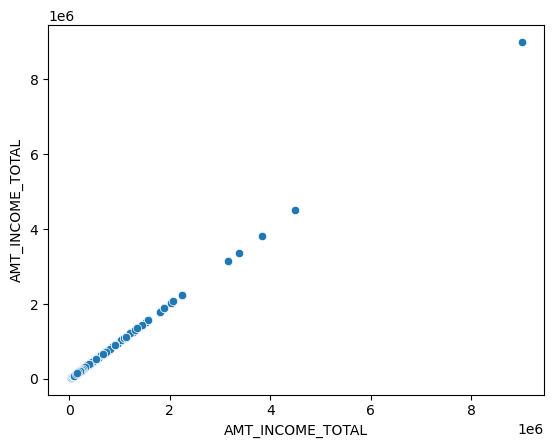

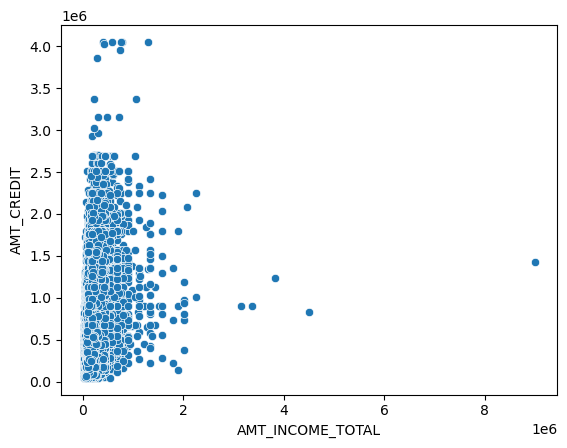

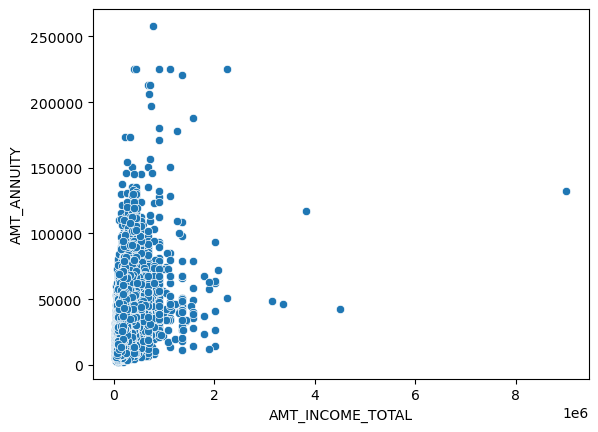

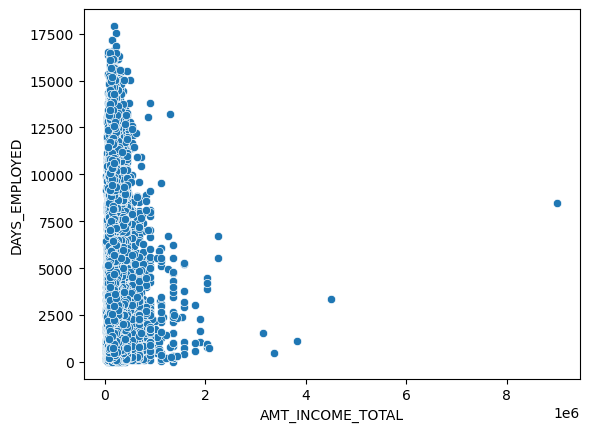

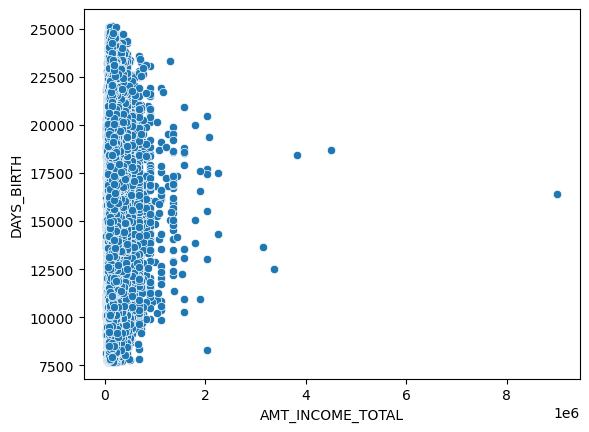

...

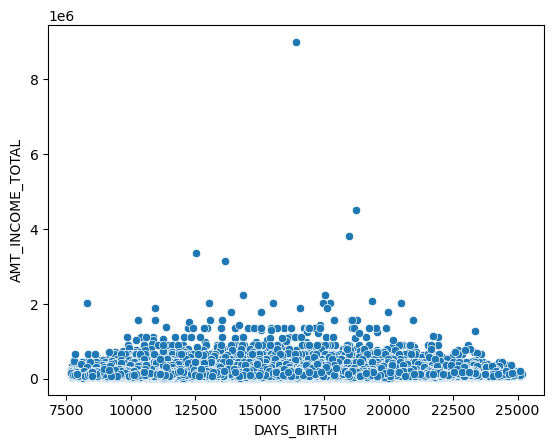

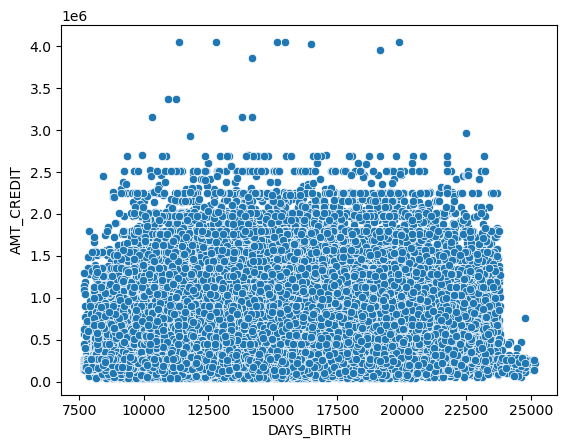

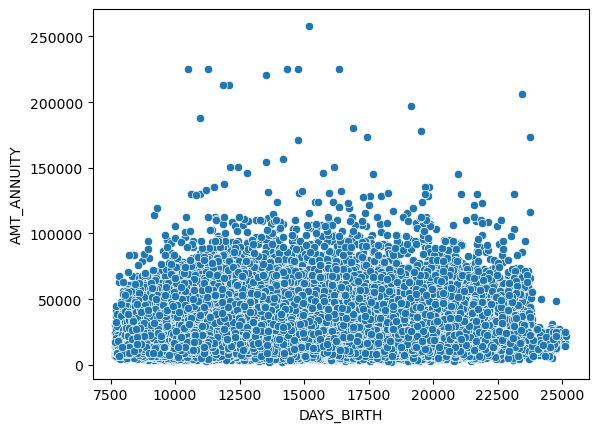

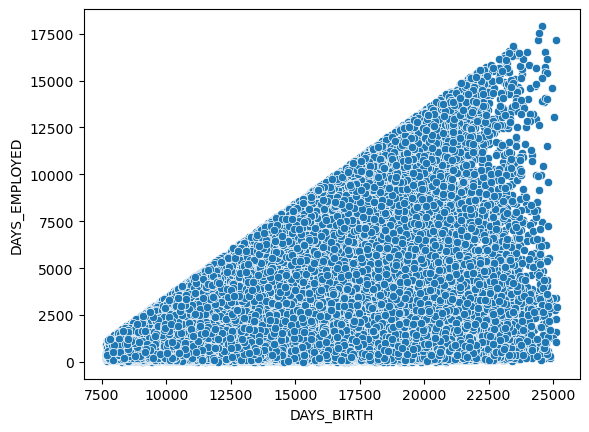

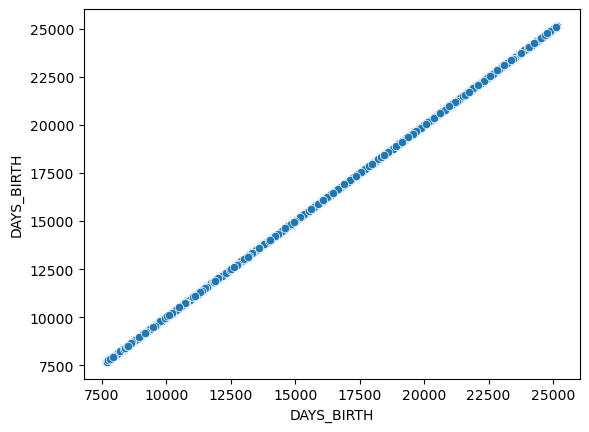

In [105]:
for i in ['AMT_INCOME_TOTAL' , 'AMT_CREDIT', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_BIRTH']:
    for j in ['AMT_INCOME_TOTAL' , 'AMT_CREDIT', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_BIRTH']:
        sns.scatterplot(df_new_sample[i] , df_new_sample[j])
        plt.show()

In [106]:
for i in ['AMT_INCOME_TOTAL' , 'AMT_CREDIT', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_BIRTH' ]:
    for j in ['AMT_INCOME_TOTAL' , 'AMT_CREDIT', 'AMT_ANNUITY', 'DAYS_EMPLOYED', 'DAYS_BIRTH']:
        print(df_new[[i, j]].corr())

                  AMT_INCOME_TOTAL  AMT_INCOME_TOTAL
AMT_INCOME_TOTAL               1.0               1.0
AMT_INCOME_TOTAL               1.0               1.0
                  AMT_INCOME_TOTAL  AMT_CREDIT
AMT_INCOME_TOTAL          1.000000    0.143101
AMT_CREDIT                0.143101    1.000000
                  AMT_INCOME_TOTAL  AMT_ANNUITY
AMT_INCOME_TOTAL          1.000000     0.175378
AMT_ANNUITY               0.175378     1.000000
                  AMT_INCOME_TOTAL  DAYS_EMPLOYED
AMT_INCOME_TOTAL          1.000000       0.013002
DAYS_EMPLOYED             0.013002       1.000000
                  AMT_INCOME_TOTAL  DAYS_BIRTH
AMT_INCOME_TOTAL          1.000000    0.021062
DAYS_BIRTH                0.021062    1.000000
                  AMT_CREDIT  AMT_INCOME_TOTAL
AMT_CREDIT          1.000000          0.143101
AMT_INCOME_TOTAL    0.143101          1.000000
            AMT_CREDIT  AMT_CREDIT
AMT_CREDIT         1.0         1.0
AMT_CREDIT         1.0         1.0
             AMT_CR

In [107]:
# nothing useful here, only thing with credit , annuity icrease which is pretty obvious.

In [108]:
# between categorical variables :

In [109]:
cat_cols

['TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'ORGANIZATION_TYPE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [110]:
# those who are likely to default :

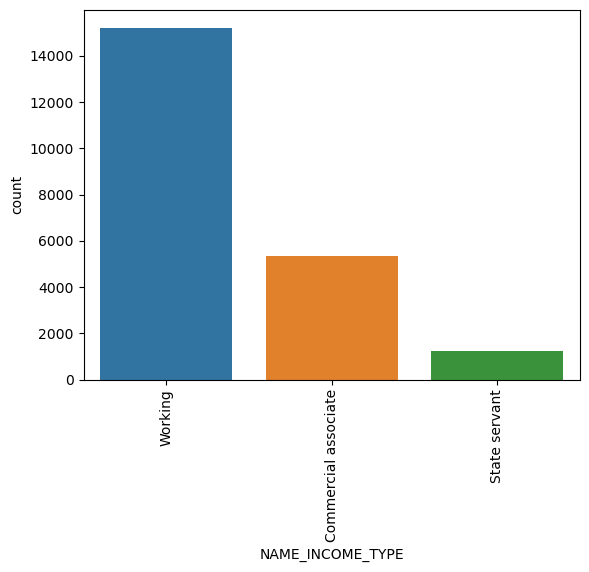

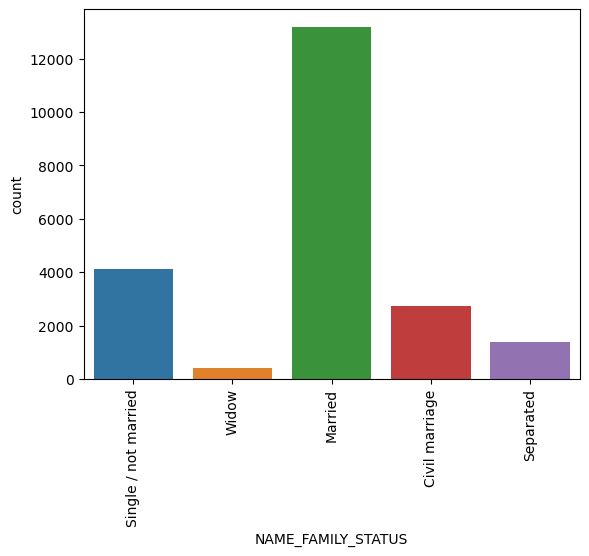

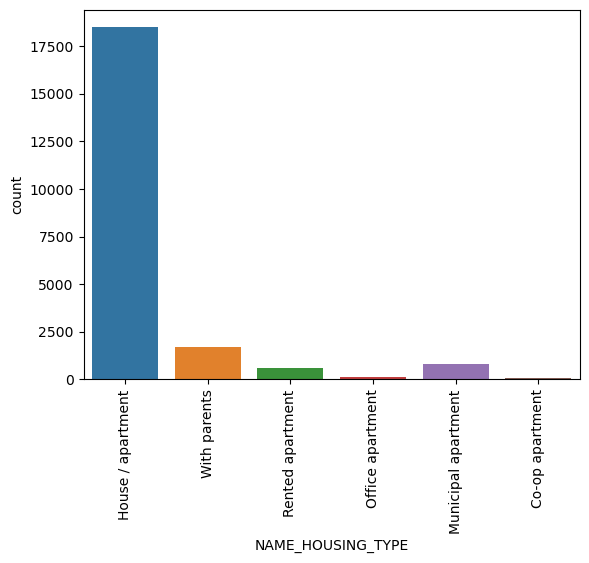

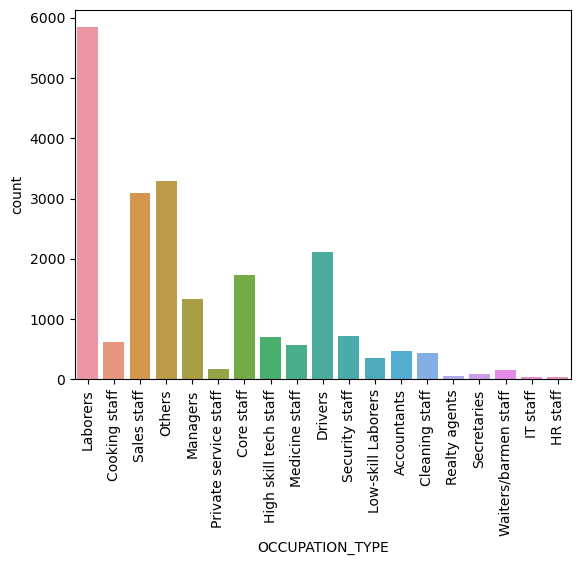

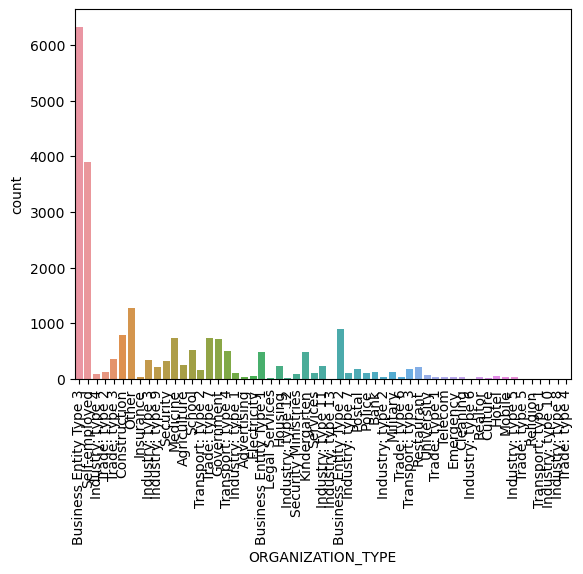

In [111]:
for i in [ 'NAME_INCOME_TYPE' , 'NAME_FAMILY_STATUS' , 'NAME_HOUSING_TYPE' , 'OCCUPATION_TYPE' , 'ORGANIZATION_TYPE']:
    sns.countplot(target1_df[i])
    plt.xticks(rotation = 90)
    plt.show()

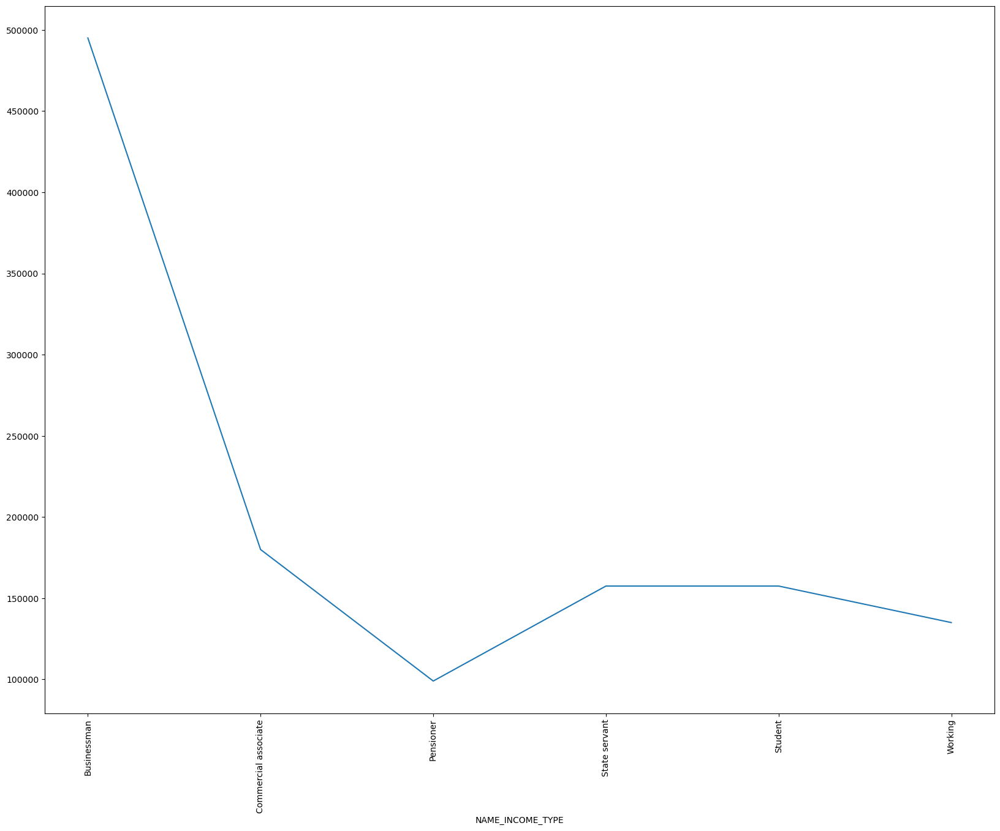

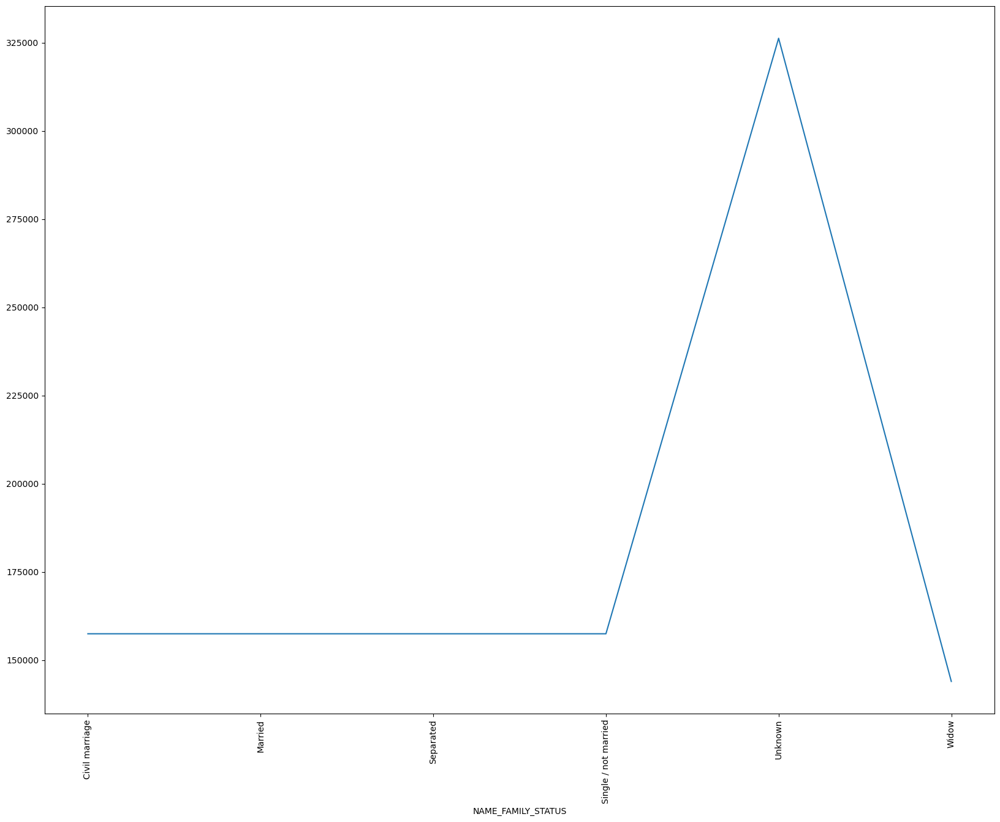

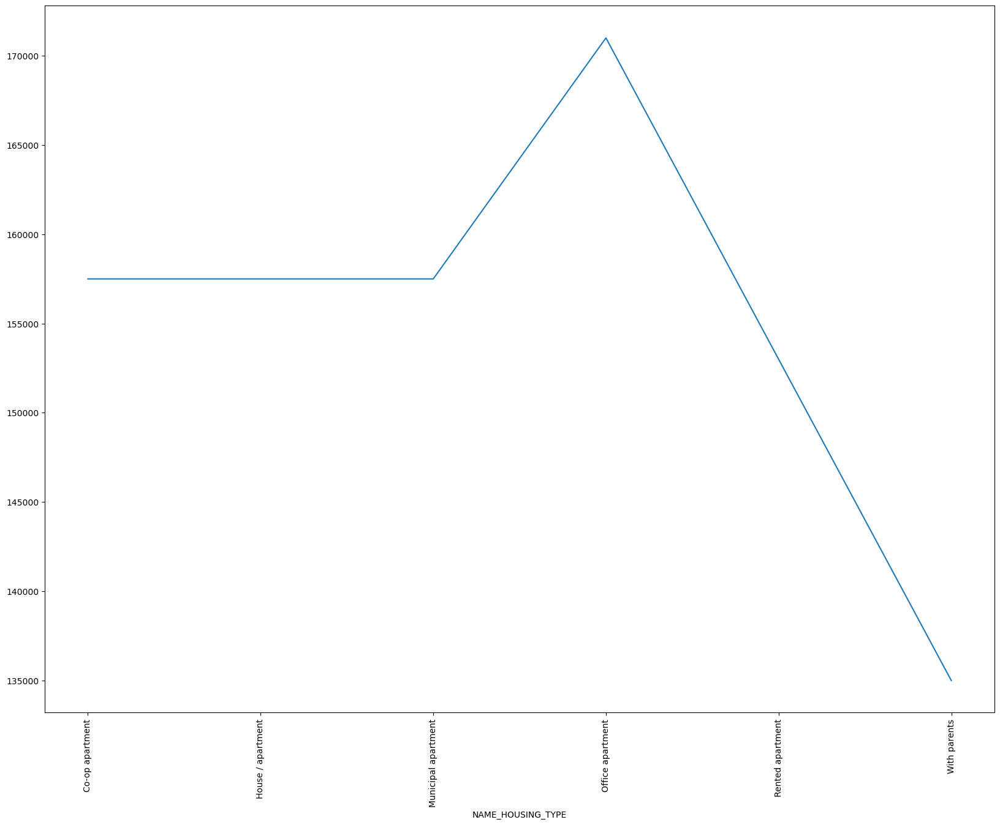

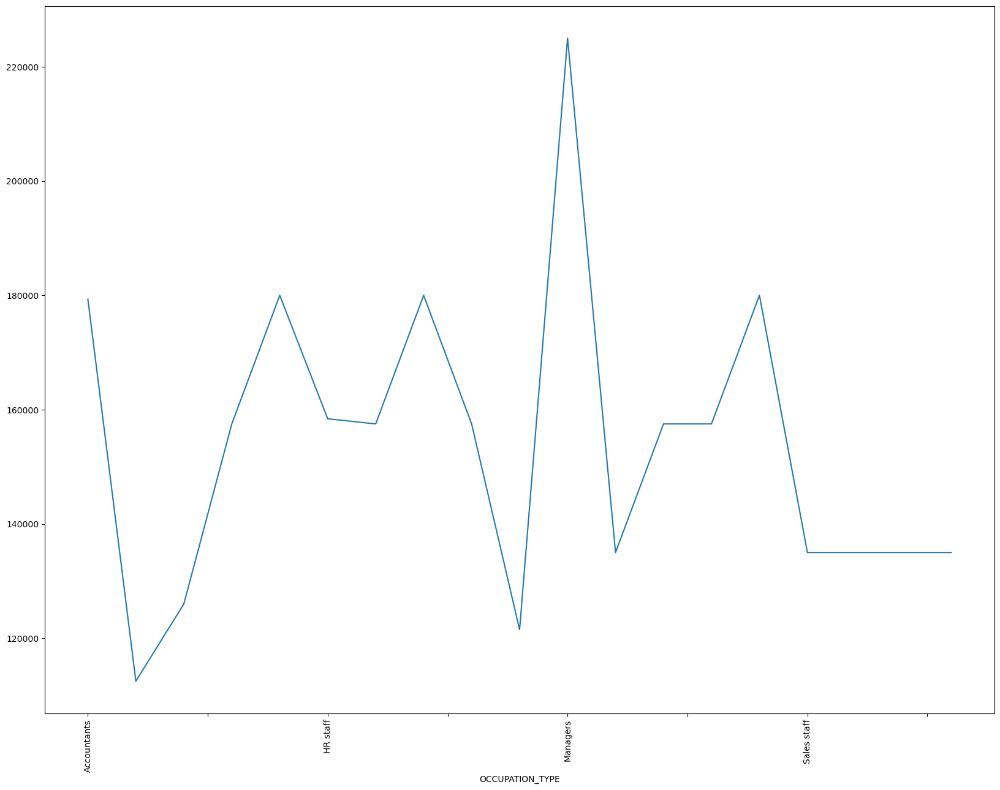

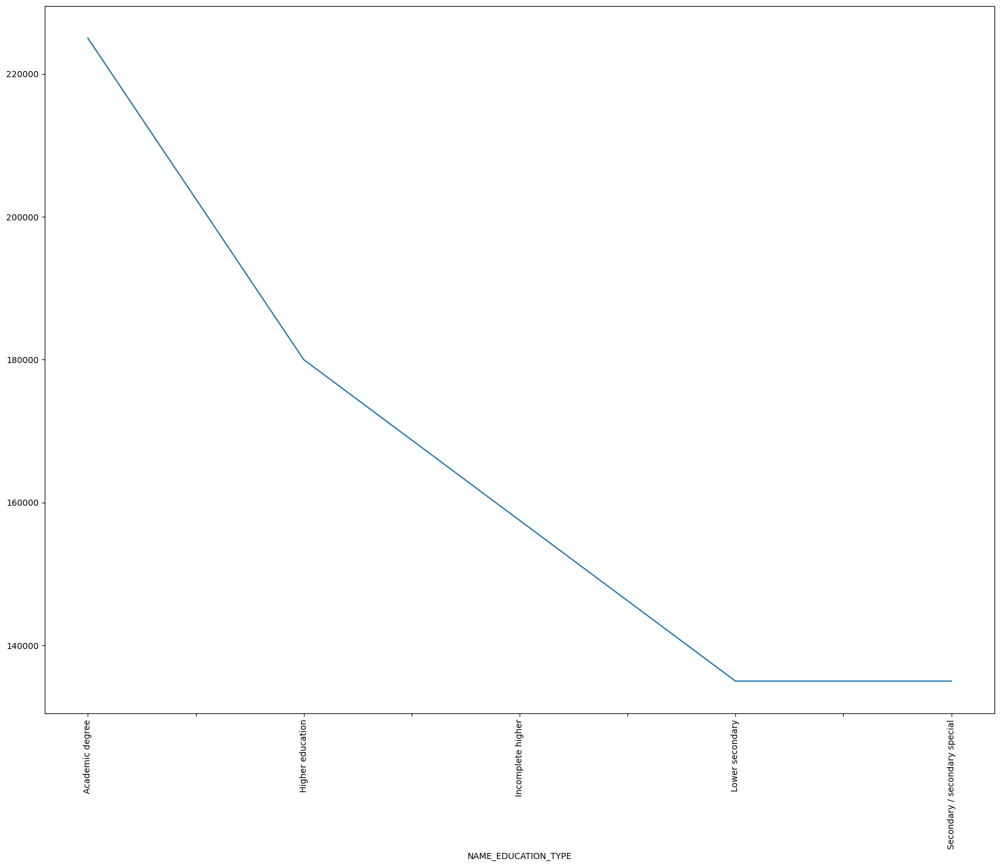

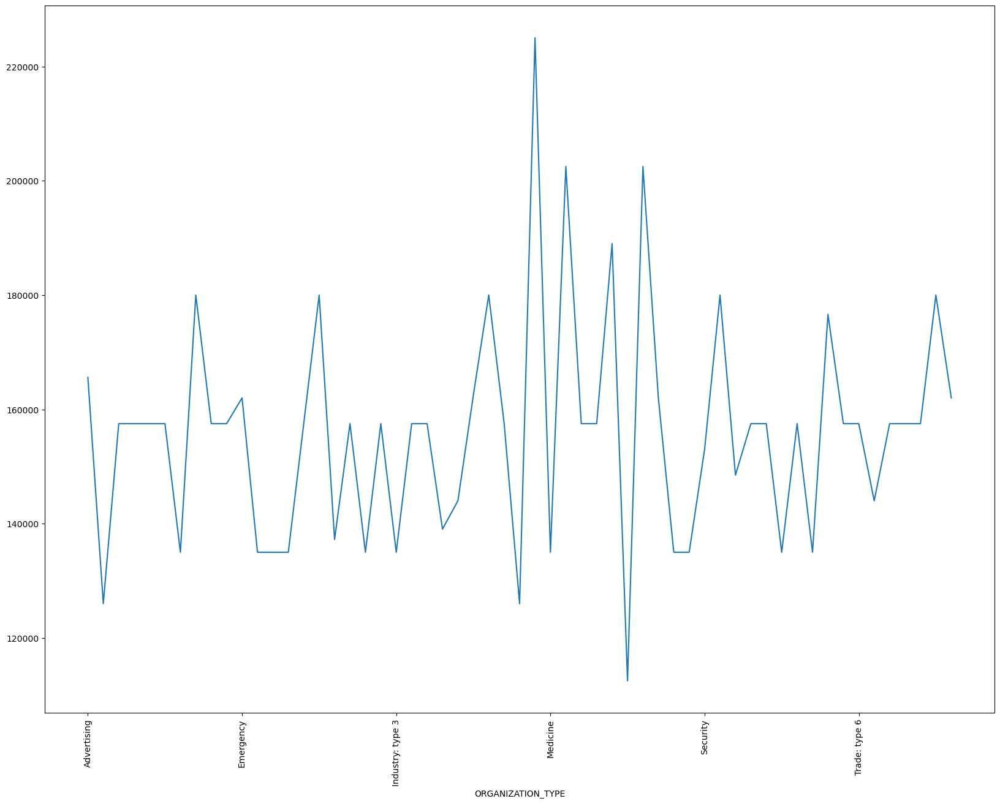

In [112]:
for i in [ 'NAME_INCOME_TYPE' , 'NAME_FAMILY_STATUS' , 'NAME_HOUSING_TYPE' , 'OCCUPATION_TYPE' , 'NAME_EDUCATION_TYPE' ,'ORGANIZATION_TYPE']:
    plt.figure(figsize = (20, 15))
    df_new.groupby(i)['AMT_INCOME_TOTAL'].median().plot()
    plt.xticks(rotation = 90)
    plt.show()

In [113]:
# Business people tend to have higher income and applies for higher credit amount.
# the same goes for people living in office apartments.
# as usual with higher education income also increases. But credit amount seems to be highest for people having secondary education.

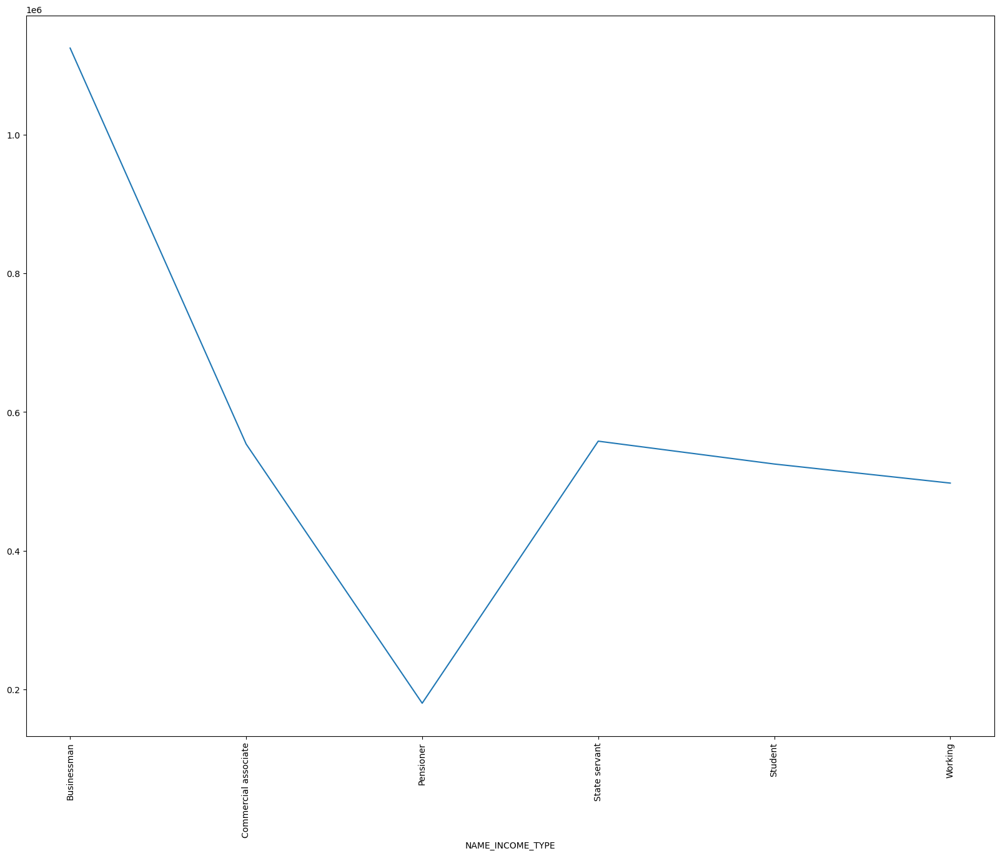

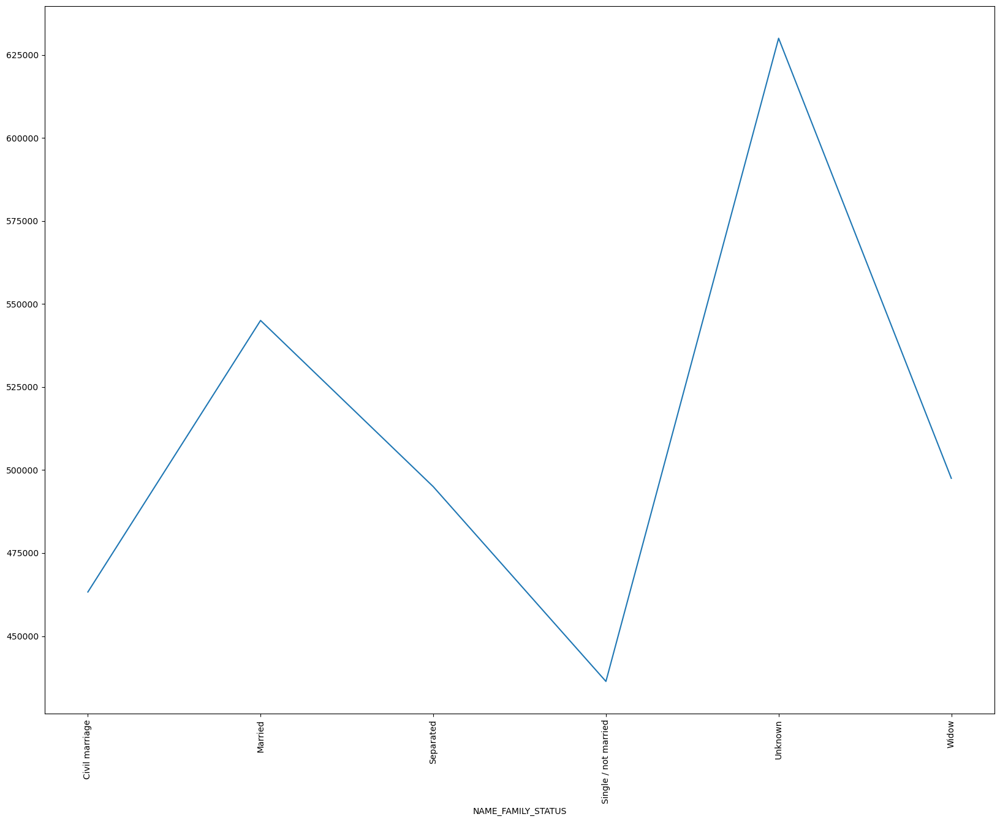

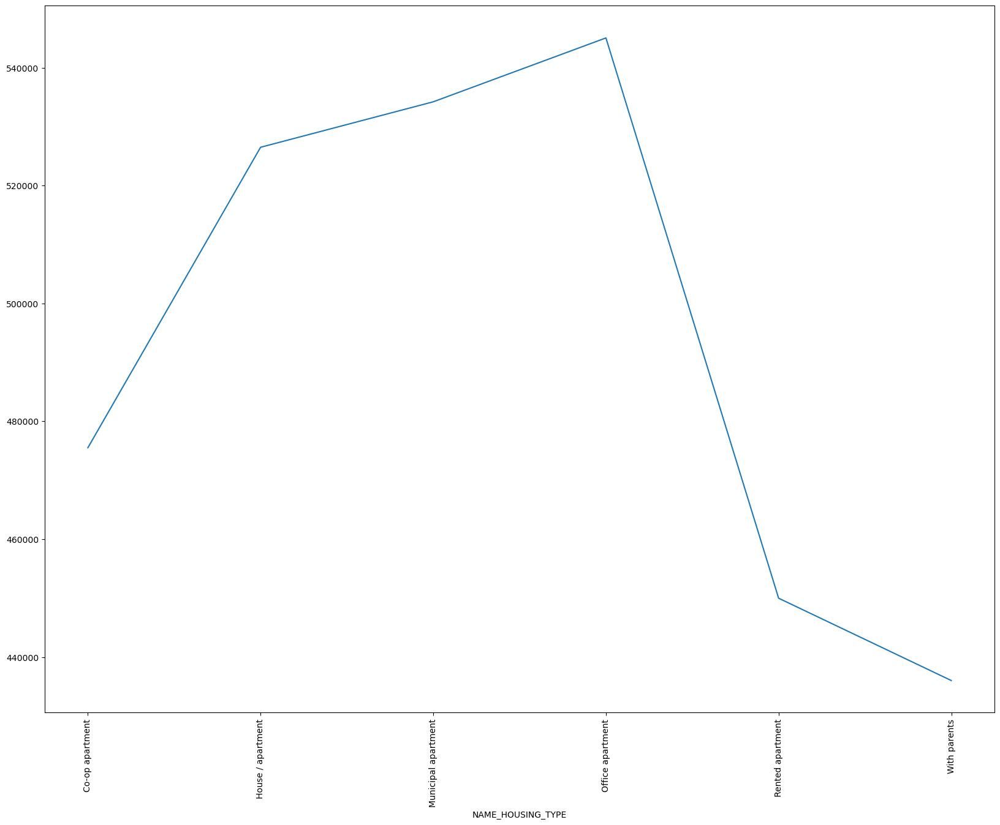

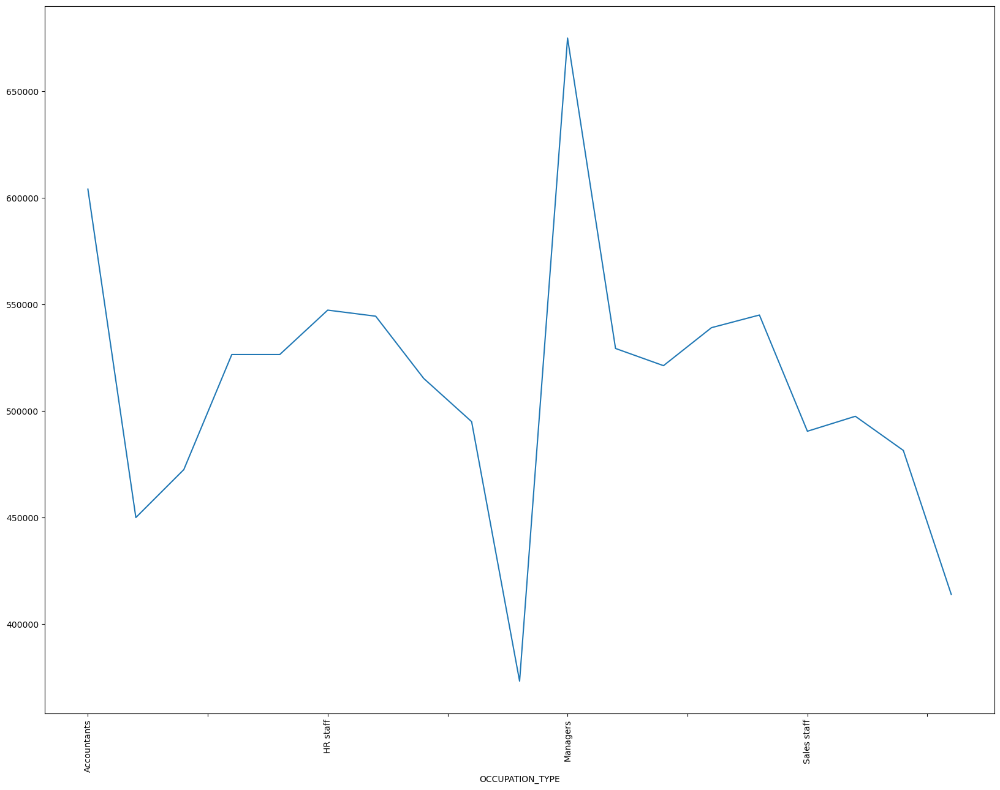

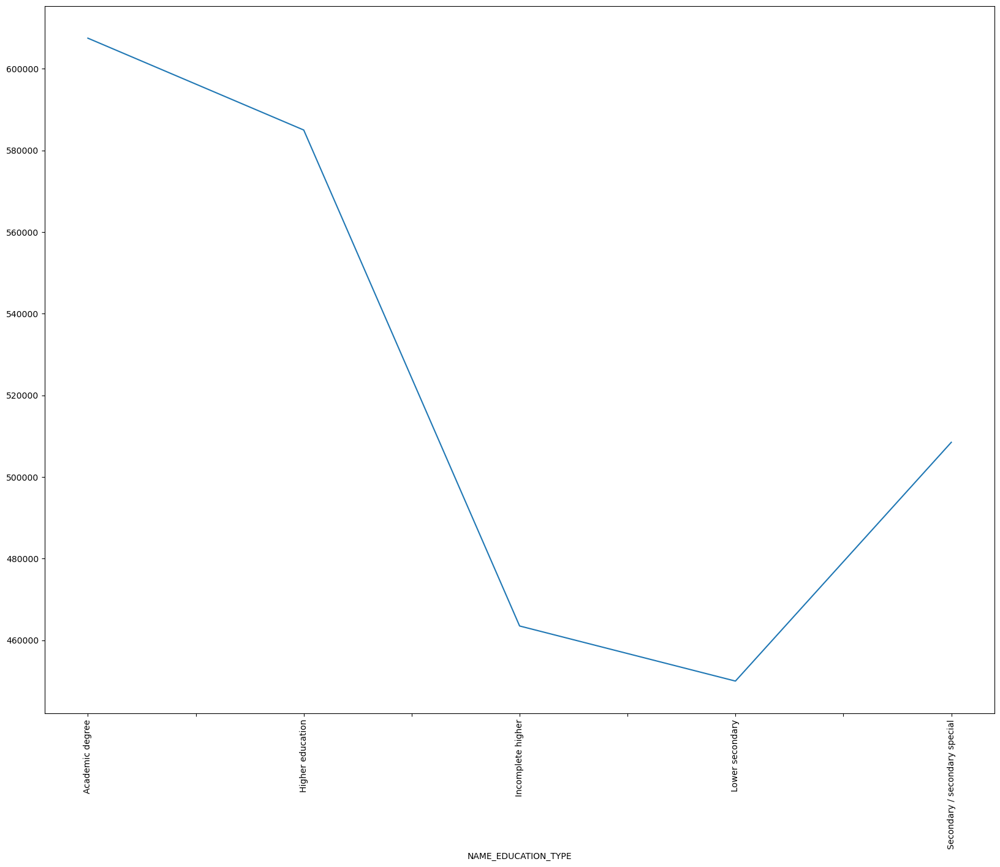

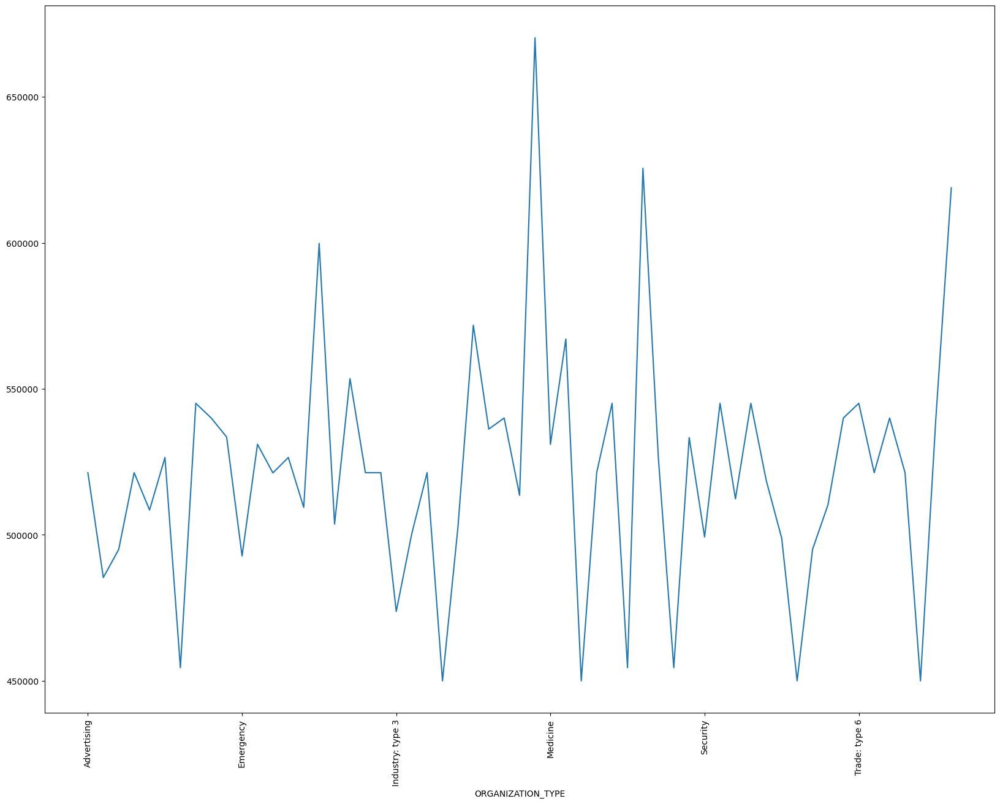

In [114]:
for i in ['NAME_INCOME_TYPE' , 'NAME_FAMILY_STATUS' , 'NAME_HOUSING_TYPE' , 'OCCUPATION_TYPE' , 'NAME_EDUCATION_TYPE' ,'ORGANIZATION_TYPE']:
    plt.figure(figsize = (20, 15))
    df_new.groupby(i)['AMT_CREDIT'].median().plot()
    plt.xticks(rotation = 90)
    plt.show()

In [115]:
target1_df_pivot1 = pd.pivot_table(data = target1_df , values = 'TARGET' , columns = 'NAME_INCOME_TYPE' , index = 'NAME_HOUSING_TYPE' , aggfunc = 'count')

<AxesSubplot:xlabel='NAME_INCOME_TYPE', ylabel='NAME_HOUSING_TYPE'>

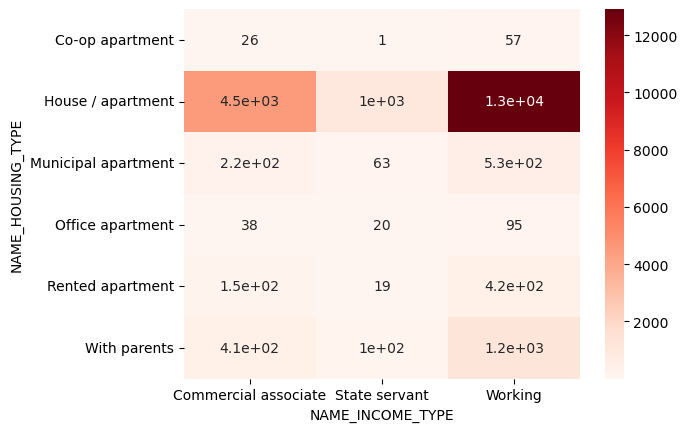

In [116]:
sns.heatmap(target1_df_pivot1 , annot = True , cmap = 'Reds')

In [117]:
# Working people living in house/apartments are more in number to dafault.

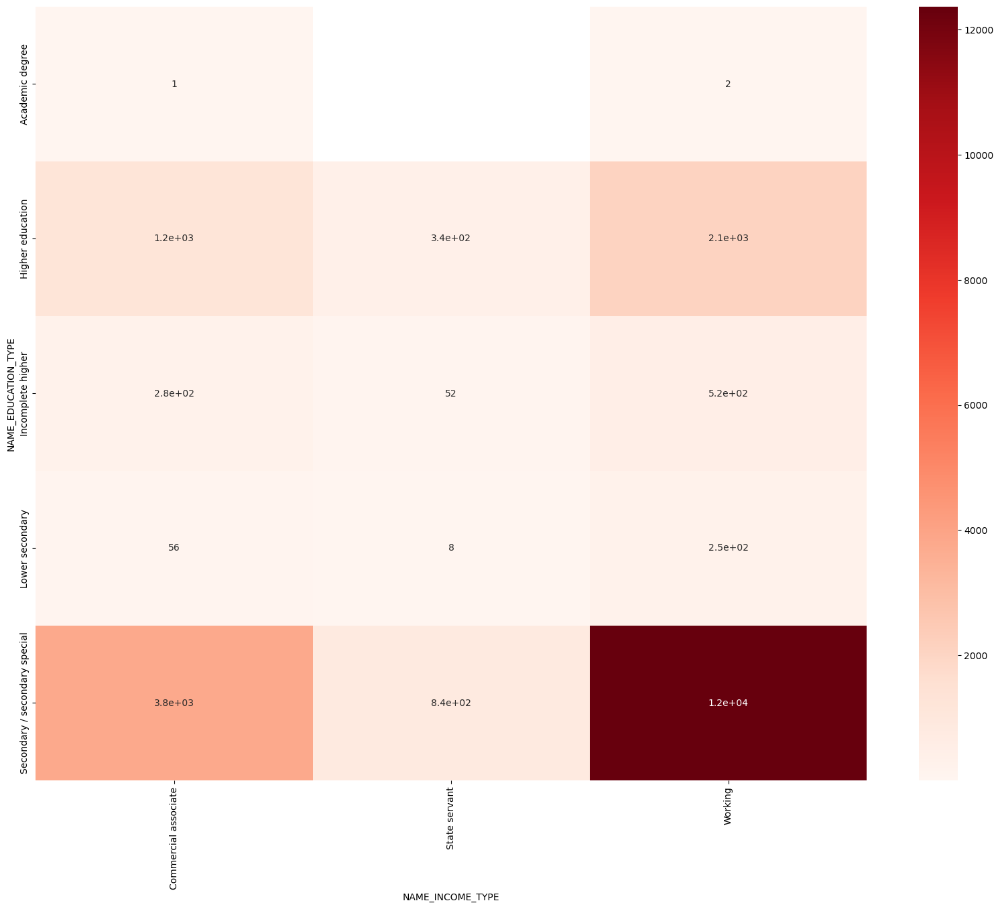

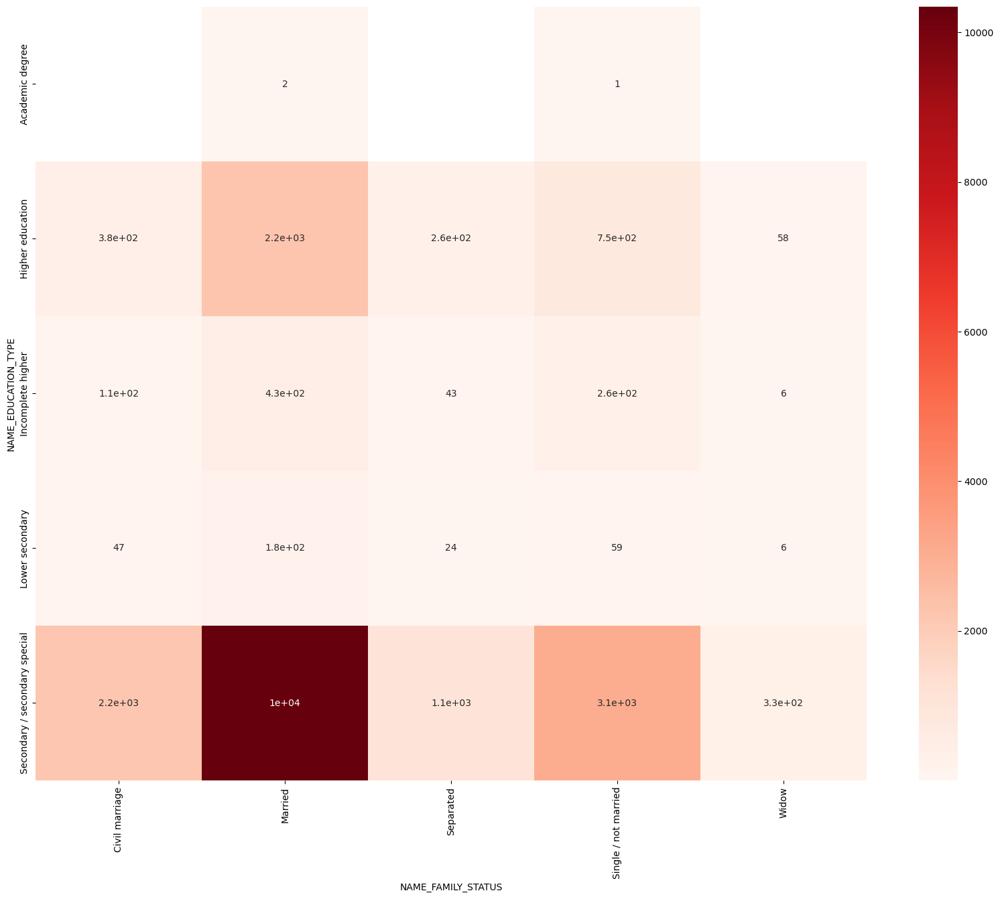

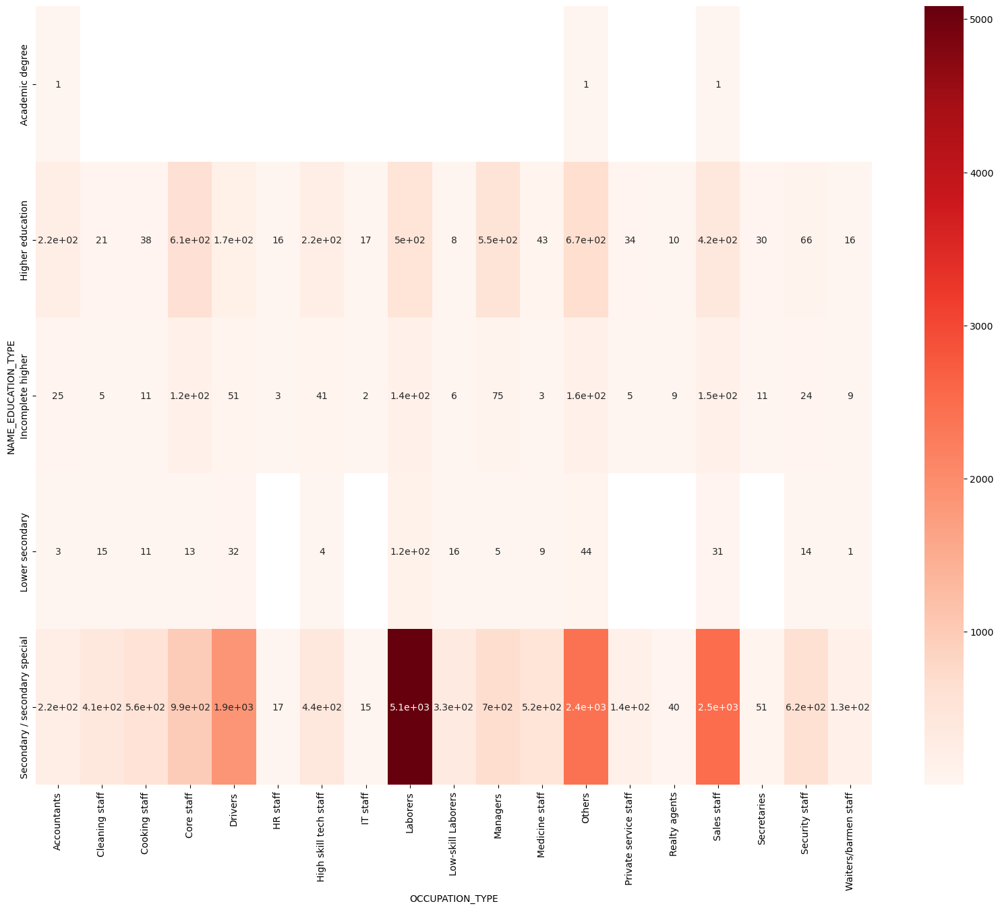

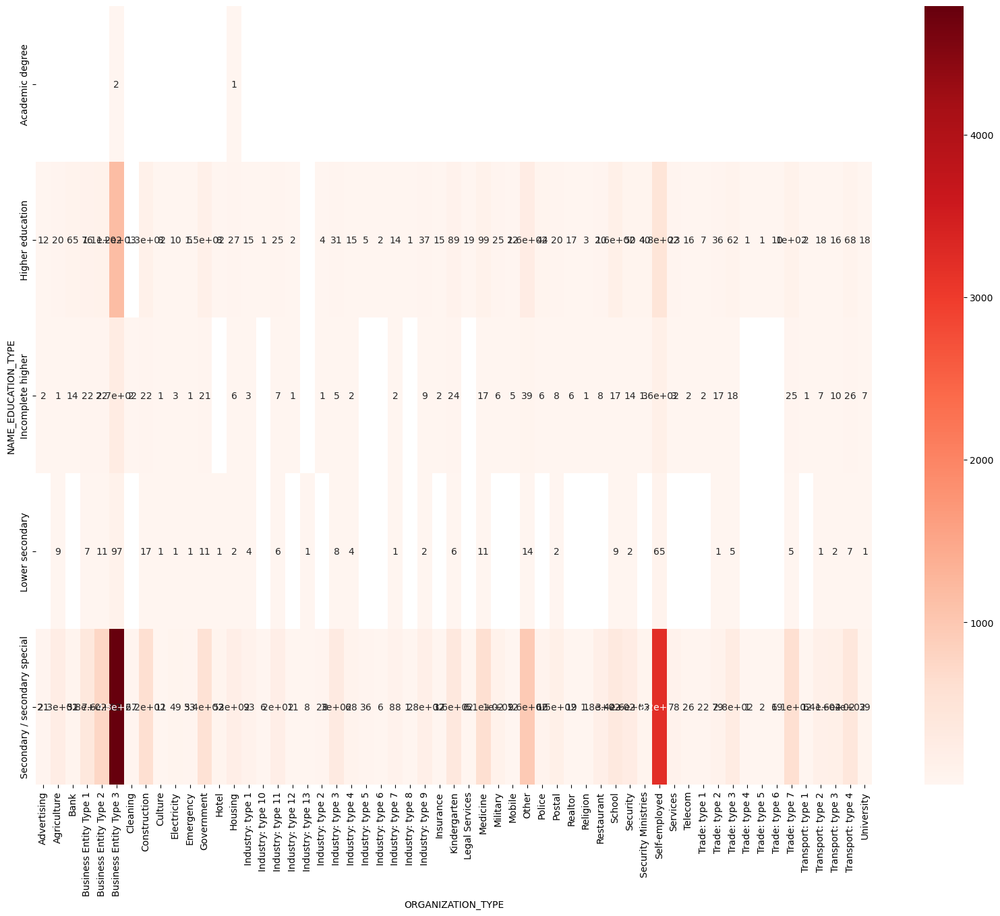

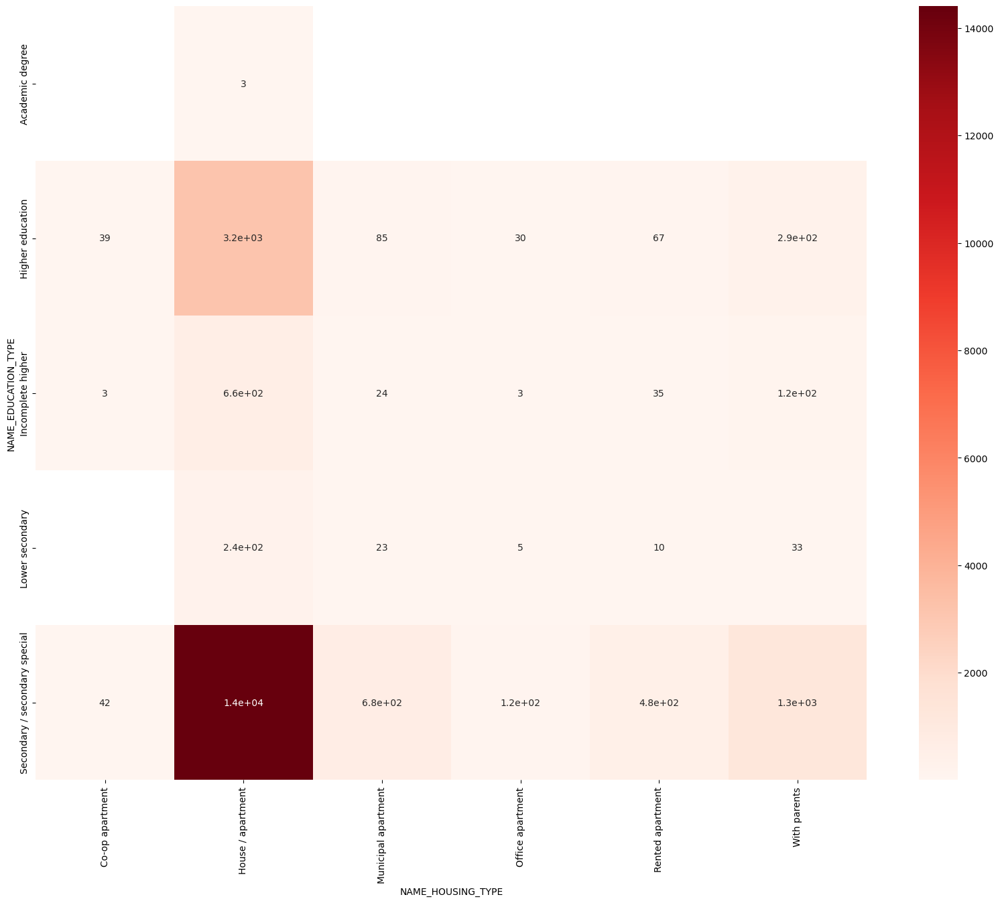

In [118]:
for i in ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS' , 'OCCUPATION_TYPE' , 'ORGANIZATION_TYPE','NAME_HOUSING_TYPE']:
    var = pd.pivot_table(data = target1_df , values = 'TARGET' , columns = i , index = 'NAME_EDUCATION_TYPE' , aggfunc = 'count')
    plt.figure(figsize = (20, 15))
    sns.heatmap(var , annot = True , cmap = 'Reds')
    plt.xticks(rotation  = 90)
    plt.show()


In [119]:
#  'Working' people with 'seconday/seconday special' are more in number to dafault.
# Similarly elf employed type people are more in mumbers to default aross education levels.
# people having academic degree seems to have lowest rate of defaults.

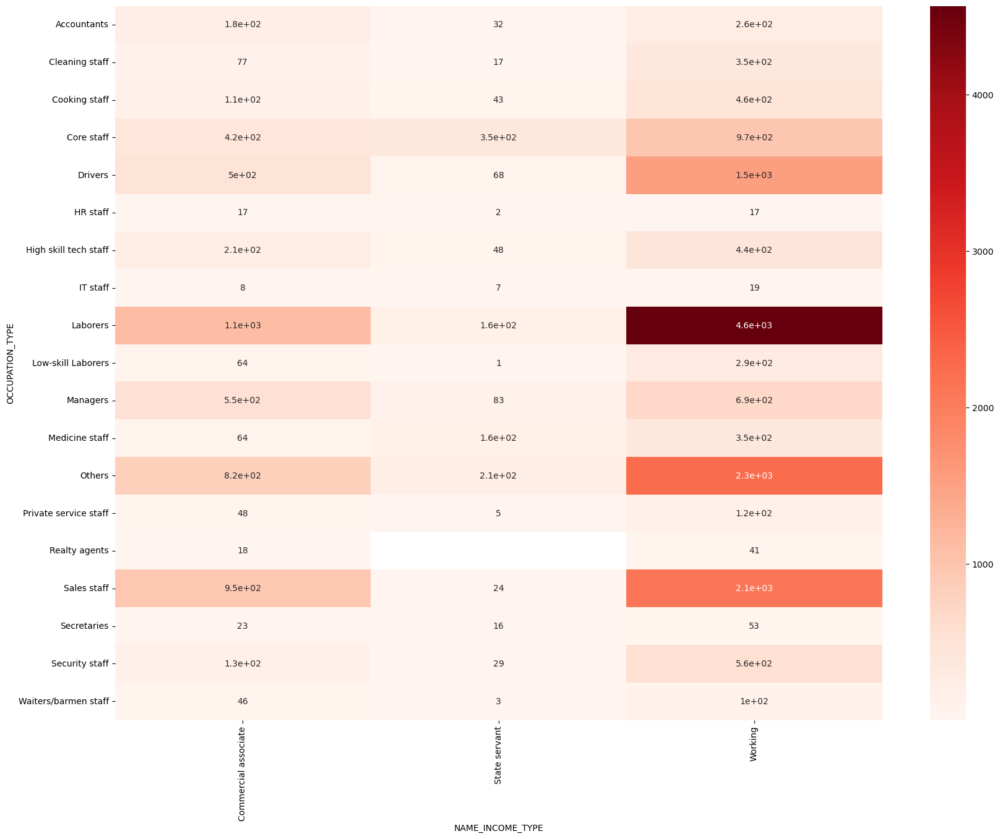

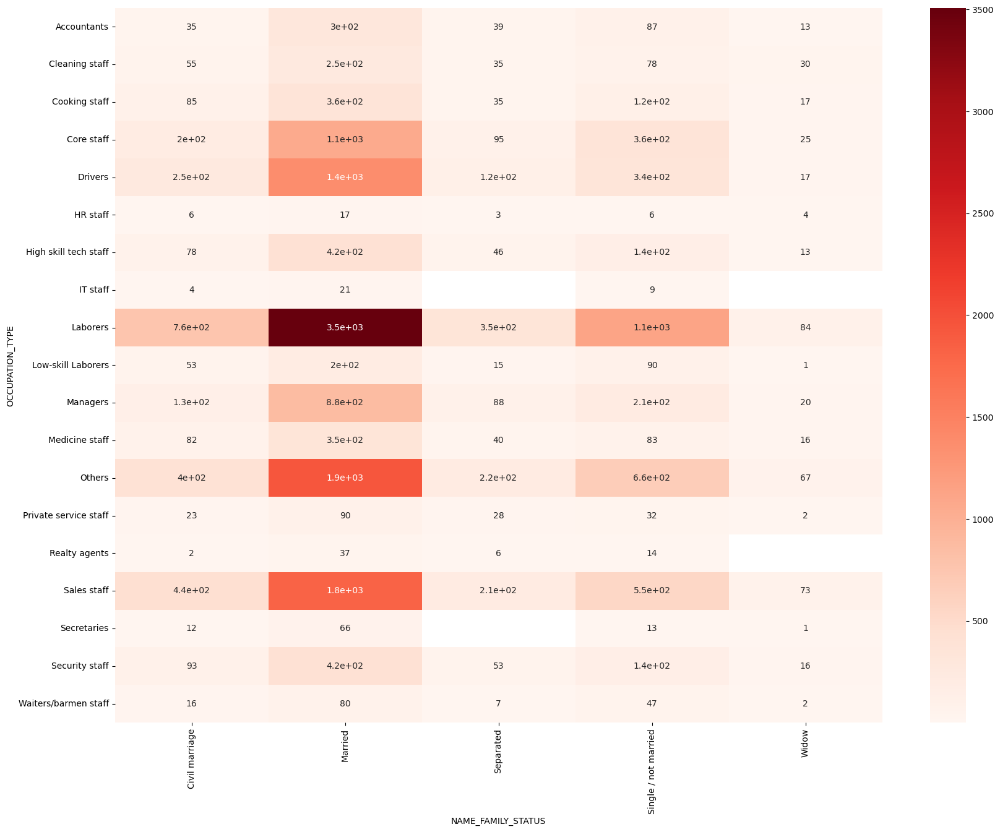

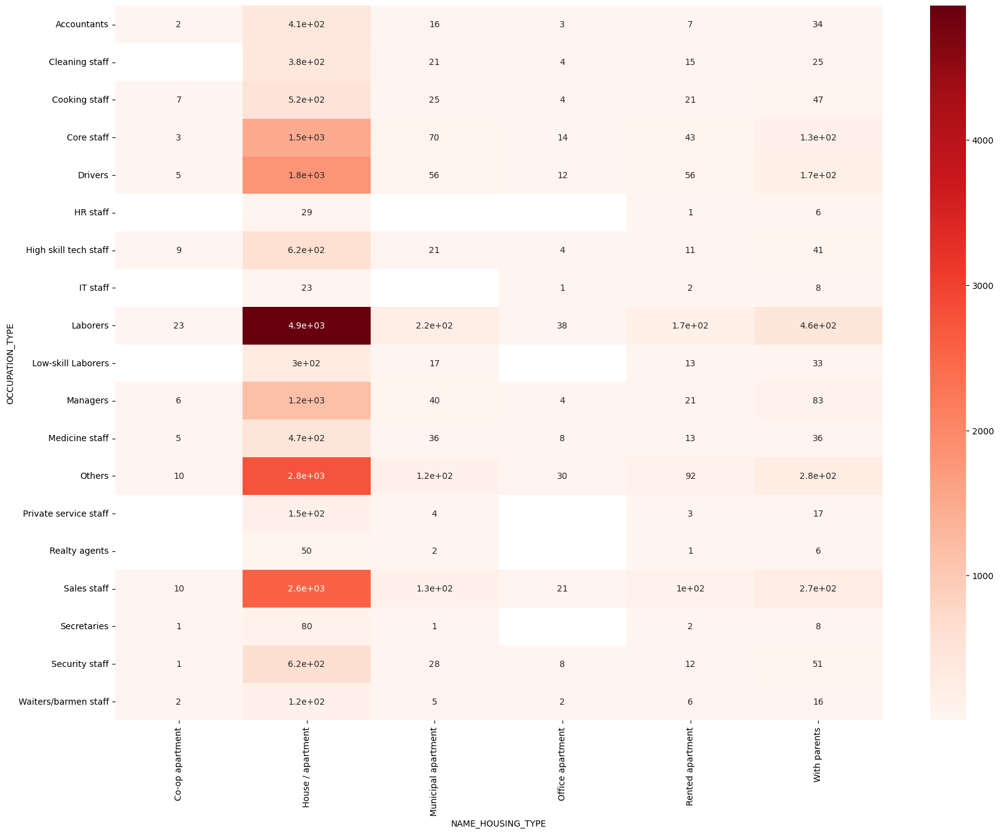

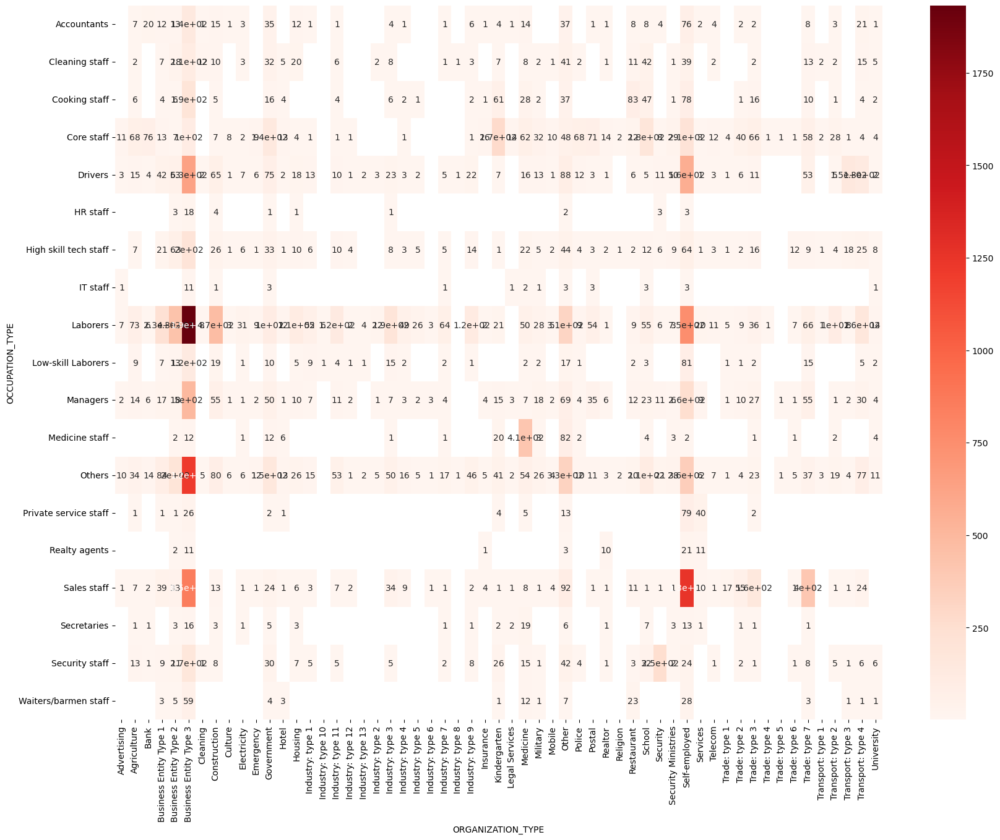

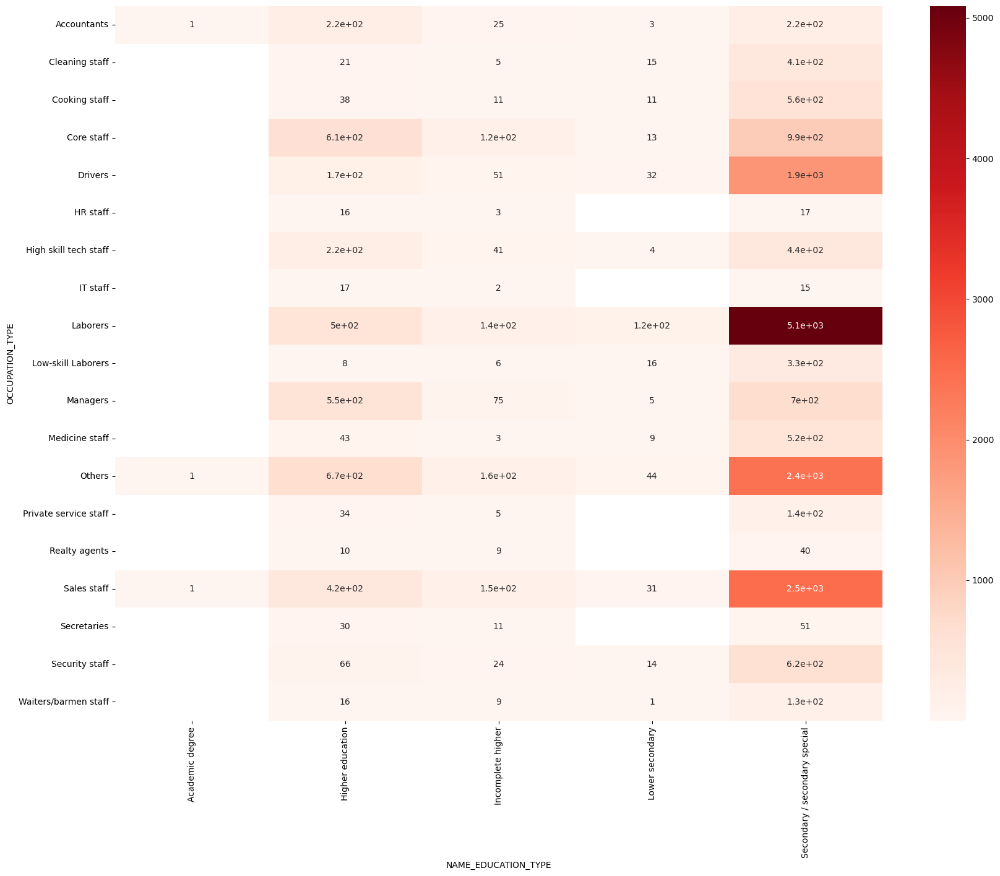

In [120]:
for i in ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS' , 'NAME_HOUSING_TYPE' , 'ORGANIZATION_TYPE','NAME_EDUCATION_TYPE']:
    var = pd.pivot_table(data = target1_df , values = 'TARGET' , columns = i , index = 'OCCUPATION_TYPE' , aggfunc = 'count')
    plt.figure(figsize = (20, 15))
    sns.heatmap(var , annot = True , cmap = 'Reds')
    plt.xticks(rotation  = 90)
    plt.show()


In [121]:
# self employed sales stuff are more likely to default.


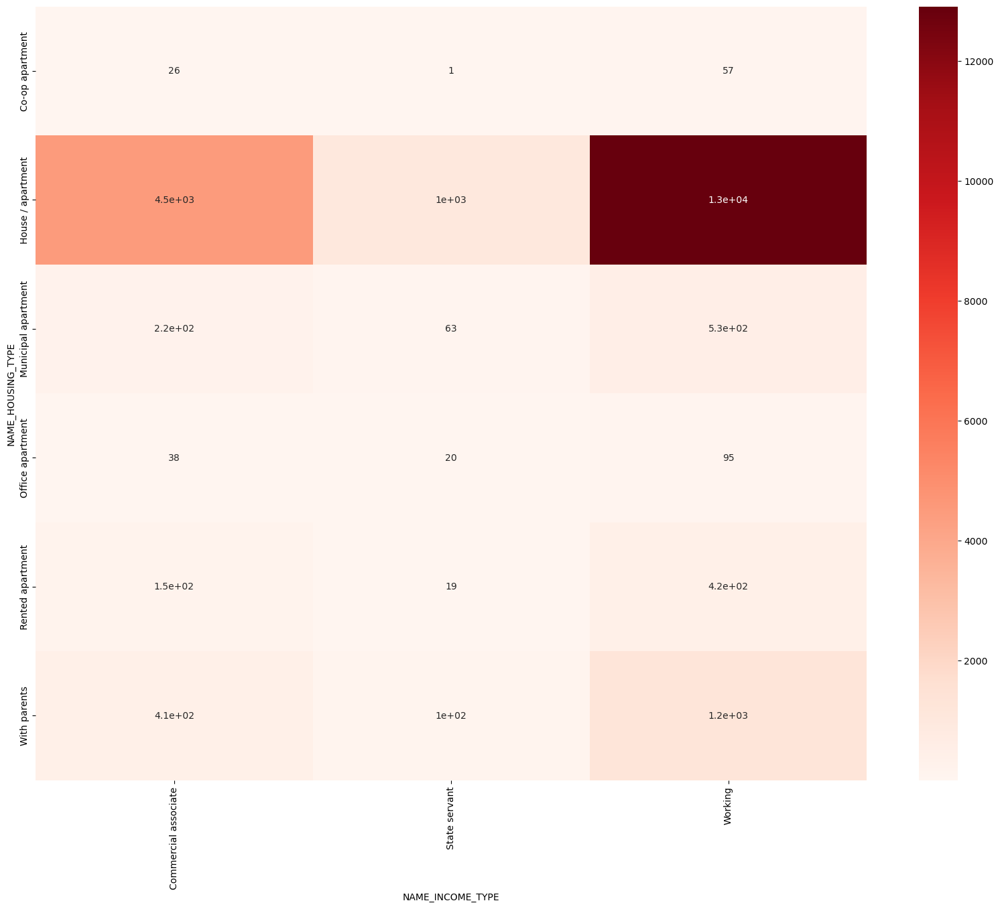

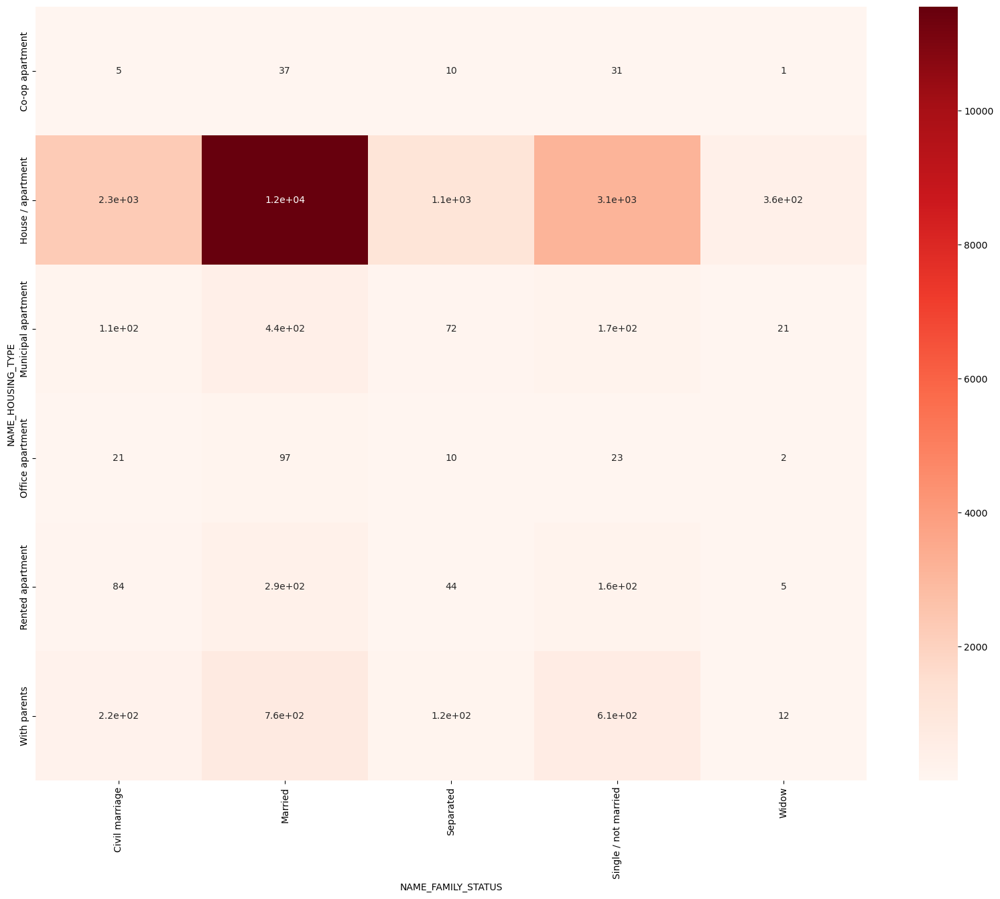

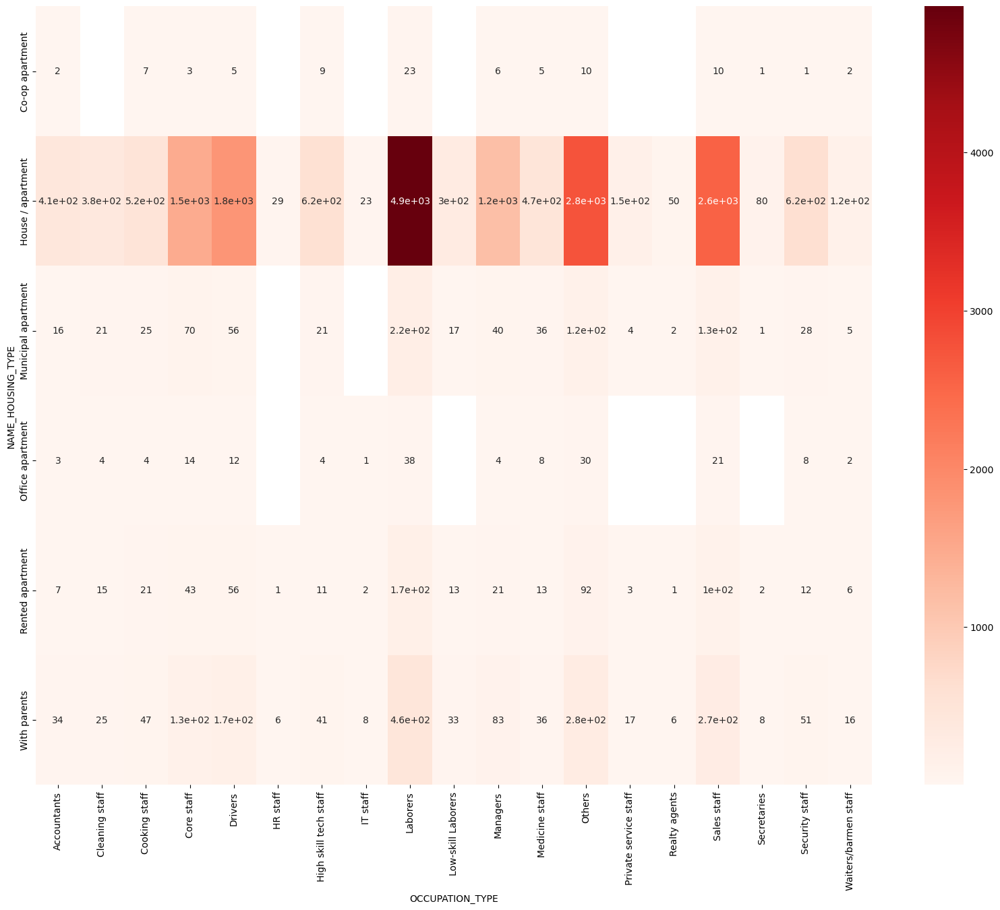

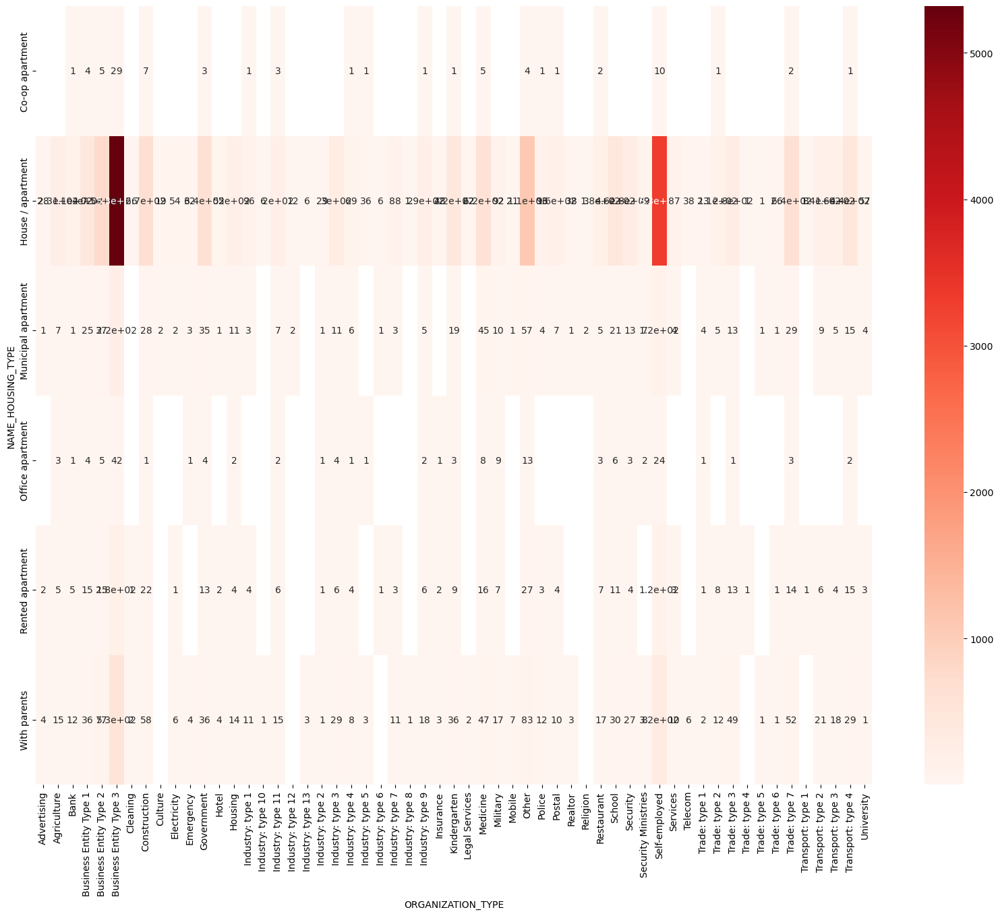

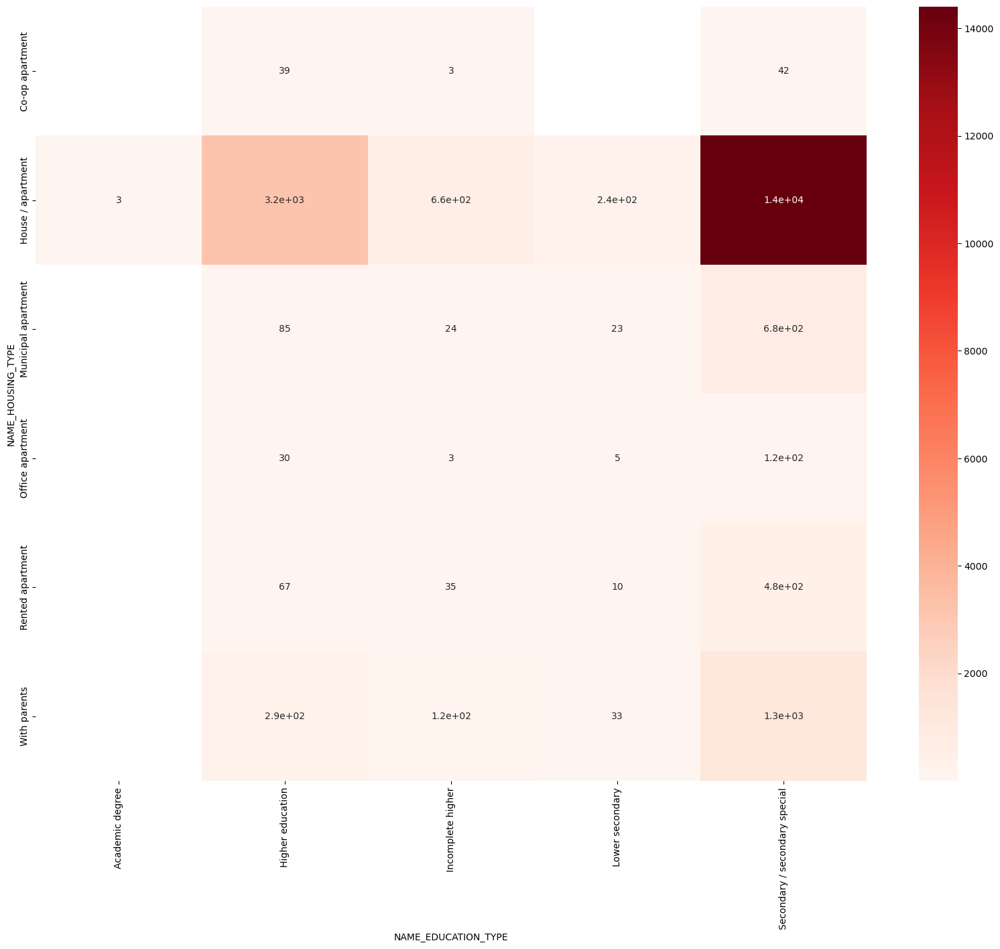

In [122]:
for i in ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS' , 'OCCUPATION_TYPE' , 'ORGANIZATION_TYPE','NAME_EDUCATION_TYPE']:
    var = pd.pivot_table(data = target1_df , values = 'TARGET' , columns = i , index = 'NAME_HOUSING_TYPE' , aggfunc = 'count')
    plt.figure(figsize = (20, 15))
    sns.heatmap(var , annot = True , cmap = 'Reds')
    plt.xticks(rotation  = 90)
    plt.show()

In [123]:
#people working in 'buseness entity type 3' are of hgher tendency to default.

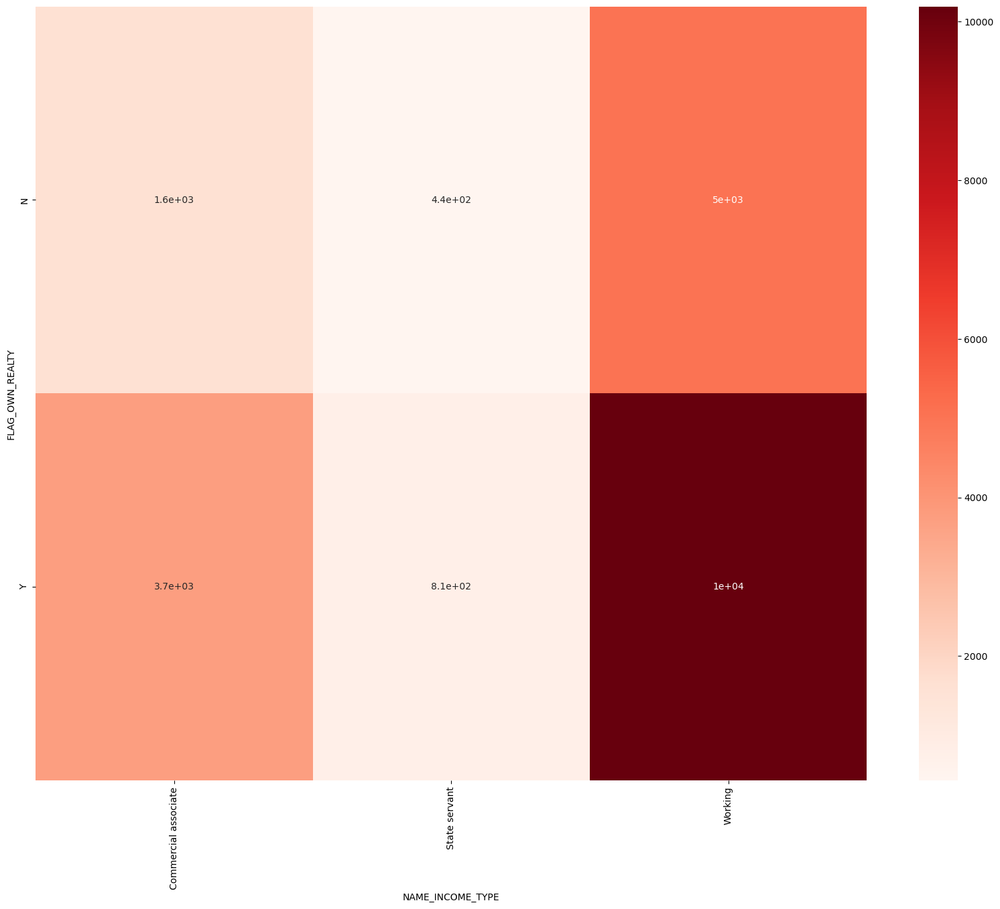

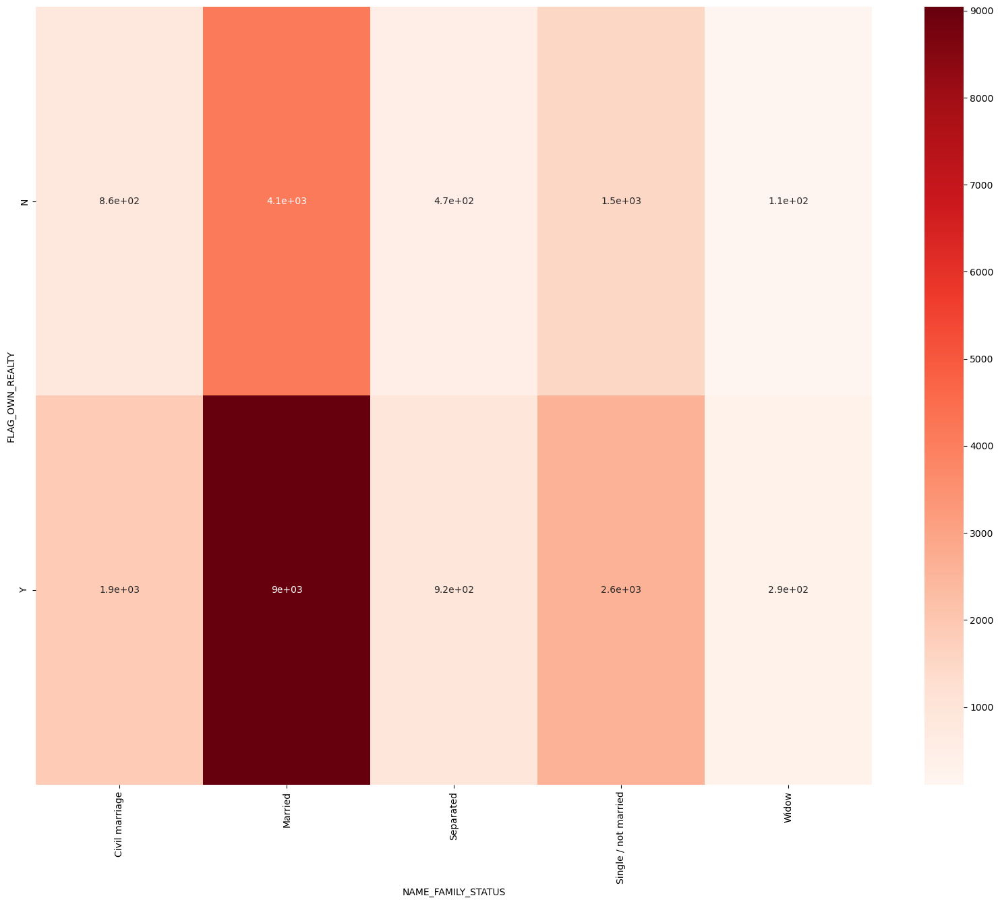

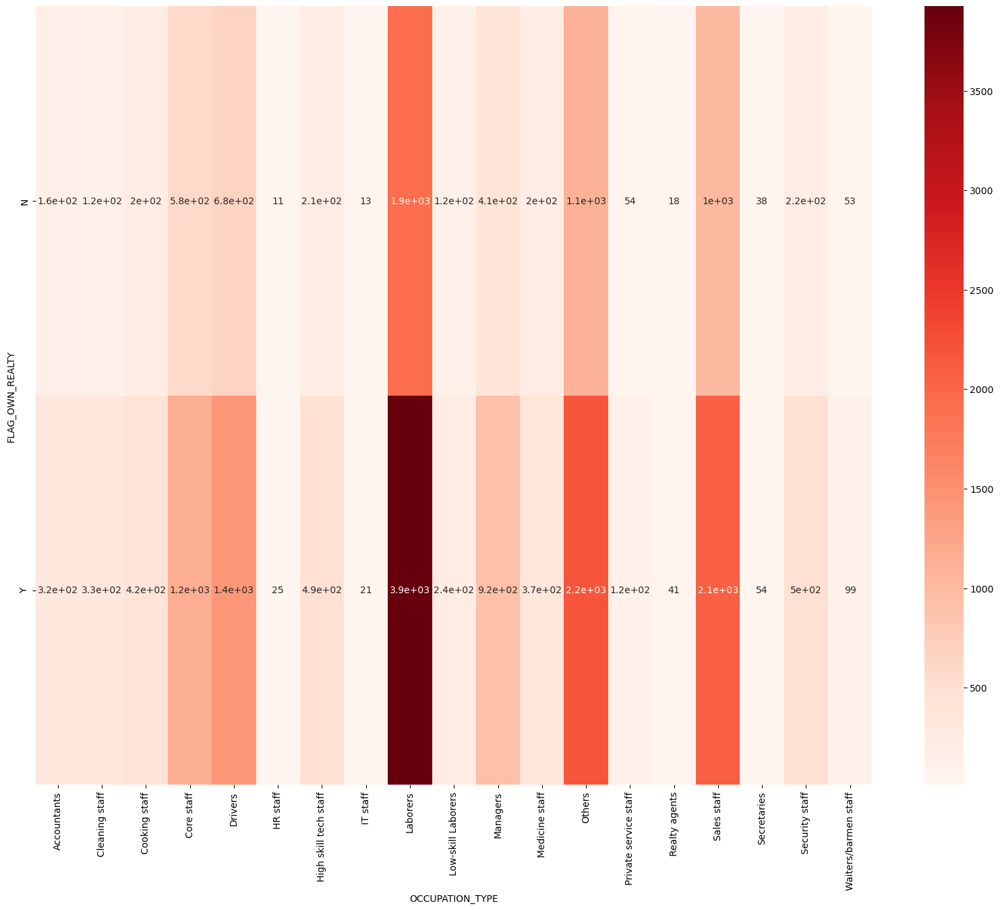

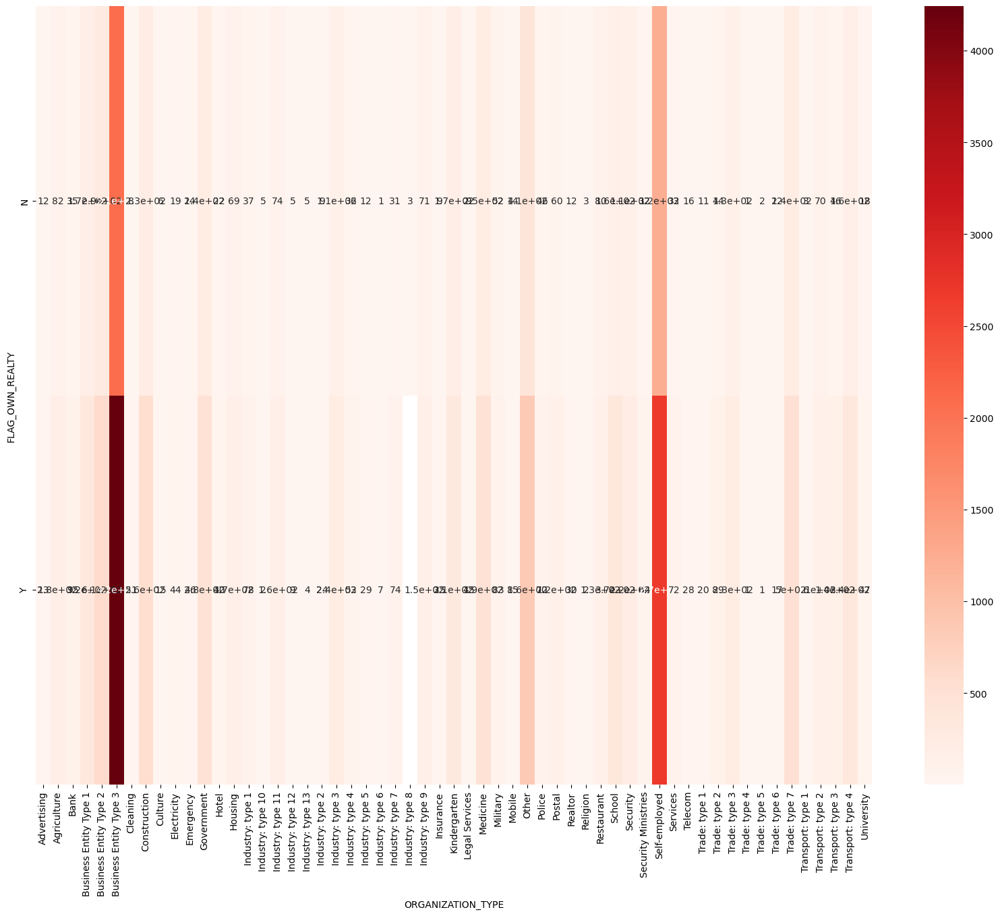

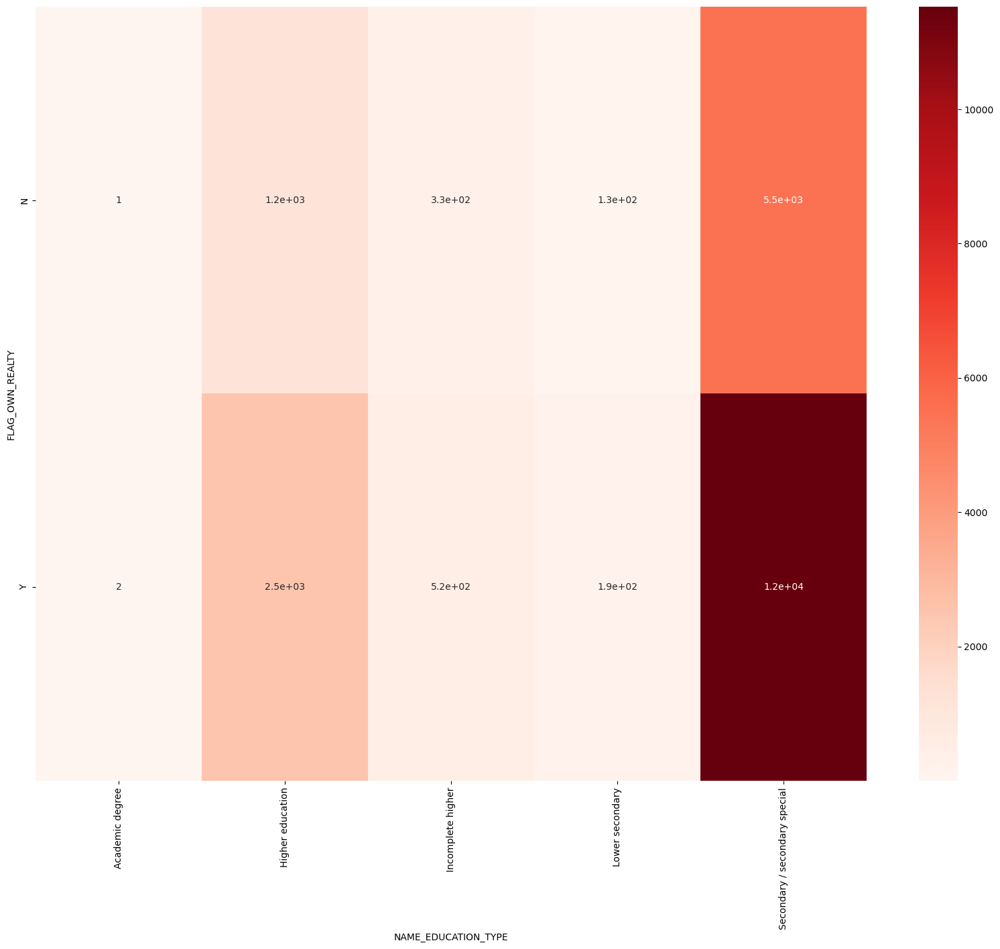

In [124]:
for i in ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS' , 'OCCUPATION_TYPE' , 'ORGANIZATION_TYPE','NAME_EDUCATION_TYPE']:
    var = pd.pivot_table(data = target1_df , values = 'TARGET' , columns = i , index = 'FLAG_OWN_REALTY' , aggfunc = 'count')
    plt.figure(figsize = (20, 15))
    sns.heatmap(var , annot = True , cmap = 'Reds')
    plt.xticks(rotation  = 90)
    plt.show()

In [125]:
target0_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_INCOME_RANGE', 'AMT_CREDIT_RANGE',
       'DAYS_EMPLOYED_RANGE', 'AMT_ANNUITY_RANGE', 'DAYS_BIRTH_RANGE'],
      dtype='object')

In [126]:
# top 10 correlations for target 0 clients : 


<AxesSubplot:>

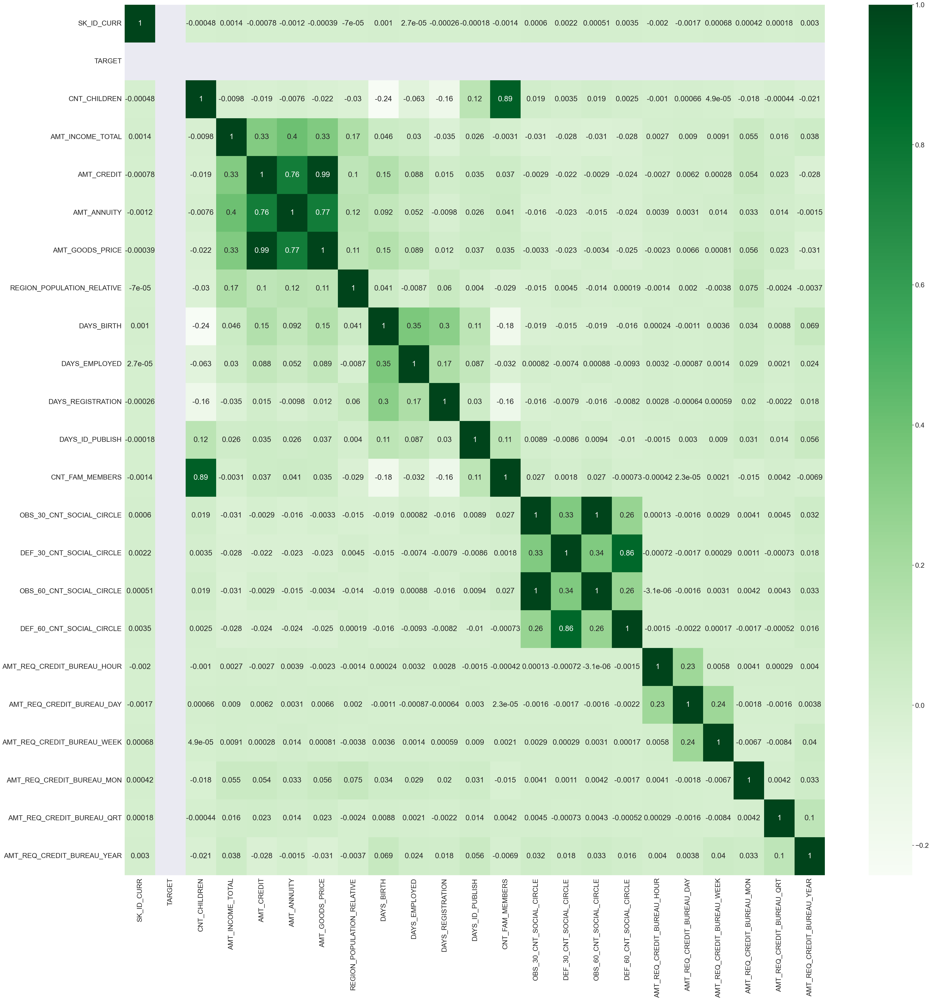

In [127]:
plt.figure(figsize = (50, 50))
sns.set(font_scale = 2)
sns.heatmap(target0_df.corr() , annot = True , cmap = 'Greens')

In [128]:
# 1 AMT_GOODS_PRICE VS AMT_CREDIT -  0.99
# 2 CNT_FAM_MEMBERS VS CNT_CHILDREN  - 0.89
# 3 DEF_CNT_SOCIAL_CIRCLE VS DEF_30_CNT_SOCIAL_CIRCLE  -  0.86
# 4 AMT_CREDIT VS AMT_ANNUITY   -  0.76
# 5 AMT_ANNUITY VS AMT_INCOME_TOTAL - 0.4
# 5 DAYS_EMPLOYED VS DAYS_BIRTH - 0.35
# 6 OBS_60_CNT_SOCIAL_CIRCLE VS DEF_30_CNT_SOCIAL_CIRCLE - 0.34
# 7 DEF_30_CNT_SOCIAL_CIRCLE VS OBS_30_CNT_SOCIAL_CIRCLE  - 0.33
# 8 AMT_INCOME_ VS AMT_CREDIT  -  0.33
# 9 DAYS_BIRTH VS DAYS_REGISTRATION - 0.3


In [129]:
# top 10 correlations for target 1 clients :

<AxesSubplot:>

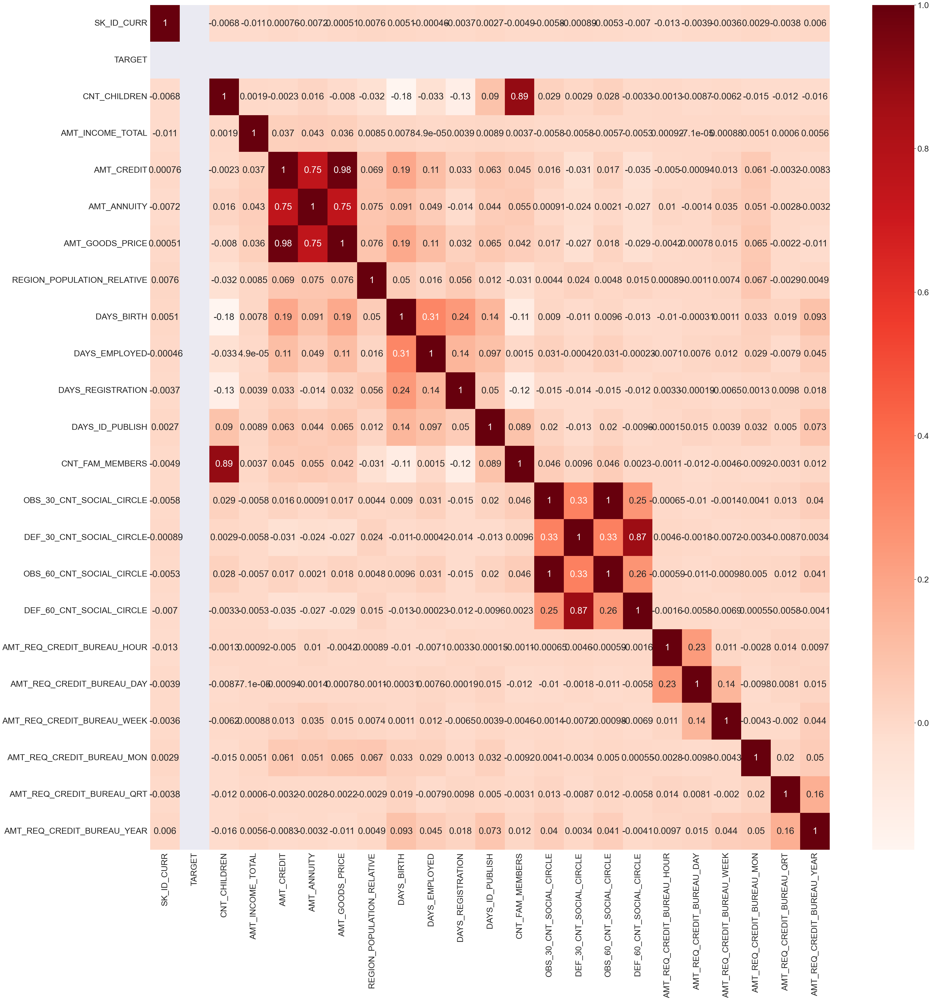

In [130]:
plt.figure(figsize = (50, 50))
sns.set(font_scale = 2.5)
sns.heatmap(target1_df.corr() , annot = True , cmap = 'Reds')

In [131]:
# 1 AMT_GOODS_PRICE VS AMT_CREDIT -  0.98
# 2 CNT_FAM_MEMBERS VS CNT_CHILDREN  - 0.89
# 3 DEF_60_CNT_SOCIAL_CIRCLE VS DEF_30_CNT_SOCIAL_CIRCLE - 0.76
# 4 DEF_30_CNT_SOCIAL_CIRCLE VS OBS_30_CNT_SOCIAL_CIRCLE  - 0.33
# 5 OBS_60_CNT_SOCIAL_CIRCLE VS DEF_30_CNT_SOCIAL_CIRCLE - 0.33
# 6 DAYS_EMPLOYED VS DAYS_BIRTH - 0.31
# 7 DEF_60_CNT_SOCIAL_CIRCLE VS OBS_60_CNT_SOCIAL_CIRCLE  - 0.26
# 8 DEF_60_CNT_SOCIAL_CIRCLE VS OBS_30_CNT_SOCIAL_CIRCLE  - 0.25
# 9 DAYS_BIRTH VS DAYS_REGISTRATION - 0.24
# 10 AMT_REQ_CREDIT_BUREAU_DAY VS AMT_REQ_CREDIT_BUREAU_HOUR  - 0.23

## data understandng for previous application dataset

In [132]:
prev_app_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [133]:
prev_app_df.shape

(1670214, 37)

In [134]:
prev_app_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [135]:
prev_app_df.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [136]:
prev_app_df.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [137]:
# dropping completely irrelevant columns as they dont provide value wrt out objective
# columns to be dropped : ['WEEKDAY_APPR_PROCESS_START' , 'HOUR_APPR_PROCESS_START' , 'FLAG_LAST_APPL_PER_CONTRACT' , 'NFLAG_LAST_APPL_IN_DAY' , 'NAME_TYPE_SUITE', 'DAYS_DECISION', 'CHANNEL_TYPE' , 'SELLERPLACE_AREA' , 'NAME_SELLER_INDUSTRY' , 'CNT_PAYMENT' , 'PRODUCT_COMBINATION' ,'NFLAG_INSURED_ON_APPROVAL' ]

In [138]:
prev_app_df.drop(['WEEKDAY_APPR_PROCESS_START' , 'HOUR_APPR_PROCESS_START' , 'FLAG_LAST_APPL_PER_CONTRACT' , 'NFLAG_LAST_APPL_IN_DAY' , 'NAME_TYPE_SUITE','DAYS_DECISION', 'CHANNEL_TYPE' , 'SELLERPLACE_AREA' , 'NAME_SELLER_INDUSTRY' , 'CNT_PAYMENT' , 'PRODUCT_COMBINATION' ,'NFLAG_INSURED_ON_APPROVAL' , 'AMT_APPLICATION' ] , axis = 1, inplace = True)

In [139]:
prev_app_df.shape

(1670214, 24)

In [140]:
null_prev = (prev_app_df.isna().sum()/len(prev_app_df))*100
null_prev.sort_values(ascending = False).head(15)

RATE_INTEREST_PRIMARY        99.643698
RATE_INTEREST_PRIVILEGED     99.643698
AMT_DOWN_PAYMENT             53.636480
RATE_DOWN_PAYMENT            53.636480
DAYS_TERMINATION             40.298129
DAYS_LAST_DUE                40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_FIRST_DUE               40.298129
DAYS_FIRST_DRAWING           40.298129
AMT_GOODS_PRICE              23.081773
AMT_ANNUITY                  22.286665
AMT_CREDIT                    0.000060
NAME_PORTFOLIO                0.000000
NAME_YIELD_GROUP              0.000000
NAME_PRODUCT_TYPE             0.000000
dtype: float64

In [141]:
# removing columns having more than 40% null values as they dont seem to have any affect on analysis

In [142]:
null_prev_above40 = null_prev[null_prev > 40]
null_prev_above40

AMT_DOWN_PAYMENT             53.636480
RATE_DOWN_PAYMENT            53.636480
RATE_INTEREST_PRIMARY        99.643698
RATE_INTEREST_PRIVILEGED     99.643698
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
dtype: float64

In [143]:
prev_app_df.drop(null_prev_above40.index , axis = 1 , inplace = True)

In [144]:
prev_app_df.shape

(1670214, 15)

In [145]:
prev_app_df.isna().sum()

SK_ID_PREV                     0
SK_ID_CURR                     0
NAME_CONTRACT_TYPE             0
AMT_ANNUITY               372235
AMT_CREDIT                     1
AMT_GOODS_PRICE           385515
NAME_CASH_LOAN_PURPOSE         0
NAME_CONTRACT_STATUS           0
NAME_PAYMENT_TYPE              0
CODE_REJECT_REASON             0
NAME_CLIENT_TYPE               0
NAME_GOODS_CATEGORY            0
NAME_PORTFOLIO                 0
NAME_PRODUCT_TYPE              0
NAME_YIELD_GROUP               0
dtype: int64

In [146]:
# 'AMT_ANNUITY' and 'AMT_GOODS_PRICE' has a lot of null values, but we will keep them as it is.

In [147]:
prev_app_df.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_CREDIT,AMT_GOODS_PRICE,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,NAME_YIELD_GROUP
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,XAP,Approved,Cash through the bank,XAP,Repeater,Mobile,POS,XNA,middle
1,2802425,108129,Cash loans,25188.615,679671.0,607500.0,XNA,Approved,XNA,XAP,Repeater,XNA,Cash,x-sell,low_action
2,2523466,122040,Cash loans,15060.735,136444.5,112500.0,XNA,Approved,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,high
3,2819243,176158,Cash loans,47041.335,470790.0,450000.0,XNA,Approved,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,middle
4,1784265,202054,Cash loans,31924.395,404055.0,337500.0,Repairs,Refused,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,high


In [148]:
for i in prev_app_df.columns:
    print(i , prev_app_df[i].unique())

SK_ID_PREV [2030495 2802425 2523466 ... 2659632 2785582 2418762]
SK_ID_CURR [271877 108129 122040 ... 253940 353284 191629]
NAME_CONTRACT_TYPE ['Consumer loans' 'Cash loans' 'Revolving loans' 'XNA']
AMT_ANNUITY [ 1730.43  25188.615 15060.735 ... 15708.15   8546.94  14704.29 ]
AMT_CREDIT [ 17145.   679671.   136444.5  ... 977724.   626796.   436370.22]
AMT_GOODS_PRICE [ 17145.   607500.   112500.   ... 332596.08 373230.72 267295.5 ]
NAME_CASH_LOAN_PURPOSE ['XAP' 'XNA' 'Repairs' 'Everyday expenses' 'Car repairs'
 'Building a house or an annex' 'Other' 'Journey'
 'Purchase of electronic equipment' 'Medicine' 'Payments on other loans'
 'Urgent needs' 'Buying a used car' 'Buying a new car'
 'Buying a holiday home / land' 'Education' 'Buying a home' 'Furniture'
 'Buying a garage' 'Business development' 'Wedding / gift / holiday'
 'Hobby' 'Gasification / water supply' 'Refusal to name the goal'
 'Money for a third person']
NAME_CONTRACT_STATUS ['Approved' 'Refused' 'Canceled' 'Unused offer']


In [149]:
# lots of columns having 'XNA' values, we will keep them as it is. 
# As these are historical data, imputation without any basis can affect.

In [150]:
for i in prev_app_df.columns:
    print(i , prev_app_df[i].nunique())

SK_ID_PREV 1670214
SK_ID_CURR 338857
NAME_CONTRACT_TYPE 4
AMT_ANNUITY 357959
AMT_CREDIT 86803
AMT_GOODS_PRICE 93885
NAME_CASH_LOAN_PURPOSE 25
NAME_CONTRACT_STATUS 4
NAME_PAYMENT_TYPE 4
CODE_REJECT_REASON 9
NAME_CLIENT_TYPE 4
NAME_GOODS_CATEGORY 28
NAME_PORTFOLIO 5
NAME_PRODUCT_TYPE 3
NAME_YIELD_GROUP 5


In [151]:
cont_cols_prev = []
cat_cols_prev = []

In [152]:
for i in prev_app_df.columns:
    if prev_app_df[i].nunique() > 50:
        cont_cols_prev.append(i)
    else:
        cat_cols_prev.append(i)

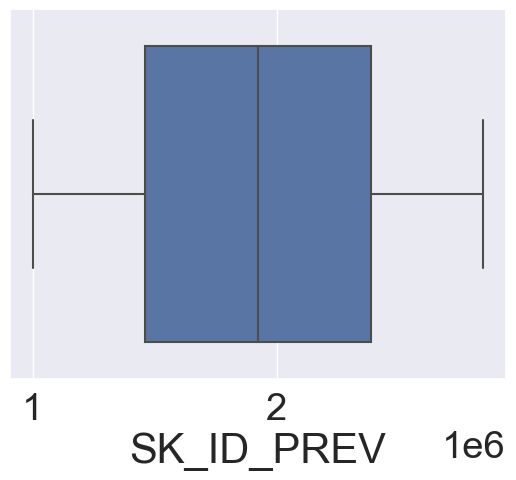

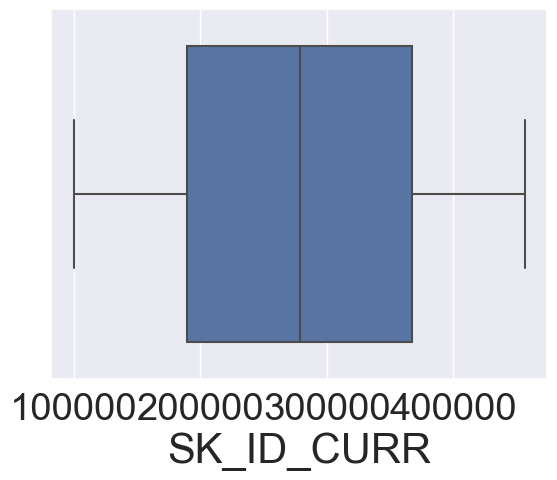

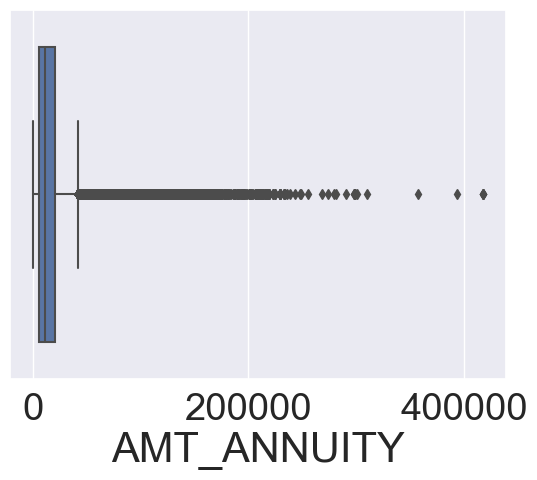

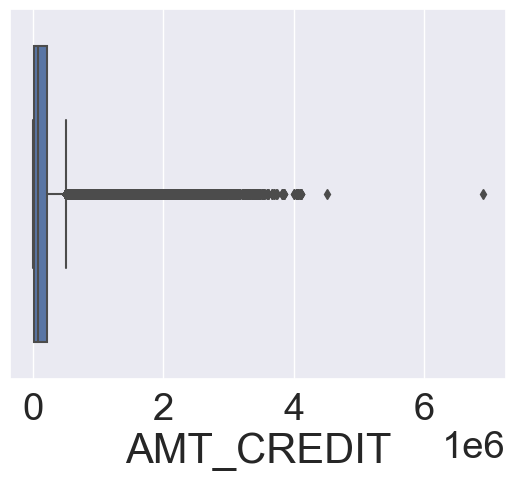

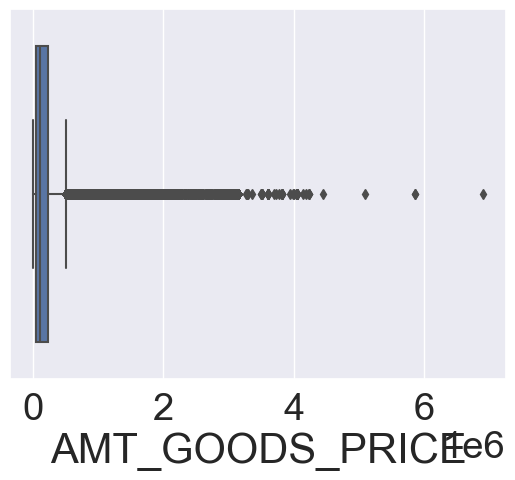

In [153]:
for i in cont_cols_prev:
    sns.boxplot(prev_app_df[i])
    plt.show()

In [154]:
# As there are many expected outliers present in the dataset, we will use median as a agg func to understand the data

<AxesSubplot:xlabel='NAME_CONTRACT_STATUS'>

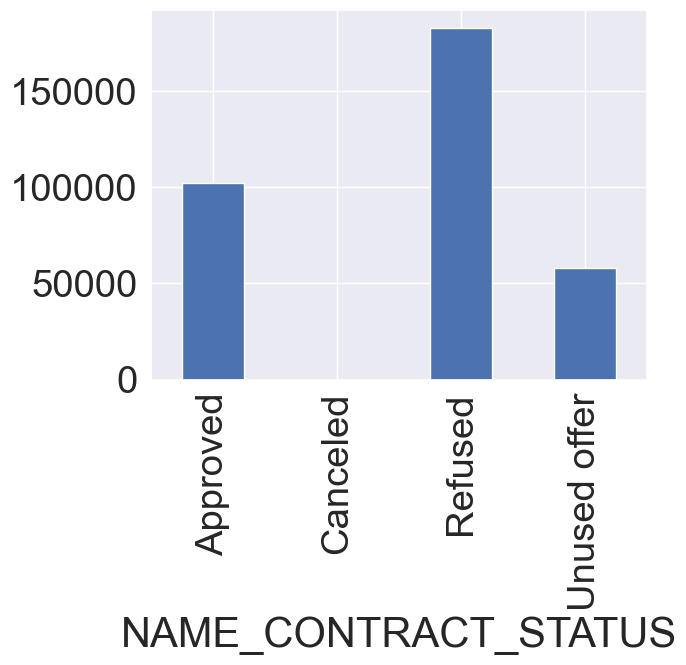

In [155]:
prev_app_df.groupby('NAME_CONTRACT_STATUS')['AMT_CREDIT'].median().plot.bar()

<AxesSubplot:xlabel='NAME_CASH_LOAN_PURPOSE'>

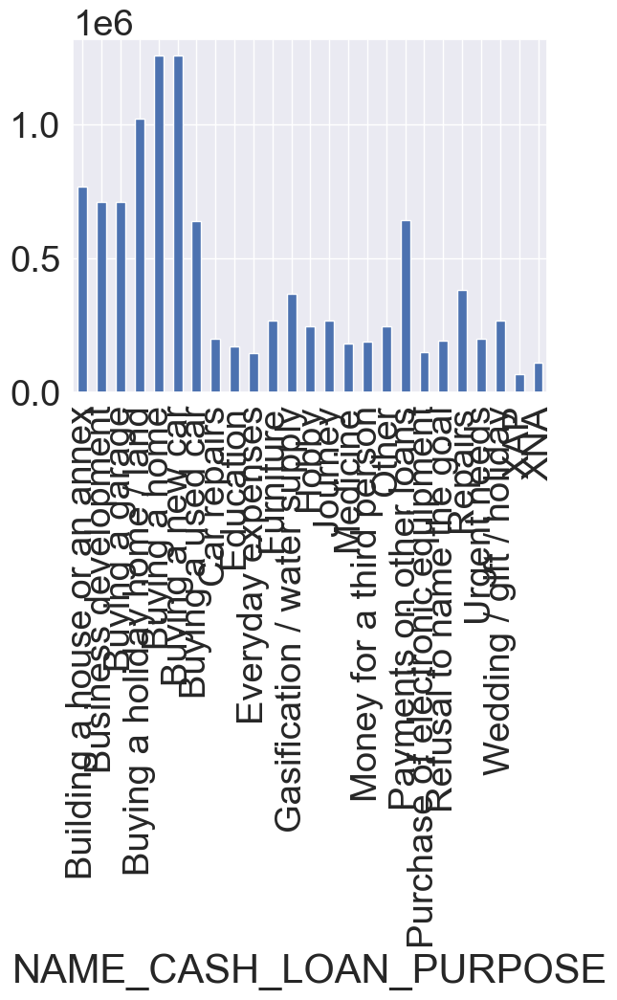

In [156]:
prev_app_df.groupby('NAME_CASH_LOAN_PURPOSE')['AMT_CREDIT'].median().plot.bar()

In [157]:
# max loan has been given out for buying a home or a car, these are the most risky endevours in terms of default.

In [158]:
c1 = prev_app_df.NAME_CASH_LOAN_PURPOSE == 'Buying a home'
c2 = prev_app_df.NAME_CONTRACT_STATUS == 'Approved'
prev_app_df[c1 & c2].AMT_CREDIT.describe()

count    2.000000e+02
mean     9.583648e+05
std      5.982523e+05
min      9.891000e+04
25%      5.032384e+05
50%      8.713328e+05
75%      1.288350e+06
max      3.374532e+06
Name: AMT_CREDIT, dtype: float64

In [159]:
c1 = prev_app_df.NAME_CASH_LOAN_PURPOSE == 'Buying a home'
c2 = prev_app_df.NAME_CONTRACT_STATUS == 'Refused'
prev_app_df[c1 & c2].AMT_CREDIT.describe()

count    6.260000e+02
mean     1.416083e+06
std      7.953018e+05
min      1.273500e+05
25%      7.908300e+05
50%      1.288350e+06
75%      1.928304e+06
max      3.690000e+06
Name: AMT_CREDIT, dtype: float64

In [160]:
# from the above, it seems with rise in credit amount , contratcts tend to be rejected.

In [161]:
# undertstanding most rejections 

Repeater


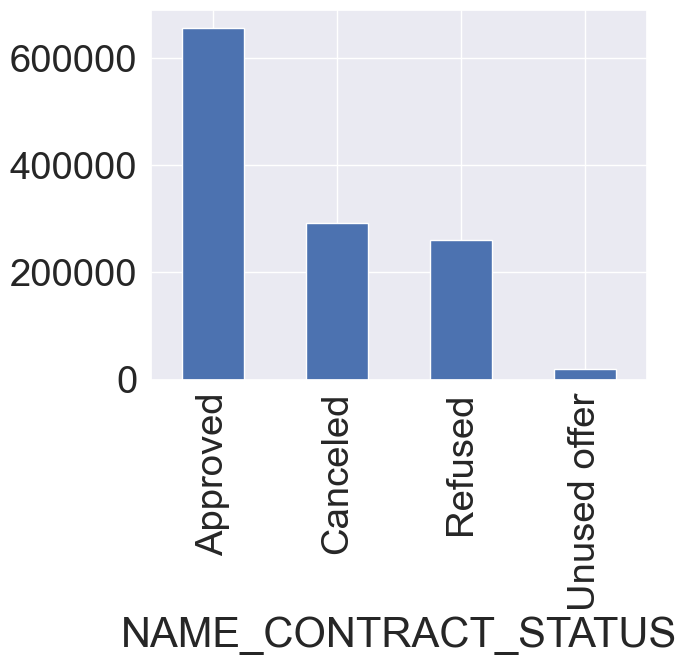

New


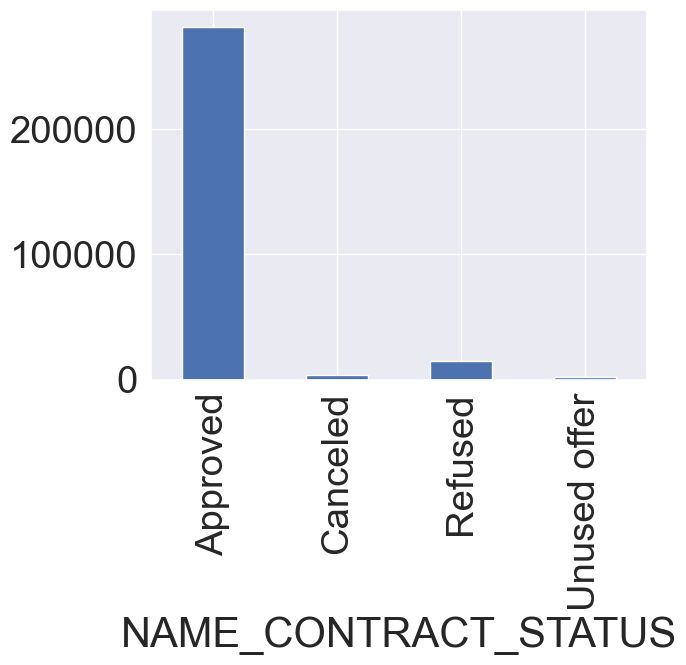

Refreshed


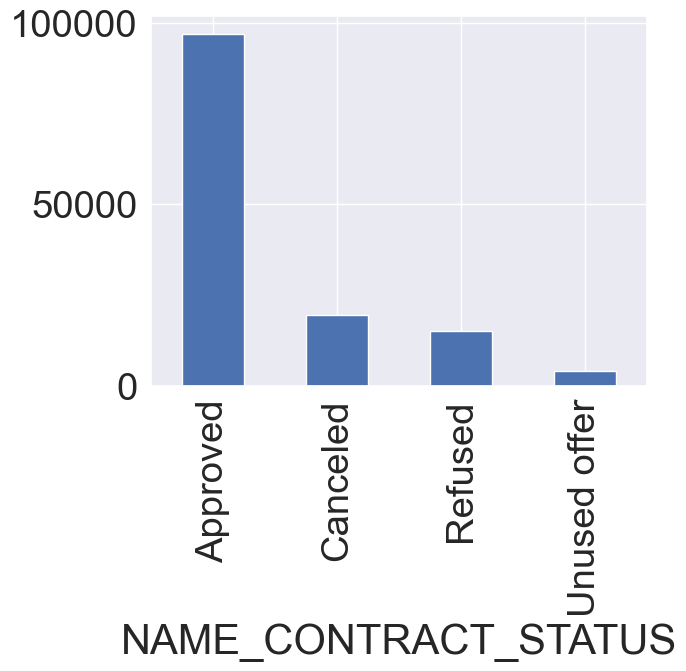

XNA


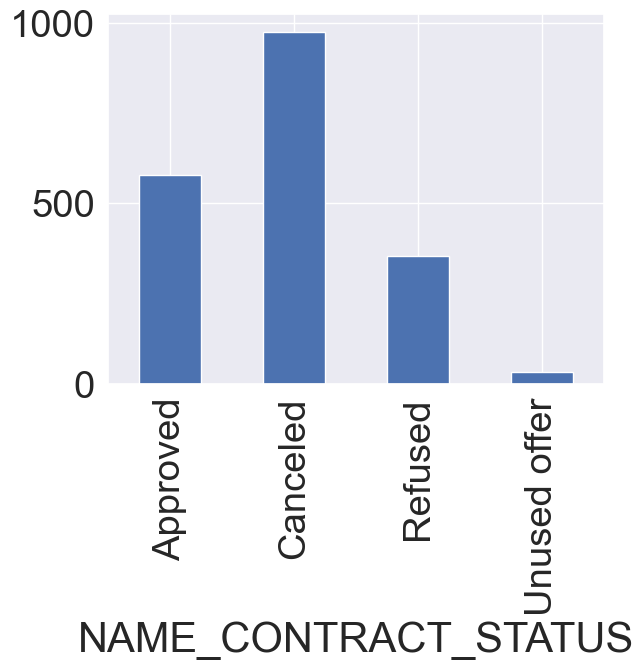

In [162]:
for i in prev_app_df.NAME_CLIENT_TYPE.unique():
    print(i)
    prev_app_df[prev_app_df.NAME_CLIENT_TYPE == i].groupby('NAME_CONTRACT_STATUS')['AMT_CREDIT'].count().plot.bar()
    plt.show()

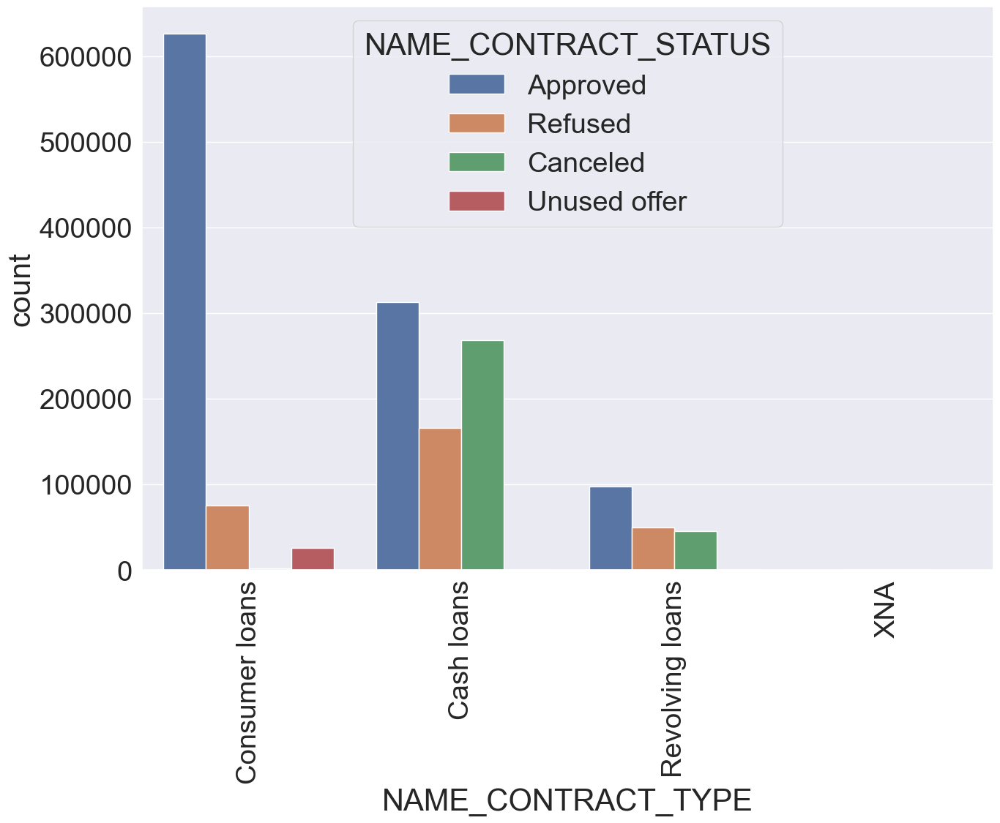

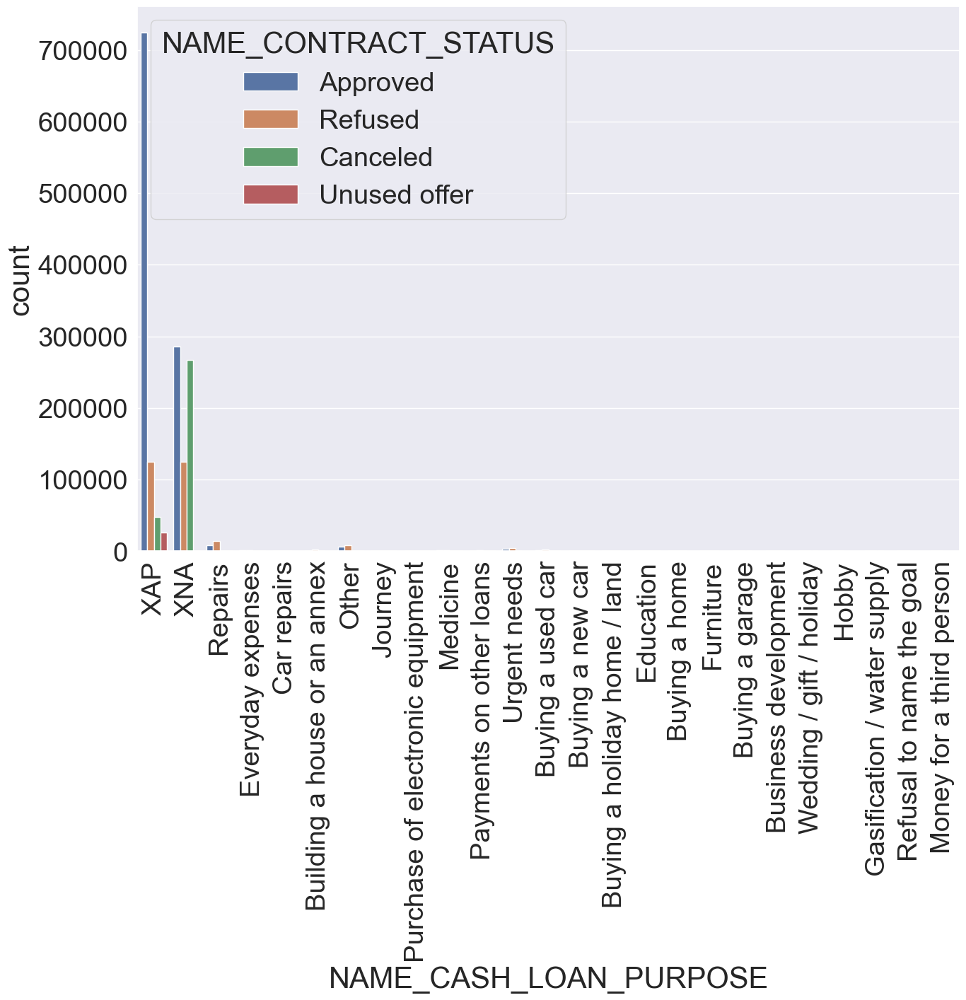

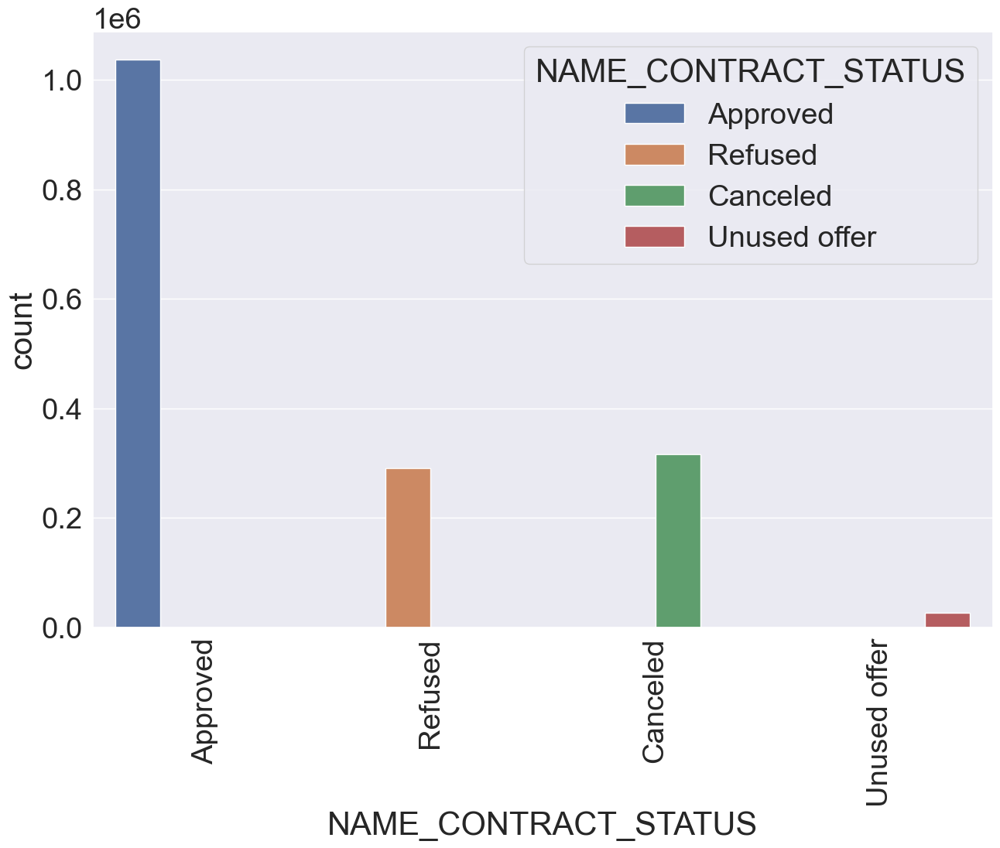

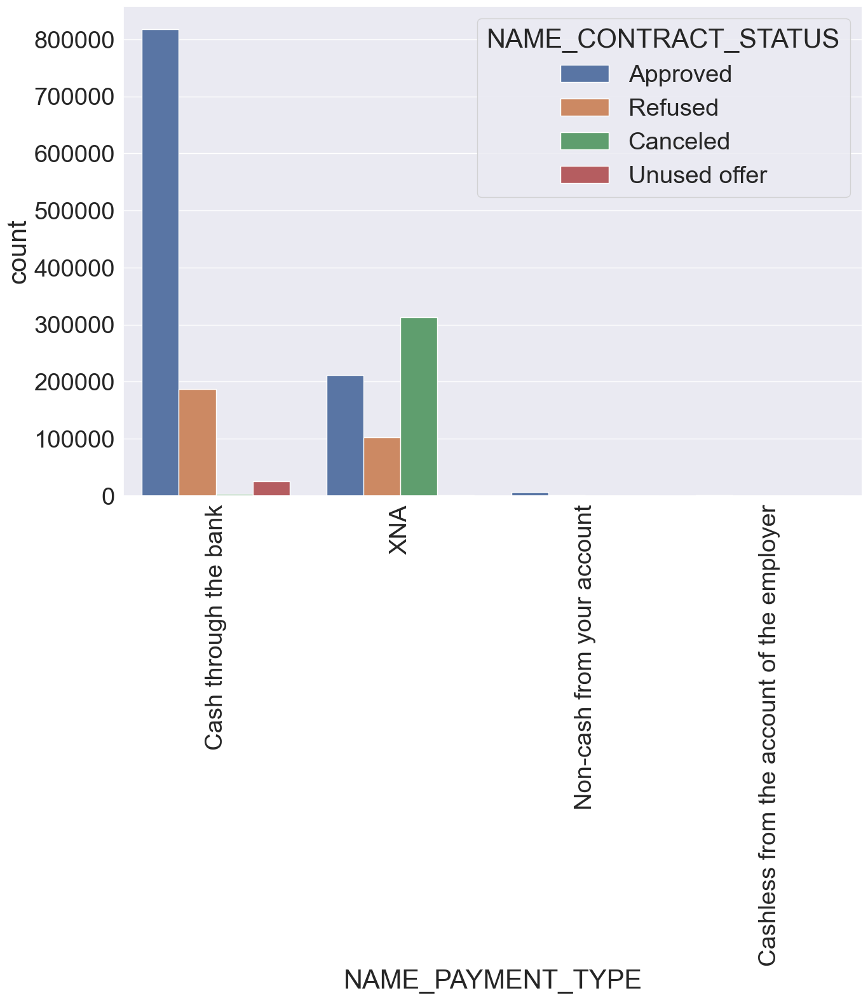

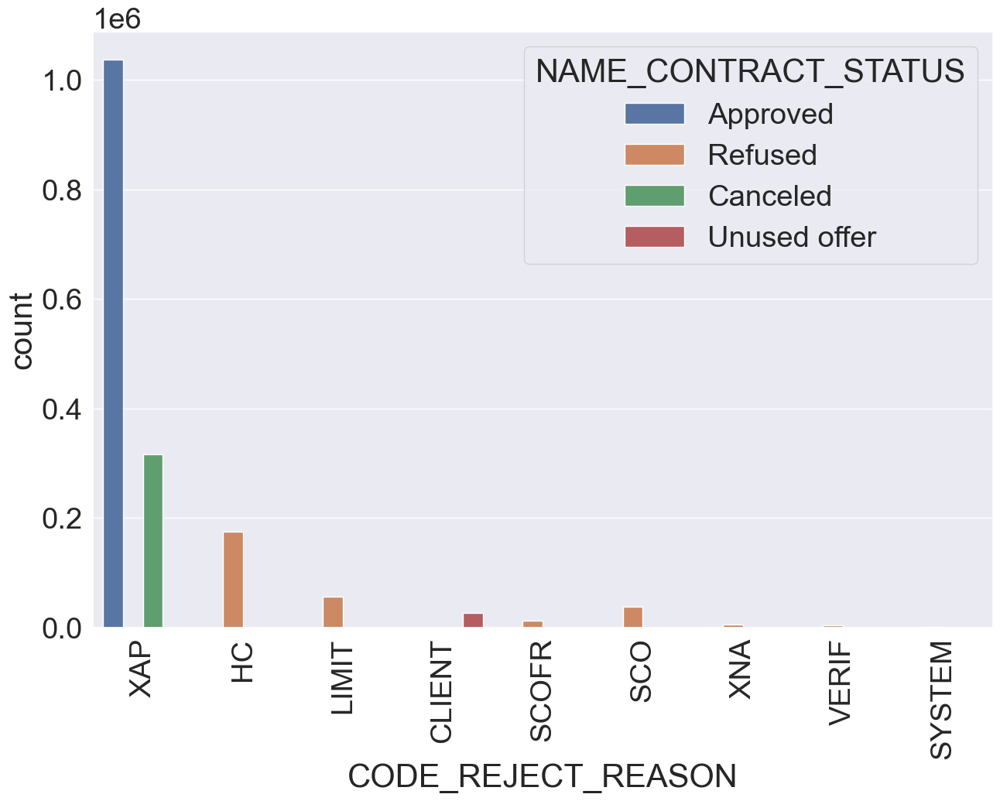

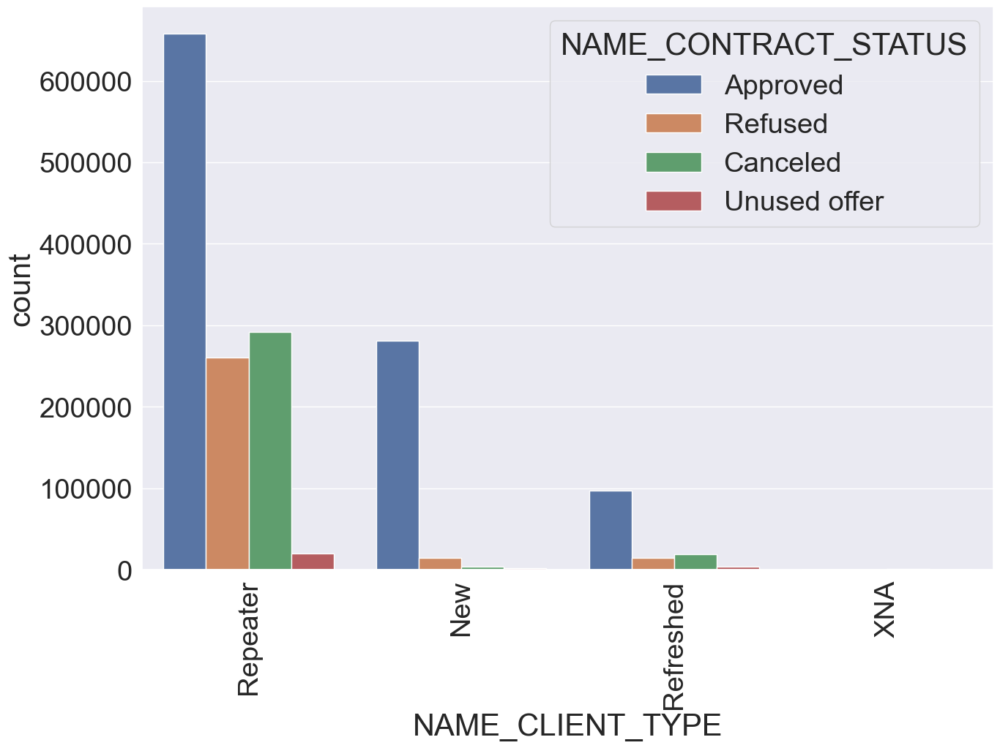

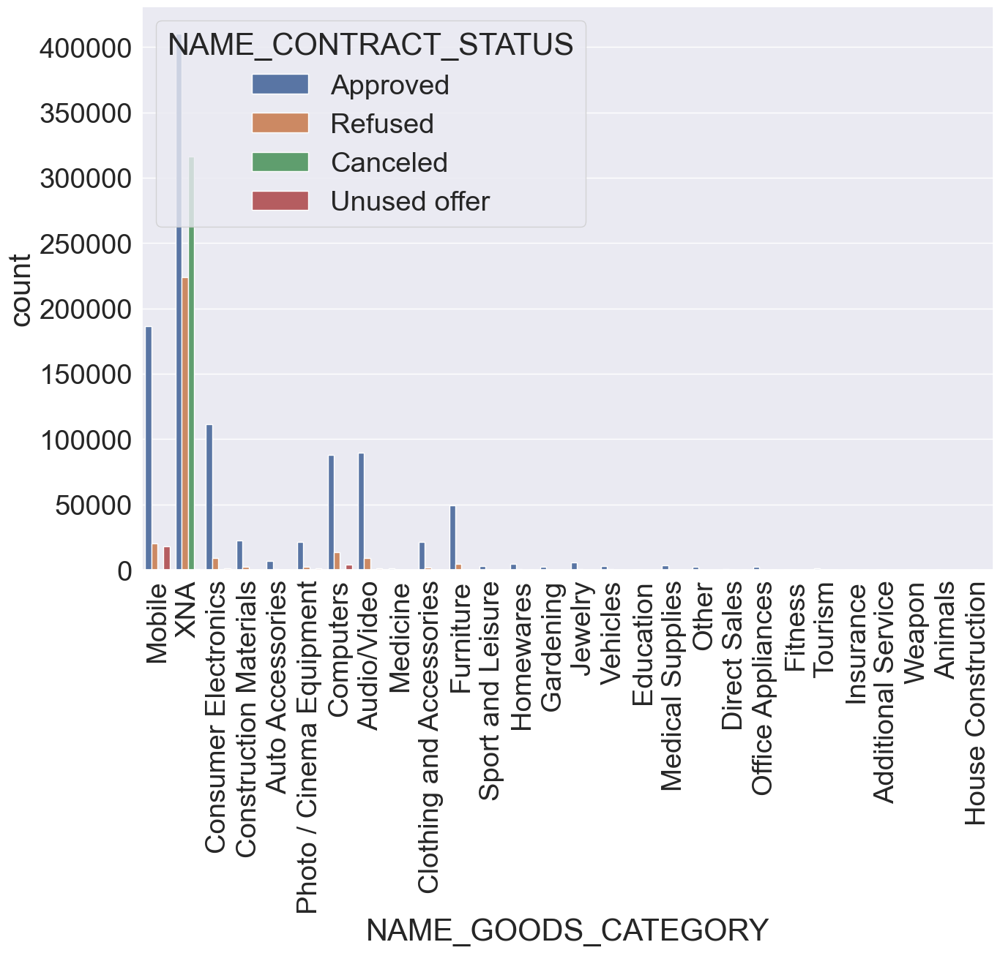

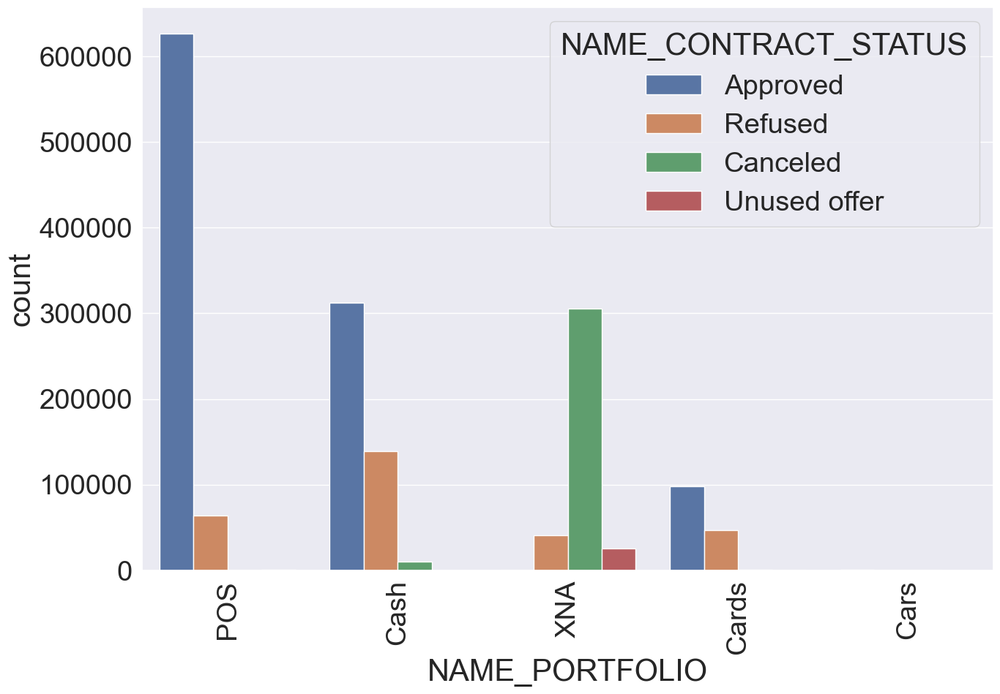

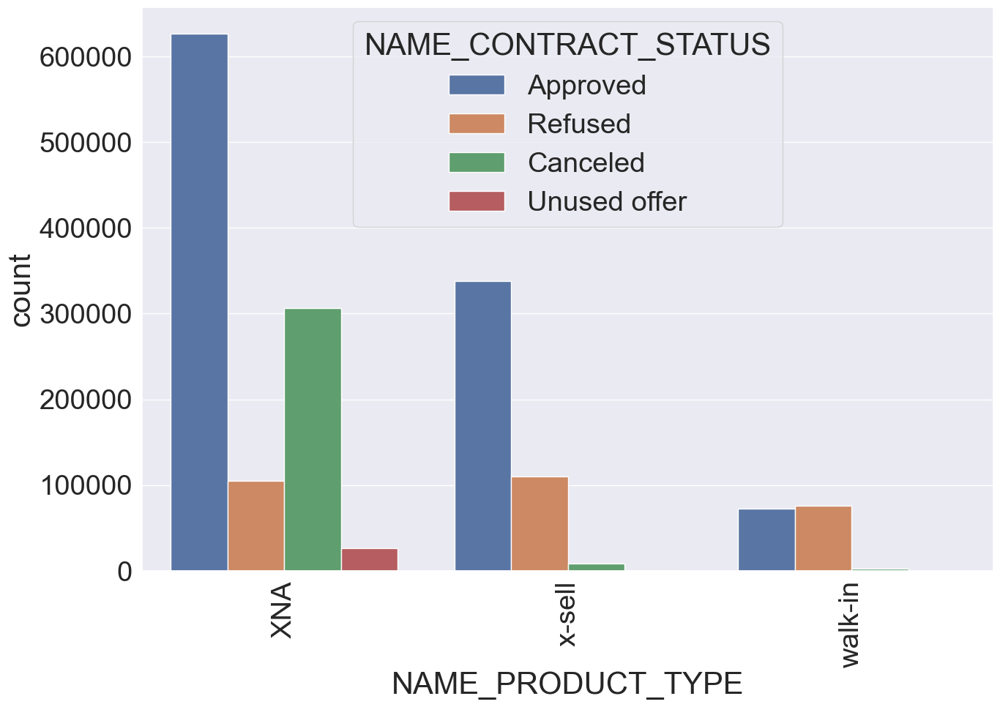

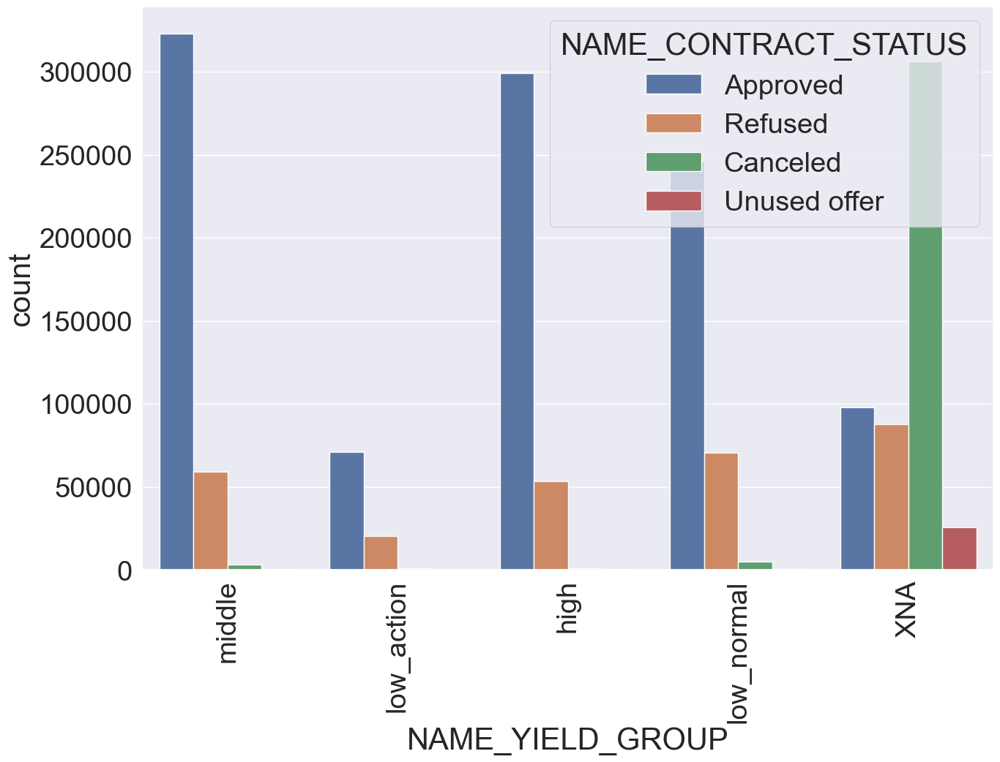

In [163]:
for i in cat_cols_prev:
    plt.figure(figsize = (15, 10))
    sns.countplot(x = prev_app_df[i] , hue = prev_app_df.NAME_CONTRACT_STATUS)
    plt.xticks(rotation = 90)
    plt.show()

In [164]:
# Observations : 
# 1. more rejection are for cash loans type and related to repairs.
# 2. Repeaters type of customers having most of the rejections.
# 3. Loans related to computers having more rejections.
# 4. low_normal type of interest rate are having more rejections.
# 5. Laons for repairs are having lot of rejections. 

In [165]:
 # merging the prv app data with app data

In [166]:
combined_df = pd.merge(left=df_new , right=prev_app_df , how='inner', on='SK_ID_CURR', suffixes='_x')
combined_df.shape

(1140047, 52)

In [167]:
combined_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_', 'AMT_ANNUITY_', 'AMT_GOODS_PRICE_', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_INCOME_RANGE', 'AMT_CREDIT_RANGE',
       'DAYS_EMPLOYED_RANGE', 'AMT_ANNUITY_RANGE', 'DAYS_BIRTH_RANGE',
       'SK_ID_PREV', 'NAME_CONTRACT_TYPEx', 'AMT_ANNUITYx', 'AMT_CREDITx',
       'AMT

In [168]:
dup_list = []
for i in combined_df.columns:
    if i[-1] == 'x':
        dup_list.append(i)

In [169]:
dup_list

['NAME_CONTRACT_TYPEx', 'AMT_ANNUITYx', 'AMT_CREDITx', 'AMT_GOODS_PRICEx']

In [170]:
combined_df = combined_df.rename({'NAME_CONTRACT_TYPEx' : 'NAME_CONTRACT_TYPE_prev' , 'AMT_ANNUITYx' : 'AMT_ANNUITY_prev' , 'AMT_CREDITx' : 'AMT_CREDIT_prev', 'AMT_GOODS_PRICEx' : 'AMT_GOODS_PRICE_prev'} , axis = 1)

In [171]:
combined_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_', 'AMT_ANNUITY_', 'AMT_GOODS_PRICE_', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_INCOME_RANGE', 'AMT_CREDIT_RANGE',
       'DAYS_EMPLOYED_RANGE', 'AMT_ANNUITY_RANGE', 'DAYS_BIRTH_RANGE',
       'SK_ID_PREV', 'NAME_CONTRACT_TYPE_prev', 'AMT_ANNUITY_prev',
       'AMT_CREDIT

In [172]:
combined_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_,AMT_ANNUITY_,...,AMT_GOODS_PRICE_prev,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,NAME_YIELD_GROUP
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,179055.0,XAP,Approved,XNA,XAP,New,Vehicles,POS,XNA,low_normal
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,900000.0,XNA,Approved,XNA,XAP,Repeater,XNA,Cash,x-sell,low_normal
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,337500.0,XAP,Approved,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,middle
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,68809.5,XAP,Approved,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,middle
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,24282.0,XAP,Approved,Cash through the bank,XAP,New,Mobile,POS,XNA,middle


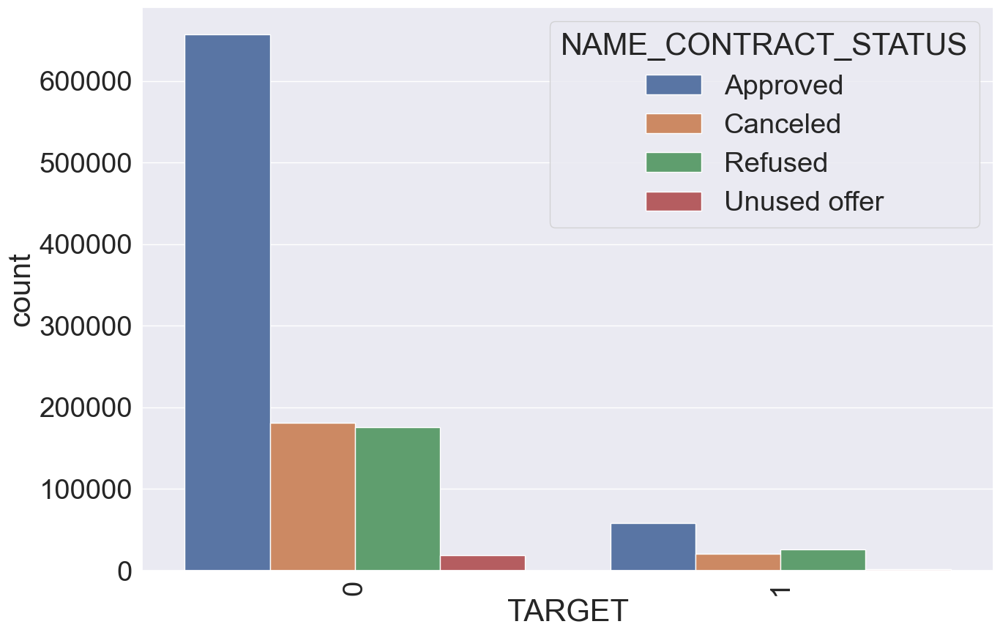

In [173]:
plt.figure(figsize = (15, 10))
sns.countplot(x = combined_df['TARGET'] , hue = combined_df.NAME_CONTRACT_STATUS)
plt.xticks(rotation = 90)
plt.show()

In [174]:
comb_target0_df=combined_df.loc[combined_df["TARGET"]==0]
comb_target1_df=combined_df.loc[combined_df["TARGET"]==1]

In [175]:
# we can investigate those results for which loan has been approved but having repayment difficulties.

In [176]:
comb_target1_df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_', 'AMT_ANNUITY_', 'AMT_GOODS_PRICE_', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'ORGANIZATION_TYPE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_INCOME_RANGE', 'AMT_CREDIT_RANGE',
       'DAYS_EMPLOYED_RANGE', 'AMT_ANNUITY_RANGE', 'DAYS_BIRTH_RANGE',
       'SK_ID_PREV', 'NAME_CONTRACT_TYPE_prev', 'AMT_ANNUITY_prev',
       'AMT_CREDIT

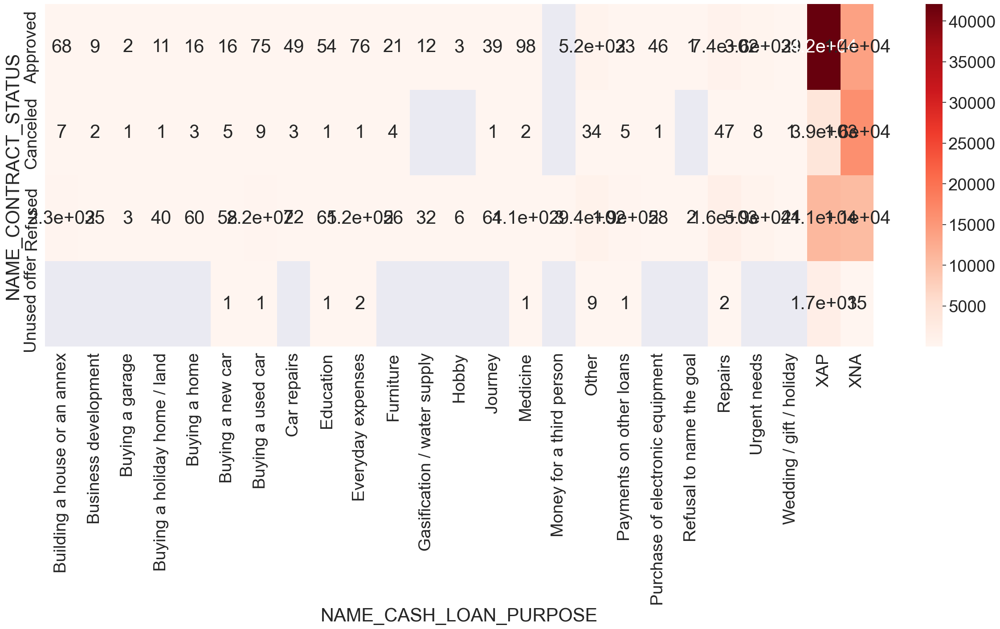

In [177]:

pivot_comb_1 = pd.pivot_table(data  = comb_target1_df ,  index = 'NAME_CONTRACT_STATUS' , columns =  'NAME_CASH_LOAN_PURPOSE', values = 'TARGET' , aggfunc = 'count')
plt.figure(figsize = (30, 10))
sns.heatmap(pivot_comb_1 , annot = True , cmap = 'Reds')
plt.show()


In [178]:
# Repairs category are most likely to defualt after approval

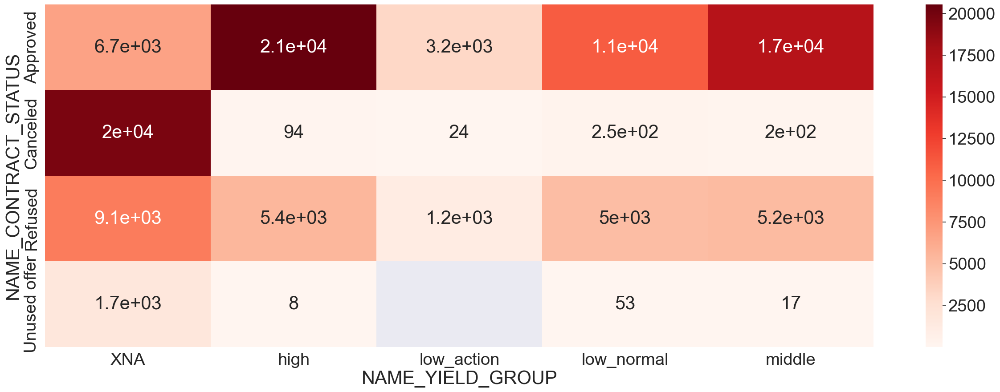

In [179]:
pivot_comb_2 = pd.pivot_table(data  = comb_target1_df ,  index = 'NAME_CONTRACT_STATUS' , columns =  'NAME_YIELD_GROUP', values = 'TARGET' , aggfunc = 'count')
plt.figure(figsize = (30, 10))
sns.heatmap(pivot_comb_2 , annot = True , cmap = 'Reds')
plt.show()


In [180]:
# it seems loans with higher interest rates are less likely to be repaid after getiing approved

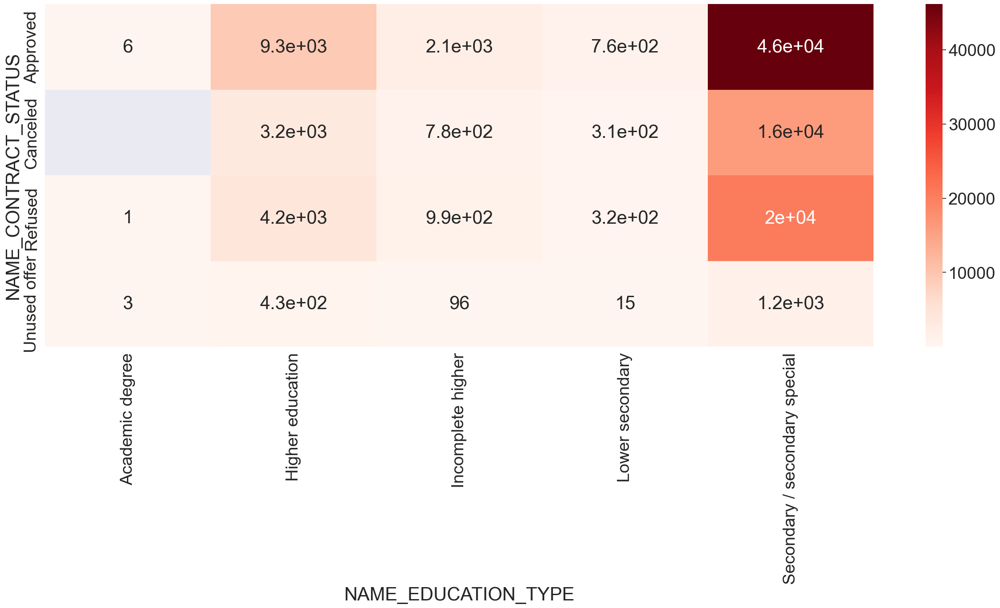

In [181]:
pivot_comb_3 = pd.pivot_table(data  = comb_target1_df ,  index = 'NAME_CONTRACT_STATUS' , columns =  'NAME_EDUCATION_TYPE', values = 'TARGET' , aggfunc = 'count')
plt.figure(figsize = (30, 10))
sns.heatmap(pivot_comb_3 , annot = True , cmap = 'Reds')
plt.show()

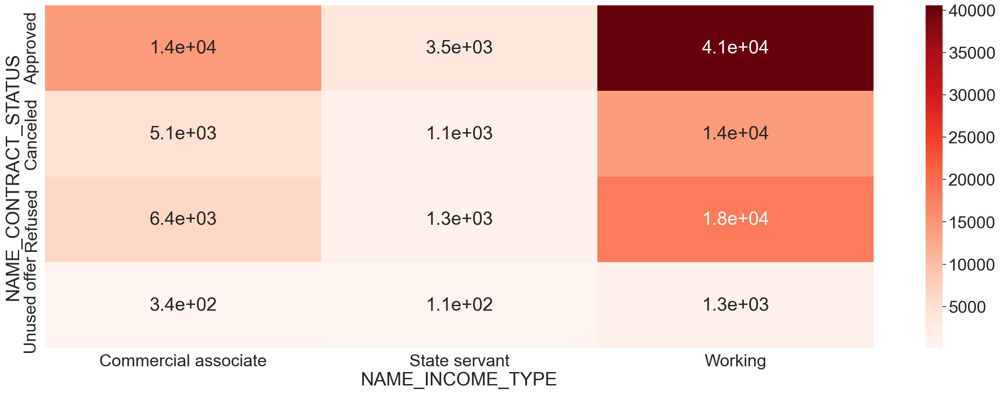

In [182]:
pivot_comb_4 = pd.pivot_table(data  = comb_target1_df ,  index = 'NAME_CONTRACT_STATUS' , columns =  'NAME_INCOME_TYPE', values = 'TARGET' , aggfunc = 'count')
plt.figure(figsize = (30, 10))
sns.heatmap(pivot_comb_4 , annot = True , cmap = 'Reds')
plt.show()

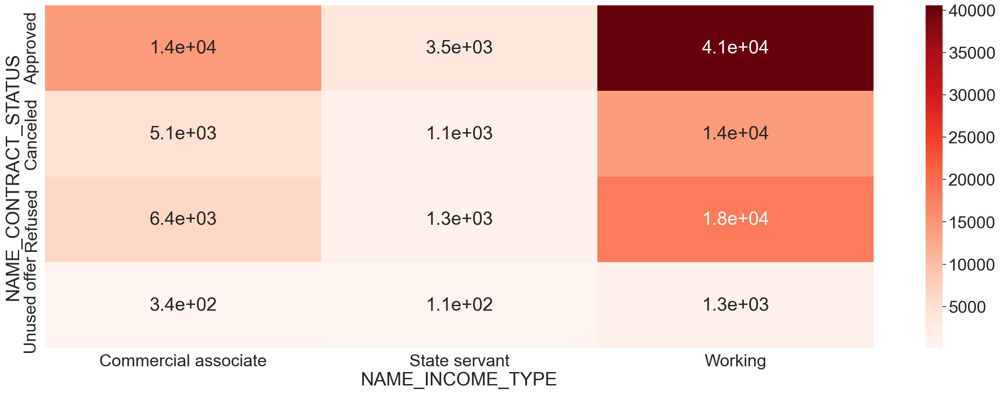

In [183]:
pivot_comb_4 = pd.pivot_table(data  = comb_target1_df ,  index = 'NAME_CONTRACT_STATUS' , columns =  'NAME_INCOME_TYPE', values = 'TARGET' , aggfunc = 'count')
plt.figure(figsize = (30, 10))
sns.heatmap(pivot_comb_4 , annot = True , cmap = 'Reds')
plt.show()

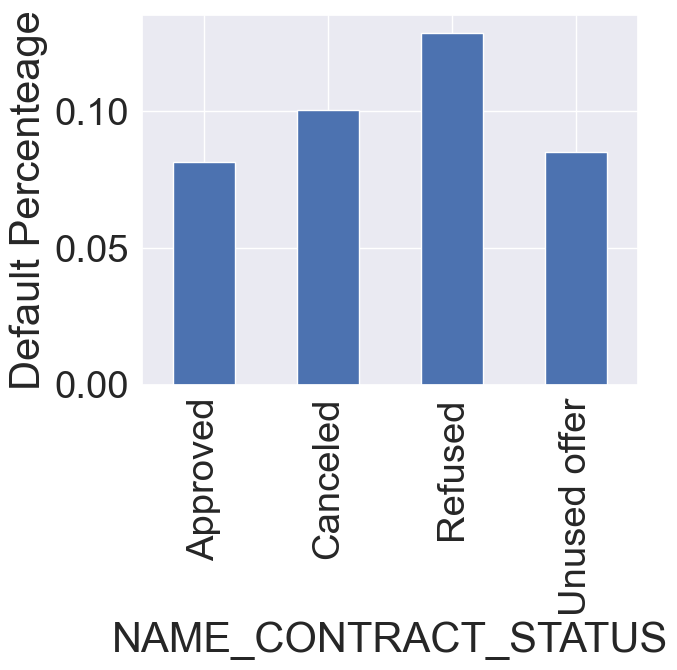

In [199]:
i_repay = comb_target0_df.groupby('NAME_CONTRACT_STATUS')['TARGET'].count()
i_def = comb_target1_df.groupby('NAME_CONTRACT_STATUS')['TARGET'].count()
percentage_default = i_def / (i_repay + i_def)
percentage_default.plot.bar()
plt.ylabel('Default Percenteage')
plt.show()

In [185]:
# from the above plots, it can be concluded, percentage of earlier refused applications tend to default more. 
# So refusal mechanism of the bank is effective in that sense.

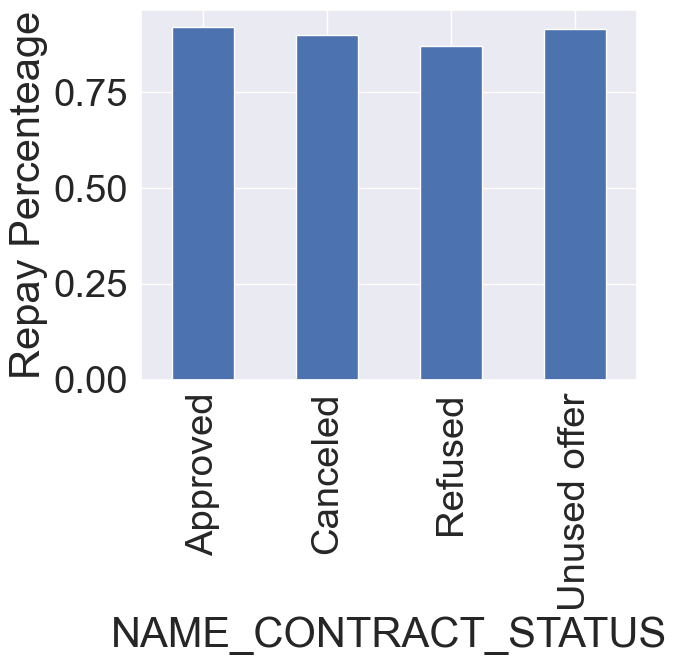

In [201]:
i_repay = comb_target0_df.groupby('NAME_CONTRACT_STATUS')['TARGET'].count()
i_def = comb_target1_df.groupby('NAME_CONTRACT_STATUS')['TARGET'].count()
percentage_default = i_repay / (i_repay + i_def)
percentage_default.plot.bar()
plt.ylabel('Repay Percenteage')
plt.show()

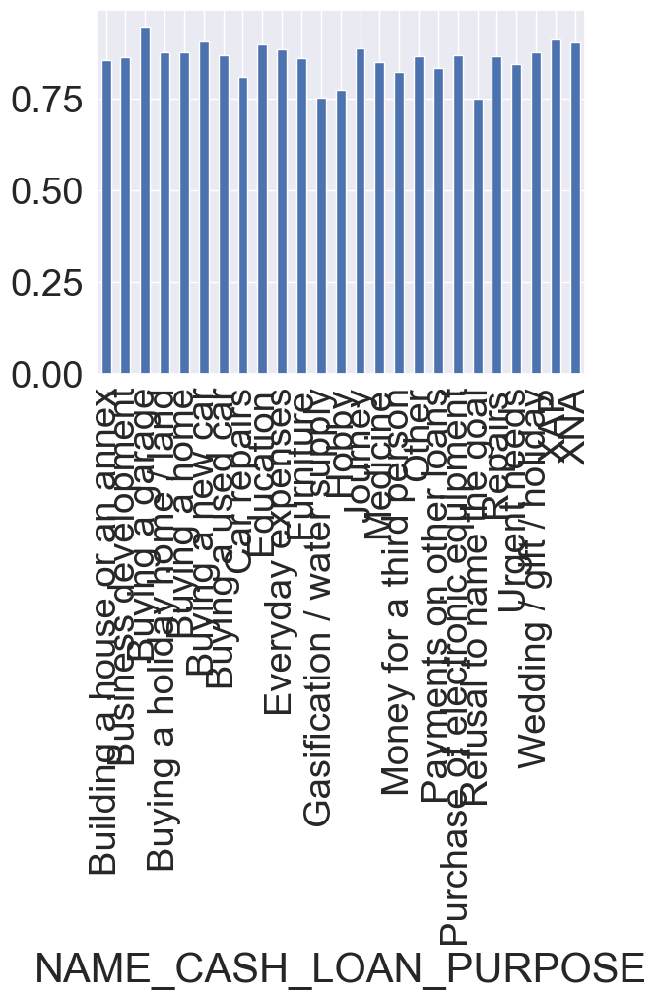

In [186]:
i_repay = comb_target0_df.groupby('NAME_CASH_LOAN_PURPOSE')['TARGET'].count()
i_def = comb_target1_df.groupby('NAME_CASH_LOAN_PURPOSE')['TARGET'].count()
percentage_default = i_repay / (i_repay + i_def)
percentage_default.plot.bar()
plt.show()

In [187]:
# with this, we can see , a lot of loans of 'Repairs' purpose were rejected earlier. those which were approved are one of lowest with repay percentage. 

## Summary :

In [188]:
# as can be seen, 'AMT_INCOME_TOTAL' , 'AMT_CREDIT' , 'AMT_ANNUITY' , 'DAYS_EMPLOYED' are having a lot of outliers as expected.
# these plots are positively scewed.
# We will ignore the outliers for now as these are pretty normal.
# We will create bins for 'AMT_INCOME_TOTAL' , 'AMT_CREDIT' and 'DAYS_EMPLOYED' to find insights.

In [189]:
# observations : 
# 1. People with more days with employment in the current job are more likely to repay which is expected due to stability factor.
# 2. Also generally older people are more likely to repay.
# 3. There are a lot of outliers (except in 'DAYS_BIRTH' and 'DAYS_ID_PUBLISH') in the columns, which are expected in this kind of dataset.
# less obvious observations : 
# 1. People having higher annuity and higher credit amount are more likely to repay.
# 2. People who changed their identity document or registration recenly are less likely to repay.

In [190]:
# from the above plots it can be seen, people with higher income tend to repay and less likely to default.
# Also , we see people with more days of current employment tend to repay due to more stability.
# annuity amount in the range of 30000-35000 has more default likelyness.

In [191]:
#observations : 
# 1.Cash loans are at a higher risk of default.
# 2.With more children the chance of default is generally higher.
# 3.People in 'Working' category less likely to repay.
# 4. People with lower levels of education and with low skills have high deafult rate.
# 5. Student, Pensioner and Businessman are less likely to default.

In [192]:
#people working in 'buseness entity type 3' and 'self employed' are of higher tendency to default.

In [193]:
#'Working' people with 'seconday/seconday special' are more in number to dafault.
# Similarly elf employed type people are more in mumbers to default aross education levels.
# people having academic degree seems to have lowest rate of defaults.

In [194]:
# Observations : 
# 1. more rejection are for cash loans type and related to repairs.
# 2. Repeaters type of customers having most of the rejections.
# 3. Loans related to computers having more rejections.
# 4. low_normal type of interest rate are having more rejections.
# 5. Laons for repairs are having lot of rejections. 

In [195]:
# from the above plots, it can be concluded, percentage of earlier refused applications tend to default more. 
# So refusal mechanism of the bank is effective in that sense.

In [196]:
# it can also be noted, a significant percentage of earlier cancelled applications tend to repay as well, 
# so bank should work on how to convince the consumers to accept the loan , by either reducing interest rate or providing other benefits.